In [1]:
import requests
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from scipy.stats import multivariate_normal, multivariate_t, norm
import networkx as nx
import sys
sys.path.insert(0, 'C:/Users/User/Code/DyGraph/src')
sys.path.insert(0, 'C:/Users/User/Code/DyGraph')

import DyGraph as dg
import port_measures as pm
import matplotlib.pyplot as plt
import seaborn as sns
import tqdm
import scipy
from scipy.optimize import minimize

import pickle





In [2]:
def gen_all_all_zero(d,s, v1 = 1.1, v2 = 1.1):

    while True:
        # G =nx.erdos_renyi_graph(d, s, seed=42)


        # A = np.array(nx.adjacency_matrix(G).todense())
        # A[np.tril_indices(d)] = 0
        # U = np.random.binomial(1,0.5,  size = (d,d))
        # A = np.multiply(A, U*np.random.uniform(-0.6,-0.2, size = (d,d)) + (1-U)*np.random.uniform(0.2,0.6, size = (d,d)))
        # A = A+A.T
        # np.fill_diagonal(A, np.sum(np.abs(A),axis=1))


        k = d
        sparsity = s
        # generate the symmetric sparsity mask
        mask = np.random.uniform(size=(k,k))
        mask = mask * (mask < sparsity)
        mask[np.tril_indices(k,0)] = 0
        mask = mask + mask.T + np.identity(k)
        mask[mask > 0] = 1

        # generate the symmetric precision matrix
        A = np.random.uniform( size = (k,k))
        A[np.tril_indices(k,0)] = 0
        A = A + A.T + np.identity(k)

        # apply the reqired sparsity
        A = A * mask

        # force it to be positive definite
        l,u = np.linalg.eigh(A)
        A = A - (np.min(l)-.1) * np.identity(k)

        A2 = A.copy()
        A2_SIGNS = np.sign(A2)
        A2 = np.power(np.abs(A2), v1)
        A2 = A2*A2_SIGNS
        np.fill_diagonal(A2,np.diag(A))

        A3 = A2.copy()
        A3_SIGNS = np.sign(A3)
        A3 = np.power(np.abs(A3), v2)
        A3 = A3*A3_SIGNS
        np.fill_diagonal(A3,np.diag(A))


        try:
            np.linalg.inv(A)
            np.linalg.inv(A2)
            np.linalg.inv(A3)
        except:
            continue


        break

    return np.array([A, A2, A3])


def my_hdtest(Z, cov_Z, Y, cov_Y):

    d = Z.shape[1]
    n1 = Z.shape[0]
    n2 = Y.shape[0]



    za = (Z - np.mean(Z,0))
    vz = np.dot((za**2).T, za**2)/n1 - (2/n1 )*np.dot(za.T, za)*cov_Z + cov_Z**2


    ya = (Y - np.mean(Y,0))
    vy = np.dot((ya**2).T, ya**2)/n2 - (2/n2 )*np.dot(ya.T, ya)*cov_Y + cov_Y**2


    CLX = np.max((cov_Z-cov_Y)**2/(vz/n1+vy/n2))


    CLX_test = CLX-(4*np.log(d)-np.log(np.log(d)))
    p_val = 1 - np.exp(-np.exp(-CLX_test/2)/(np.sqrt(8*np.pi)))
    return p_val, CLX_test


def hdtest_boot(Z, cov_Z, Y, cov_Y, B):

    test_stat = np.zeros(B)

    X = np.vstack((Z,Y))

    _,t_stat_sample= my_hdtest(Z, cov_Z, Y, cov_Y)
    
    for i in range(B):
        
        #from sklearn.model_selection import train_test_split
        #X1_tmp, X2_tmp = train_test_split(X, test_size=0.5)

        X1_tmp = X[np.random.choice(X.shape[0], X.shape[0])]
        X2_tmp = X[np.random.choice(X.shape[0], X.shape[0])]
        p,test_stat[i] = my_hdtest(X1_tmp, cov_Z, X2_tmp, cov_Y) # out['statistics'][0] #
    
    return np.sum(test_stat >t_stat_sample)/len(test_stat),t_stat_sample,test_stat



def gen_local_change(d, s):

    k = d
    sparsity = s
    rnd = np.random.RandomState(42)
    while True:

        # generate the symmetric sparsity mask
        mask = rnd.uniform(size=(k,k))
        mask = mask * (mask < sparsity)
        mask[np.tril_indices(k,0)] = 0
        mask = mask + mask.T + np.identity(k)
        mask[mask > 0] = 1

        # generate the symmetric precision matrix
        A = rnd.uniform( size = (k,k))
        A[np.tril_indices(k,0)] = 0
        A = A + A.T + np.identity(k)

        # apply the reqired sparsity
        A = A * mask

        # force it to be positive definite
        l,u = np.linalg.eigh(A)
        A = A - (np.min(l)-.5) * np.identity(k)

        A2 = A.copy()
        shut_index = rnd.uniform(low =0, high = 0.5, size = A.shape)
        shut_index = shut_index +shut_index.T
        np.fill_diagonal(shut_index,1)
        shut_index = shut_index <0.3
        A2[shut_index] = 0


        for i in range(k):
            for j in range(i+1, k):
                if rnd.uniform()<0.3:
                    A2[i,j] = rnd.uniform(low = -1, high = 1)
                    A2[j,i] = A2[i,j]


        A3 = A2.copy()
        shut_index = rnd.uniform(low =0, high = 0.5, size = A.shape)
        shut_index = shut_index +shut_index.T
        np.fill_diagonal(shut_index,1)
        shut_index = shut_index <0.3
        A3[shut_index] = 0

        for i in range(k):
            for j in range(i+1, k):
                if rnd.uniform()<0.3:
                    A3[i,j] = rnd.uniform(low = -1, high = 1)
                    A3[j,i] = A3[i,j]



        try:
            u = np.linalg.eigvals(A)
            assert np.all(u>=0)
            u = np.linalg.eigvals(A2)
            assert np.all(u>=0)
            u = np.linalg.eigvals(A3)
            assert np.all(u>=0)
        except: 
            continue

        break




    return np.array([A, A2, A3])

In [3]:
def log_lik(mean,cov, X, liktype, nu = None, prec = None, gamma = None, n = 10):

    if liktype == "gaussian":
        lik = np.sum(multivariate_normal.logpdf(X, mean=mean, cov=cov, allow_singular=True))
    elif liktype == "t":
        lik = np.sum(multivariate_t.logpdf(X,loc = mean, shape=cov, df = nu))
    elif np.isin(liktype, ("skew-group-t", "group-t")):
        lik  = 0.0
        #print(X)
        for i in range(X.shape[0]):
            lik += np.log(dg.generalized_skew_t( X[i], prec, nu = nu, gamma = gamma, n = n))
    else:
        assert False, "likelihood not correct"

    return lik

def log_lik_all(w, thetas, X, lik_type, nus = None, gammas = None):

    if gammas is None:
        gammas = [None] * len(thetas)
    
    if nus is None:
        nus = [None] * len(thetas)

    lik_tmp = []
    for j in range(len(thetas)):
        lik_tmp.append(log_lik(np.zeros(thetas[j].shape[1]) ,np.linalg.inv(thetas[j]), X[j*w:(j+1)*w], liktype = lik_type, prec =thetas[j],  nu = nus[j], gamma = gammas[j]))

    return np.array(lik_tmp)
            
def find_nr_params(thetas, lik_type):
    
    nr_params_tmp = []
    for iii in range(len(thetas)):
        theta_t = thetas[iii].copy()
        theta_t[np.abs(theta_t)<1e-4] = 0
        if lik_type == 't':
            nr_params_tmp.append(np.sum(theta_t[np.triu_indices(theta_t.shape[0],1)] != 0) + 1.0)
        elif lik_type == 'group-t':
            nr_params_tmp.append(np.sum(theta_t[np.triu_indices(theta_t.shape[0],1)] != 0) + float(theta_t.shape[0]))
        elif lik_type == 'skew-group-t':
            nr_params_tmp.append(np.sum(theta_t[np.triu_indices(theta_t.shape[0],1)] != 0) + float(theta_t.shape[0]) + float(theta_t.shape[0]))
        else:
            nr_params_tmp.append(np.sum(theta_t[np.triu_indices(theta_t.shape[0],1)] != 0))

    return np.array(nr_params_tmp)




In [4]:

    def gen_local_change(d, s):

        k = d
        sparsity = s
        rnd = np.random.RandomState(42)
        while True:

            # generate the symmetric sparsity mask
            mask = rnd.uniform(size=(k,k))
            mask = mask * (mask < sparsity)
            mask[np.tril_indices(k,0)] = 0
            mask = mask + mask.T + np.identity(k)
            mask[mask > 0] = 1

            # generate the symmetric precision matrix
            A = rnd.uniform( size = (k,k))
            A[np.tril_indices(k,0)] = 0
            A = A + A.T + np.identity(k)

            # apply the reqired sparsity
            A = A * mask

            # force it to be positive definite
            l,u = np.linalg.eigh(A)
            A = A - (np.min(l)-.5) * np.identity(k)

            A2 = A.copy()
            shut_index = rnd.uniform(low =0, high = 0.5, size = A.shape)
            shut_index = shut_index +shut_index.T
            np.fill_diagonal(shut_index,1)
            shut_index = shut_index <0.3
            A2[shut_index] = 0


            for i in range(k):
                for j in range(i+1, k):
                    if rnd.uniform()<0.3:
                        A2[i,j] = rnd.uniform(low = -1, high = 1)
                        A2[j,i] = A2[i,j]


            A3 = A2.copy()
            shut_index = rnd.uniform(low =0, high = 0.5, size = A.shape)
            shut_index = shut_index +shut_index.T
            np.fill_diagonal(shut_index,1)
            shut_index = shut_index <0.3
            A3[shut_index] = 0

            for i in range(k):
                for j in range(i+1, k):
                    if rnd.uniform()<0.3:
                        A3[i,j] = rnd.uniform(low = -1, high = 1)
                        A3[j,i] = A3[i,j]



            try:
                u = np.linalg.eigvals(A)
                assert np.all(u>=0)
                u = np.linalg.eigvals(A2)
                assert np.all(u>=0)
                u = np.linalg.eigvals(A3)
                assert np.all(u>=0)
            except: 
                continue

            break




        return np.array([A, A2, A3])

    # Set tp 0.8, increase particles, lower frequency of pert, s 

    lik_type='gaussian'
    tol = 1e-6

    d = 10
    sparsity = 0.6
    As = gen_local_change(d,sparsity)
    nr_params = int(d*(d-1)/2)

    rnd = np.random.RandomState(10)
    if lik_type == 'gaussian':
        X1 = rnd.multivariate_normal(mean = np.zeros(d),  cov = np.linalg.inv(As[0]), size = 50)
        X2 = rnd.multivariate_normal(mean = np.zeros(d),  cov =  np.linalg.inv(As[1]), size = 50)
        X3 = rnd.multivariate_normal(mean = np.zeros(d),  cov =  np.linalg.inv(As[2]), size = 50)

        X11 = rnd.multivariate_normal(mean = np.zeros(d),  cov = np.linalg.inv(As[0]), size = 450)
        X22 = rnd.multivariate_normal(mean = np.zeros(d),  cov = np.linalg.inv(As[1]), size = 450)
        X33 = rnd.multivariate_normal(mean = np.zeros(d),  cov = np.linalg.inv(As[2]), size = 450)
    elif lik_type == 't':
        X1 = multivariate_t(shape = np.linalg.inv(As[0]), seed = 1, df = 5).rvs(size = 50) 
        X2 = multivariate_t(shape = np.linalg.inv(As[1]), seed = 1, df = 5).rvs(size = 50)
        X3 = multivariate_t(shape = np.linalg.inv(As[2]), seed = 1, df = 5).rvs(size = 50)

        X11 = multivariate_t(shape = np.linalg.inv(As[0]), seed = 1, df = 5).rvs(size = 450)
        X22 = multivariate_t(shape = np.linalg.inv(As[1]), seed = 1, df = 5).rvs(size = 450)
        X33 = multivariate_t(shape = np.linalg.inv(As[2]), seed = 1, df = 5).rvs(size = 450)

        X111 = multivariate_t(shape = np.linalg.inv(As[0]), seed = 1, df = 5).rvs(size = 4500)
        X222 = multivariate_t(shape = np.linalg.inv(As[1]), seed = 1, df = 5).rvs(size = 4500)
        X333 = multivariate_t(shape = np.linalg.inv(As[2]), seed = 1, df = 5).rvs(size = 4500)

    X = np.vstack([X1,X11,X2, X22,X3, X33])

In [35]:
alphas = np.linspace(0,0.1,30)
kappas = np.linspace(0.01,0.3,3)

lik_dict = {i:np.zeros(len(alphas)) for i in range(len(kappas))}
nr_params_dict = {i:np.zeros(len(alphas)) for i in range(len(kappas))}




for k_idx, kappa in enumerate(kappas):
    print(k_idx)
    for a_idx, alpha in enumerate(alphas):
        dg_opt1 = dg.dygl_inner_em(X, obs_per_graph = 500, max_iter = 1000, lamda = alpha, kappa = kappa, tol = 1e-6)
        dg_opt1.fit(nr_workers=1, temporal_penalty="element-wise", lik_type="gaussian",verbose=False)

        lik = 0.0
        nr_params = 0.0
        for t in range(len(dg_opt1.theta)):
            lik += np.sum(multivariate_normal.logpdf(X[t*500:(t+1)*500], cov = np.linalg.inv(dg_opt1.theta[t])))
            ok = dg_opt1.theta[t].copy()
            ok[np.abs(ok)<1e-3] = 0
            nr_params += np.sum(ok[np.triu_indices(10,0)] > 1e-3)
        
        lik_dict[k_idx][a_idx] = lik
        nr_params_dict[k_idx][a_idx] = nr_params






0
1
2


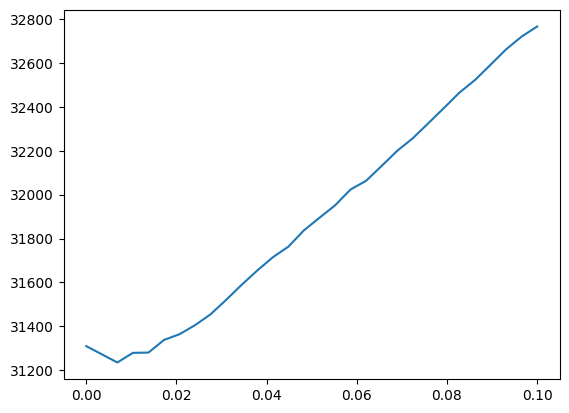

In [38]:
plt.plot(alphas, nr_params_dict[1]*np.log(500) - 2*lik_dict[1])

In [6]:
# test

B = scipy.stats.bernoulli.rvs(p = 0.5, size = (45))   

reg_matrix = np.zeros((3,d,d))
for h in range(1):
    np.fill_diagonal(reg_matrix[h],0)
    reg_matrix[h][np.triu_indices(d,1)] = B*999999
    reg_matrix[h] = reg_matrix[h] + reg_matrix[h].T


dg_opt1 = dg.dygl_inner_em(X, obs_per_graph = 30, max_iter = 10000, lamda = reg_matrix, kappa = kappa, tol = 1e-6)
dg_opt1.fit(nr_workers=1, temporal_penalty="element-wise", lik_type="gaussian",verbose=False)




NameError: name 'd' is not defined

In [5]:
def plot_aic(graph_sampling_testing):
    
    X = graph_sampling_testing['X'] #np.vstack([X1,X2,X3])

    alphas = graph_sampling_testing['alphas']# np.linspace(0.01,0.5, 50)
    kappas = graph_sampling_testing['kappas'] #[0.01, 0.05, 0.1]
    AICs = np.empty((len(kappas), len(alphas)))

    for k_cnt, kappa in enumerate(kappas):
        for a_cnt, alpha in enumerate(alphas):
            dg_opt1 = dg.dygl_inner_em(graph_sampling_testing['X'], obs_per_graph = 50, max_iter = 10000, lamda = alpha, kappa = kappa, tol = 1e-6)
            dg_opt1.fit(nr_workers=1, temporal_penalty="element-wise", lik_type="gaussian",verbose=False)

            thetas = dg_opt1.theta
            liks = log_lik_all(50, thetas, X, 'gaussian')
            nr_params_val = find_nr_params(thetas, 'gaussian')
            AICs[k_cnt, a_cnt] = 2*(np.sum(nr_params_val) - np.sum(liks))


    fig, ax = plt.subplots(1,1, figsize = (10,5))
    ax.plot(alphas, AICs[0], label = 1)
    ax.plot(alphas, AICs[1], label = 2)
    ax.plot(alphas, AICs[2], label = 3)
    ax.legend()



def plot_prob_per_it(graph_sampling_testing, k_idx):
    nr_ce_it = graph_sampling_testing['p_distribution'].shape[3]
    # For binomial
    fig, ax = plt.subplots(20,3, figsize = (15,90))
    for i in range(20):
        for h in range(3):
            for k in [k_idx]:
                for a in range(len(graph_sampling_testing['alphas'])):
                    ax[i,h].plot(range(graph_sampling_testing['p_distribution'].shape[3]), graph_sampling_testing['p_distribution'][k,a,h,:,i], label = f'alpha {graph_sampling_testing["alphas"][a]}')
                    #A_est = graph_sampling_testing['thetas'][h,j,k][np.triu_indices(20,1)]
                    #A_est[np.abs(A_est)<1e-3] = 0
                    #ax[i,h].plot(range(graph_sampling_testing['p_distribution'].shape[3]),[1-np.abs(np.sign(A_est[i]))]*61, color = 'orange')
            A_true = graph_sampling_testing['As'][h][np.triu_indices(10,1)]
            ax[i,h].plot(range(graph_sampling_testing['p_distribution'].shape[3]),[1-np.abs(np.sign(A_true[i]))]*nr_ce_it, color = 'black')
            #ax[i,h].set_xlabel('Iteration')
            ax[i,h].set_ylabel('p')
            ax[i,h].set_ylim((-0.1,1.1))
            ax[i,h].set_title(f"A_ij = {np.round(graph_sampling_testing['As'][h][np.triu_indices(10,1)][i],2)}")
        ax[i,2].legend(bbox_to_anchor = (1.1,1.1))


def plot_prob_per_it_multiple_models(args, labels,  a_idx, k_idx):
    nr_ce_it = args[0]['p_distribution'].shape[3]
    # For binomial
    fig, ax = plt.subplots(20,3, figsize = (15,90))
    for i in range(20):
        for h in range(3):
            for j in range(len(args)):
                ax[i,h].plot(range(args[j]['p_distribution'].shape[3]), args[j]['p_distribution'][k_idx,a_idx,h,:,i], label = labels[j])

            A_true = args[0]['As'][h][np.triu_indices(10,1)]
            ax[i,h].plot(range(args[0]['p_distribution'].shape[3]),[1-np.abs(np.sign(A_true[i]))]*nr_ce_it, color = 'black')
            #ax[i,h].set_xlabel('Iteration')
            ax[i,h].set_ylabel('p')
            ax[i,h].set_ylim((-0.1,1.1))
            ax[i,h].set_title(f"A_ij = {np.round(args[0]['As'][h][np.triu_indices(10,1)][i],2)}")
        ax[i,2].legend(bbox_to_anchor = (1.1,1.1))


def plot_auc(graph_sampling_testing):
    from sklearn import metrics
    fig, ax = plt.subplots(1,1, figsize = (10,10))
    i = 1

    for j in range(len(graph_sampling_testing['alphas'])):
        y = np.concatenate((np.sign(np.abs(graph_sampling_testing['As'][0][np.triu_indices(10,1)])), np.sign(np.abs(graph_sampling_testing['As'][1][np.triu_indices(10,1)])), np.sign(np.abs(graph_sampling_testing['As'][2][np.triu_indices(10,1)]))))
        pred = np.concatenate(( graph_sampling_testing['p_distribution'][i,j,0,-1],  graph_sampling_testing['p_distribution'][i,j,1,-1],  graph_sampling_testing['p_distribution'][i,j,2,-1]))

        fpr, tpr, thresholds = metrics.roc_curve(y, pred, pos_label=0)
        auc = metrics.roc_auc_score(1-y, pred)

        ax.plot(fpr, tpr,label="alpha = " + str(np.round(graph_sampling_testing['alphas'][j],2)) + ", auc="+str(np.round(auc,2)))
        ax.legend()

    ax.plot([0,1], [0,1],color = 'black')


def p_vs_abs_edge(graph_sampling_testing, as_test = [1,3, 6]):
    fig, ax = plt.subplots(len(as_test),2, figsize = (15,20))
    for cnt, a in enumerate(as_test): #range(len(graph_sampling_testing['alphas'])):
        for k in range(2):
            ax[cnt,k].scatter(1-graph_sampling_testing['p_distribution'][k, a, 0,-1,:],np.abs(graph_sampling_testing['As'][0][np.triu_indices(10,1)]), label = '1', color = 'blue')
            ax[cnt,k].scatter(1-graph_sampling_testing['p_distribution'][k, a, 1,-1,:],np.abs(graph_sampling_testing['As'][1][np.triu_indices(10,1)]), label = '2', color = 'blue' )
            ax[cnt,k].scatter(1-graph_sampling_testing['p_distribution'][k, a, 2,-1,:],np.abs(graph_sampling_testing['As'][2][np.triu_indices(10,1)]), label = '3', color = 'blue' )
            ax[cnt,k].set_ylabel("Absolute edge")
            ax[cnt,k].set_xlabel("Probability")
            ax[cnt,k].set_xlim((0,1))
            ax[cnt,k].set_title(f"alpha {np.round(graph_sampling_testing['alphas'][a],2)} kappa {graph_sampling_testing['kappas'][k]}")
            ax[cnt,k].legend()
            ax[cnt,k].set_ylim((-0.1,2))
            ax[cnt,k].set_xlim((-0.05,1.05))



def p_vs_abs_edge_kde(graph_sampling_testing, as_test = [1, 3, 6]):
    from scipy.stats import gaussian_kde
    fig, ax = plt.subplots(len(as_test),2, figsize = (15,15))
    for cnt, a in enumerate(as_test): #range(len(graph_sampling_testing['alphas'])):
        for k in range(2):
            x = np.concatenate((1-graph_sampling_testing['p_distribution'][k, a, 0,-1,:], 1-graph_sampling_testing['p_distribution'][k, a, 1,-1,:], 1-graph_sampling_testing['p_distribution'][k, a, 2,-1,:]))
            y = np.concatenate((np.abs(graph_sampling_testing['As'][0][np.triu_indices(10,1)]), np.abs(graph_sampling_testing['As'][1][np.triu_indices(10,1)]), np.abs(graph_sampling_testing['As'][2][np.triu_indices(10,1)])))
            xy = np.vstack([x,y])
            z = gaussian_kde(xy)(xy)

            ax[cnt,k].scatter(x, y, c=z, s=100)
            ax[cnt,k].set_ylabel("Absolute edge")
            ax[cnt,k].set_xlabel("Probability")
            ax[cnt,k].set_xlim((0,1))
            ax[cnt,k].set_title(f"alpha {np.round(graph_sampling_testing['alphas'][a],2)} kappa {graph_sampling_testing['kappas'][k]}")
            ax[cnt,k].legend()
            ax[cnt,k].set_ylim((-0.1,2))
            ax[cnt,k].set_xlim((-0.05,1.05))


In [4]:
# For binomial
colors = ['red', 'blue', 'orange', 'green', 'grey', 'purple', 'yellow', 'brown', 'darkblue']
def plot_singles(args, labels, d, plot_bootstrap = True, nr_plot = 45, boot_samples = None, boot_labels = None):

    colors = ['red', 'blue', 'orange', 'green', 'grey', 'purple', 'yellow', 'brown', 'darkblue']
    fig, ax = plt.subplots(nr_plot,3, figsize = (15,4*nr_plot))


    for i in range(nr_plot):

        if plot_bootstrap:
            for h in range(3):
                for j in range(len(boot_samples)):
                    freq_boot = boot_samples[j][h][np.triu_indices(d,1)]
                    if boot_labels is not None:
                        ax[i,h].scatter([0], [1-freq_boot[i]], linestyle = '--', color = colors[j], label = boot_labels[j])
                    else:
                        ax[i,h].scatter([0], [1-freq_boot[i]], linestyle = '--', color = colors[j])

        for h in range(3):
            for j in range(len(args)):
                ax[i,h].plot(range(args[j]['p_distribution'].shape[1]), args[j]['p_distribution'][h,:,i], label = labels[j],  color = colors[j])
            A_true = args[0]['As'][h][np.triu_indices(10,1)]
            ax[i,h].scatter([0],[1-np.abs(np.sign(A_true[i]))], color = 'black') #*args[0]['p_distribution'].shape[1]
            #ax[i,h].set_xlabel('Iteration')
            ax[i,h].set_ylabel('p')
            ax[i,h].set_ylim((-0.1,1.1))
            ax[i,h].set_title(f"A_ij = {np.round(args[0]['As'][h][np.triu_indices(10,1)][i],2)}")
        ax[i,2].legend()



def plot_auc_singles(args, labels,boots = None,  it = -1, d = 10):
    from sklearn import metrics
    fig, ax = plt.subplots(1,1, figsize = (10,10))
    i = 1
    colors = ['red', 'blue', 'orange', 'green', 'grey', 'purple', 'yellow', 'brown', 'darkblue']
    for j in range(len(args)):
        y = np.concatenate((np.sign(np.abs(args[j]['As'][0][np.triu_indices(10,1)])), np.sign(np.abs(args[j]['As'][1][np.triu_indices(d,1)])), np.sign(np.abs(args[j]['As'][2][np.triu_indices(d,1)]))))
        pred = np.concatenate(( args[j]['p_distribution'][0,it],  args[j]['p_distribution'][1,it],  args[j]['p_distribution'][2,it]))

        fpr, tpr, thresholds = metrics.roc_curve(y, pred, pos_label=0)
        auc = metrics.roc_auc_score(1-y, pred)

        ax.plot(fpr, tpr,label=labels[j]+ ", auc="+str(np.round(auc,2)), color = colors[j])
       
        #freq_boot0 = np.mean(np.abs(np.sign(boot[j]['thetas_sim'][:,0])), axis = 0)[np.triu_indices(d,1)]
        #freq_boot1 = np.mean(np.abs(np.sign(boot[j]['thetas_sim'][:,1])), axis = 0)[np.triu_indices(d,1)]
        #freq_boot2 = np.mean(np.abs(np.sign(boot[j]['thetas_sim'][:,2])), axis = 0)[np.triu_indices(d,1)]
        if (boots is not None):
            if (len(args) == len(boots)):
                pred = 1-np.concatenate((boots[j][0][np.triu_indices(d,1)], boots[j][1][np.triu_indices(d,1)], boots[j][2][np.triu_indices(d,1)]))
                fpr, tpr, thresholds = metrics.roc_curve(y, pred, pos_label=0)
                auc = metrics.roc_auc_score(1-y, pred)
                ax.plot(fpr, tpr,label=labels[j]+  " Freq. boot, auc="+str(np.round(auc,2)), color = colors[j], linestyle = '--')

    if (boots is not None):
        if (len(args) != len(boots)):
            for j in range(len(boots)):
                pred = 1-np.concatenate((boots[j][0][np.triu_indices(d,1)], boots[j][1][np.triu_indices(d,1)], boots[j][2][np.triu_indices(d,1)]))
                fpr, tpr, thresholds = metrics.roc_curve(y, pred, pos_label=0)
                auc = metrics.roc_auc_score(1-y, pred)
                ax.plot(fpr, tpr,label=labels[j]+  " Freq. boot, auc="+str(np.round(auc,2)), color = 'black', linestyle = '--')



    ax.plot([0,1], [0,1],color = 'black')
    ax.legend()


def plot_mse_singles(args, labels,boots = None,  it = -1, d = 10):
    from sklearn import metrics
    fig, ax = plt.subplots(1,1, figsize = (10,5))
    i = 1
    colors = ['red', 'blue', 'orange', 'green', 'grey', 'purple', 'yellow', 'brown', 'darkblue']
    cnt  = 0
    for j in range(len(args)):
        y = np.concatenate((np.sign(np.abs(args[j]['As'][0][np.triu_indices(10,1)])), np.sign(np.abs(args[j]['As'][1][np.triu_indices(d,1)])), np.sign(np.abs(args[j]['As'][2][np.triu_indices(d,1)]))))
        pred = np.concatenate(( args[j]['p_distribution'][0,it],  args[j]['p_distribution'][1,it],  args[j]['p_distribution'][2,it]))

        mse = np.mean((y-pred)**2)
        ax.scatter([cnt], mse,label=labels[j]+ ", MSE="+str(np.round(mse,2)), color = colors[j])
    
        #freq_boot0 = np.mean(np.abs(np.sign(boot[j]['thetas_sim'][:,0])), axis = 0)[np.triu_indices(d,1)]
        #freq_boot1 = np.mean(np.abs(np.sign(boot[j]['thetas_sim'][:,1])), axis = 0)[np.triu_indices(d,1)]
        #freq_boot2 = np.mean(np.abs(np.sign(boot[j]['thetas_sim'][:,2])), axis = 0)[np.triu_indices(d,1)]
        if (len(args) == len(boots)) and (boots is not None):
            pred = 1-np.concatenate((boots[j][0][np.triu_indices(d,1)], boots[j][1][np.triu_indices(d,1)], boots[j][2][np.triu_indices(d,1)]))
            mse = np.mean((y-pred)**2)
            ax.scatter([cnt], mse,label=labels[j]+  " Freq. boot, MSE="+str(np.round(mse,2)), color = colors[j], marker = 'x')
        cnt += 1
    if (len(args) != len(boots)) and (boots is not None):
        for j in range(len(boots)):
            pred = 1-np.concatenate((boots[j][0][np.triu_indices(d,1)], boots[j][1][np.triu_indices(d,1)], boots[j][2][np.triu_indices(d,1)]))
            mse = np.mean((y-pred)**2)
            ax.scatter([cnt], mse,label=labels[j]+  " Freq. boot, MSE="+str(np.round(mse,2)), color = colors[j], marker = 'x')
            cnt += 1

    ax.legend()





def plot_f1_singles(args, labels,boots = None,  it = -1, d = 10, average = 'binary'):
    from sklearn import metrics
    fig, ax = plt.subplots(1,1, figsize = (10,5))
    i = 1
    colors = ['red', 'blue', 'orange', 'green', 'grey', 'purple', 'yellow', 'brown', 'darkblue']
    cnt  = 0
    for j in range(len(args)):
        y = np.abs(np.concatenate((np.sign(np.abs(args[j]['As'][0][np.triu_indices(10,1)])), np.sign(np.abs(args[j]['As'][1][np.triu_indices(d,1)])), np.sign(np.abs(args[j]['As'][2][np.triu_indices(d,1)])))))
        pred = np.concatenate(( args[j]['p_distribution'][0,it],  args[j]['p_distribution'][1,it],  args[j]['p_distribution'][2,it]))
        pred = np.round(pred)

        f1 = metrics.f1_score(1-y, pred, average = average)
        ax.scatter([cnt], f1,label=labels[j]+ ", f1="+str(np.round(f1,2)), color = colors[j])
        cnt+=1
        #freq_boot0 = np.mean(np.abs(np.sign(boot[j]['thetas_sim'][:,0])), axis = 0)[np.triu_indices(d,1)]
        #freq_boot1 = np.mean(np.abs(np.sign(boot[j]['thetas_sim'][:,1])), axis = 0)[np.triu_indices(d,1)]
        #freq_boot2 = np.mean(np.abs(np.sign(boot[j]['thetas_sim'][:,2])), axis = 0)[np.triu_indices(d,1)]
        if (len(args) == len(boots)) and (boots is not None):
            pred = 1-np.concatenate((boots[j][0][np.triu_indices(d,1)], boots[j][1][np.triu_indices(d,1)], boots[j][2][np.triu_indices(d,1)]))
            pred = np.round(pred)
            f1 = metrics.f1_score(1-y, pred, average = average)
            ax.scatter([cnt], f1,label=labels[j]+  " Freq. boot, f1="+str(np.round(f1,2)), color = colors[j], marker = 'x')
            cnt += 1
    if (len(args) != len(boots)) and (boots is not None):
        for j in range(len(boots)):
            pred = 1-np.concatenate((boots[j][0][np.triu_indices(d,1)], boots[j][1][np.triu_indices(d,1)], boots[j][2][np.triu_indices(d,1)]))
            pred = np.round(pred)
            f1 = metrics.f1_score(1-y, pred, average = average)
            ax.scatter([cnt], f1,label=labels[j]+  " Freq. boot, f1="+str(np.round(f1,2)), color = colors[j], marker = 'x')
            cnt += 1

    ax.legend()


def plot_accuracy_singles(args, labels,boots = None,  it = -1, d = 10):
    from sklearn import metrics
    fig, ax = plt.subplots(1,1, figsize = (10,5))
    i = 1
    colors = ['red', 'blue', 'orange', 'green', 'grey', 'purple', 'yellow', 'brown', 'darkblue']
    cnt  = 0
    for j in range(len(args)):
        y = np.abs(np.concatenate((np.sign(np.abs(args[j]['As'][0][np.triu_indices(10,1)])), np.sign(np.abs(args[j]['As'][1][np.triu_indices(d,1)])), np.sign(np.abs(args[j]['As'][2][np.triu_indices(d,1)])))))
        pred = np.concatenate(( args[j]['p_distribution'][0,it],  args[j]['p_distribution'][1,it],  args[j]['p_distribution'][2,it]))
        pred = np.round(pred)

        f1 = metrics.accuracy_score(1-y, pred)
        ax.scatter([cnt], f1,label=labels[j]+ ", accuracy="+str(np.round(f1,2)), color = colors[j])
        cnt+=1
        #freq_boot0 = np.mean(np.abs(np.sign(boot[j]['thetas_sim'][:,0])), axis = 0)[np.triu_indices(d,1)]
        #freq_boot1 = np.mean(np.abs(np.sign(boot[j]['thetas_sim'][:,1])), axis = 0)[np.triu_indices(d,1)]
        #freq_boot2 = np.mean(np.abs(np.sign(boot[j]['thetas_sim'][:,2])), axis = 0)[np.triu_indices(d,1)]
        if (len(args) == len(boots)) and (boots is not None):
            pred = 1-np.concatenate((boots[j][0][np.triu_indices(d,1)], boots[j][1][np.triu_indices(d,1)], boots[j][2][np.triu_indices(d,1)]))
            pred = np.round(pred)
            f1 = metrics.accuracy_score(1-y, pred)
            ax.scatter([cnt], f1,label=labels[j]+  " Freq. boot, accuracy="+str(np.round(f1,2)), color = colors[j], marker = 'x')
            cnt += 1
    if (len(args) != len(boots)) and (boots is not None):
        for j in range(len(boots)):
            pred = 1-np.concatenate((boots[j][0][np.triu_indices(d,1)], boots[j][1][np.triu_indices(d,1)], boots[j][2][np.triu_indices(d,1)]))
            pred = np.round(pred)
            f1 = metrics.accuracy_score(1-y, pred)
            ax.scatter([cnt], f1,label=labels[j]+  " Freq. boot, accuracy="+str(np.round(f1,2)), color = colors[j], marker = 'x')
            cnt += 1

    ax.legend()


def plot_precision_singles(args, labels,boots = None,  it = -1, d = 10):
    from sklearn import metrics
    fig, ax = plt.subplots(1,1, figsize = (10,5))
    i = 1
    colors = ['red', 'blue', 'orange', 'green', 'grey', 'purple', 'yellow', 'brown', 'darkblue']
    cnt  = 0
    for j in range(len(args)):
        y = np.concatenate((np.sign(np.abs(args[j]['As'][0][np.triu_indices(10,1)])), np.sign(np.abs(args[j]['As'][1][np.triu_indices(d,1)])), np.sign(np.abs(args[j]['As'][2][np.triu_indices(d,1)]))))
        pred = np.concatenate(( args[j]['p_distribution'][0,it],  args[j]['p_distribution'][1,it],  args[j]['p_distribution'][2,it]))
        pred = np.round(pred)
        
        f1 = metrics.precision_score(1-y, pred)
        ax.scatter([cnt], f1,label=labels[j]+ ", precision="+str(np.round(f1,2)), color = colors[j])
        cnt+=1
        #freq_boot0 = np.mean(np.abs(np.sign(boot[j]['thetas_sim'][:,0])), axis = 0)[np.triu_indices(d,1)]
        #freq_boot1 = np.mean(np.abs(np.sign(boot[j]['thetas_sim'][:,1])), axis = 0)[np.triu_indices(d,1)]
        #freq_boot2 = np.mean(np.abs(np.sign(boot[j]['thetas_sim'][:,2])), axis = 0)[np.triu_indices(d,1)]
        if (len(args) == len(boots)) and (boots is not None):
            pred = 1-np.concatenate((boots[j][0][np.triu_indices(d,1)], boots[j][1][np.triu_indices(d,1)], boots[j][2][np.triu_indices(d,1)]))
            pred = np.round(pred)
            f1 = metrics.precision_score(1-y, pred)
            ax.scatter([cnt], f1,label=labels[j]+  " Freq. boot, precision="+str(np.round(f1,2)), color = colors[j], marker = 'x')
            cnt += 1
    if (len(args) != len(boots)) and (boots is not None):
        for j in range(len(boots)):
            pred = 1-np.concatenate((boots[j][0][np.triu_indices(d,1)], boots[j][1][np.triu_indices(d,1)], boots[j][2][np.triu_indices(d,1)]))
            pred = np.round(pred)
            f1 = metrics.precision_score(1-y, pred)
            ax.scatter([cnt], f1,label=labels[j]+  " Freq. boot, precision="+str(np.round(f1,2)), color = colors[j], marker = 'x')
            cnt += 1

    ax.legend()


def plot_recall_singles(args, labels,boots = None,  it = -1, d = 10):
    from sklearn import metrics
    fig, ax = plt.subplots(1,1, figsize = (10,5))
    i = 1
    colors = ['red', 'blue', 'orange', 'green', 'grey', 'purple', 'yellow', 'brown', 'darkblue']
    cnt  = 0
    for j in range(len(args)):
        y = np.concatenate((np.sign(np.abs(args[j]['As'][0][np.triu_indices(10,1)])), np.sign(np.abs(args[j]['As'][1][np.triu_indices(d,1)])), np.sign(np.abs(args[j]['As'][2][np.triu_indices(d,1)]))))
        pred = np.concatenate(( args[j]['p_distribution'][0,it],  args[j]['p_distribution'][1,it],  args[j]['p_distribution'][2,it]))
        #pred = np.round(pred)

        f1 = metrics.recall_score(y, pred)
        ax.scatter([cnt], f1,label=labels[j]+ ", recall="+str(np.round(f1,2)), color = colors[j])
        cnt+=1
        #freq_boot0 = np.mean(np.abs(np.sign(boot[j]['thetas_sim'][:,0])), axis = 0)[np.triu_indices(d,1)]
        #freq_boot1 = np.mean(np.abs(np.sign(boot[j]['thetas_sim'][:,1])), axis = 0)[np.triu_indices(d,1)]
        #freq_boot2 = np.mean(np.abs(np.sign(boot[j]['thetas_sim'][:,2])), axis = 0)[np.triu_indices(d,1)]
        if (len(args) == len(boots)) and (boots is not None):
            pred = 1-np.concatenate((boots[j][0][np.triu_indices(d,1)], boots[j][1][np.triu_indices(d,1)], boots[j][2][np.triu_indices(d,1)]))
            pred = np.round(pred)
            f1 = metrics.recall_score(y, pred)
            ax.scatter([cnt], f1,label=labels[j]+  " Freq. boot, recall="+str(np.round(f1,2)), color = colors[j], marker = 'x')
            cnt += 1
    if (len(args) != len(boots)) and (boots is not None):
        for j in range(len(boots)):
            pred = 1-np.concatenate((boots[j][0][np.triu_indices(d,1)], boots[j][1][np.triu_indices(d,1)], boots[j][2][np.triu_indices(d,1)]))
            pred = np.round(pred)
            f1 = metrics.recall_score(y, pred)
            ax.scatter([cnt], f1,label=labels[j]+  " Freq. boot, recall="+str(np.round(f1,2)), color = colors[j], marker = 'x')
            cnt += 1

    ax.legend()

def p_vs_abs_edge_singles(args, labels, it = -1, d = 10):
    fig, ax = plt.subplots(len(args), figsize = (15,20))
    for j in range(len(args)): #range(len(graph_sampling_testing['alphas'])):
        ax[j].scatter(1-args[j]['p_distribution'][0,it,:],np.abs(args[j]['As'][0][np.triu_indices(d,1)]), label = '1', color = 'blue')
        ax[j].scatter(1-args[j]['p_distribution'][1,it,:],np.abs(args[j]['As'][1][np.triu_indices(d,1)]), label = '2', color = 'red' )
        ax[j].scatter(1-args[j]['p_distribution'][2,it,:],np.abs(args[j]['As'][2][np.triu_indices(d,1)]), label = '3', color = 'green' )
        ax[j].set_ylabel("Absolute edge")
        ax[j].set_xlabel("Probability")
        ax[j].set_xlim((0,1))
        ax[j].set_title(labels[j])
        ax[j].legend()
        ax[j].set_ylim((-0.1,2))
        ax[j].set_xlim((-0.05,1.05))


def p_vs_abs_edge_singles_boot(args, labels, d = 10):
    fig, ax = plt.subplots(len(args), figsize = (15,20))
    for j in range(len(args)): #range(len(graph_sampling_testing['alphas'])):

        freq_boot0 = np.mean(np.abs(np.sign(args[j]['thetas_sim'][:,0])), axis = 0)[np.triu_indices(d,1)]
        freq_boot1 = np.mean(np.abs(np.sign(args[j]['thetas_sim'][:,1])), axis = 0)[np.triu_indices(d,1)]
        freq_boot2 = np.mean(np.abs(np.sign(args[j]['thetas_sim'][:,2])), axis = 0)[np.triu_indices(d,1)]
        ax[j].scatter(freq_boot0,np.abs(args[j]['As'][0][np.triu_indices(d,1)]), label = '1', color = 'blue')
        ax[j].scatter(freq_boot1,np.abs(args[j]['As'][1][np.triu_indices(d,1)]), label = '2', color = 'red' )
        ax[j].scatter(freq_boot2,np.abs(args[j]['As'][2][np.triu_indices(d,1)]), label = '3', color = 'green' )
        ax[j].set_ylabel("Absolute edge")
        ax[j].set_xlabel("Probability")
        ax[j].set_xlim((0,1))
        ax[j].set_title(labels[j])
        ax[j].legend()
        ax[j].set_ylim((-0.1,2))
        ax[j].set_xlim((-0.05,1.05))


def plot_coefvar_singles(args, labels, d = 10):
    fig, ax = plt.subplots(1,3, figsize = (15,5))

    for h in range(3):
        ax[h].set_title("Coef. of variation of fitness, Graph nr: " + str(h+1))
        ax[h].set_ylabel("Coef. of variation")
        ax[h].set_xlabel("Iteration")
        for j in range(len(args)):
            ax[h].plot(np.std(args[j]['value_vals'][0], axis=1)/np.mean(args[j]['value_vals'][0], axis=1), label = labels[j], color = colors[j])
        ax[h].legend()



def simulate(p, X, B, w, d, kappa, it_nr=-1):

    H = 3
    nr_params = int(d*(d-1)/2)

    theta_sim = np.zeros((B, H, d, d))

    for b in range(B):

        Xs = []
        for j in range(3):
            if j == 0:
                Xs.append(X[j*w:((j+1)*w)][np.random.choice(w, w)])
            elif j == 3-1:
                Xs.append(X[(j*w):(j+1)*w][np.random.choice(w, w)])
            else:
                Xs.append(X[(j*w):((j+1)*w)][np.random.choice(w, w)])

        Xs = np.vstack(Xs)


        B = np.zeros((H, nr_params))
        for h in range(H):
            B[h] = scipy.stats.bernoulli.rvs(p = p[h,it_nr], size = (nr_params)) 
        reg_matrix = np.zeros((H,d,d))
        for h in range(H):
            np.fill_diagonal(reg_matrix[h],0)
            reg_matrix[h][np.triu_indices(d,1)] = B[h]*999999# 999999*(1-np.abs(np.sign(theta_reference[h][np.triu_indices(d,1)])))#
            reg_matrix[h] = reg_matrix[h] + reg_matrix[h].T



        dg_opt2 = dg.dygl_inner_em(Xs, obs_per_graph = w, max_iter = 2000, lamda = reg_matrix, kappa =kappa, tol = 1e-3)
        dg_opt2.fit(nr_workers=1, temporal_penalty="element-wise", lik_type="gaussian",verbose=False)
        theta_sim[b] = dg_opt2.theta.copy()


    return theta_sim





# Unkown shift Multiple runs

In [7]:
with open(f'C:/Users/ragna/OneDrive/GraphHypTest/unknown_cp_0.6_50_cai_xs_xs_False_tp_0.8.pkl', 'rb') as handle:
    gst_cai_08 = pickle.load(handle)
with open(f'C:/Users/ragna/OneDrive/GraphHypTest/unknown_cp_0.6_50_cai_xs_xs_False_tp_0.9.pkl', 'rb') as handle:
    gst_cai_09 = pickle.load(handle)
with open(f'C:/Users/ragna/OneDrive/GraphHypTest/unknown_cp_0.6_50_zero-one_xs_xs_False_tp_0.8.pkl', 'rb') as handle:
    gst_zo_08 = pickle.load(handle)
with open(f'C:/Users/ragna/OneDrive/GraphHypTest/unknown_cp_0.6_50_zero-one_xs_xs_False_tp_0.9.pkl', 'rb') as handle:
    gst_zo_09 = pickle.load(handle)

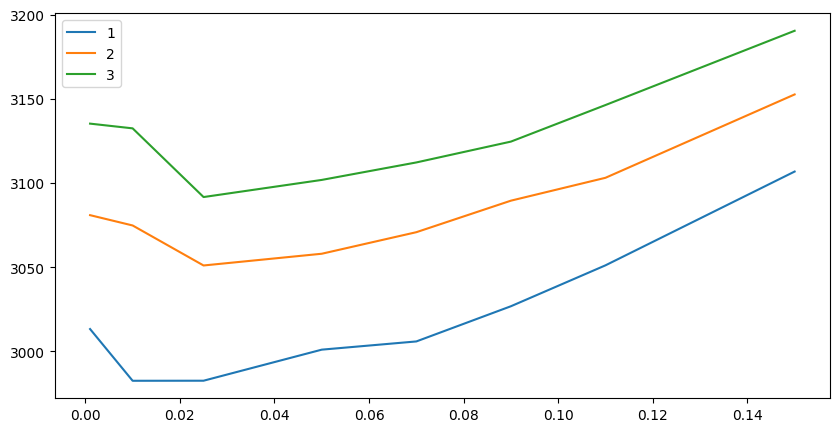

In [8]:
plot_aic(gst_cai_08)
#plot_aic(gst_cai_09)
#plot_aic(gst_zo_08)
#plot_aic(gst_zo_09)

In [ ]:
print(np.round(gst_cai_08['As'][0],2))
print(np.round(gst_cai_08['As'][1],2))

probability with iteration

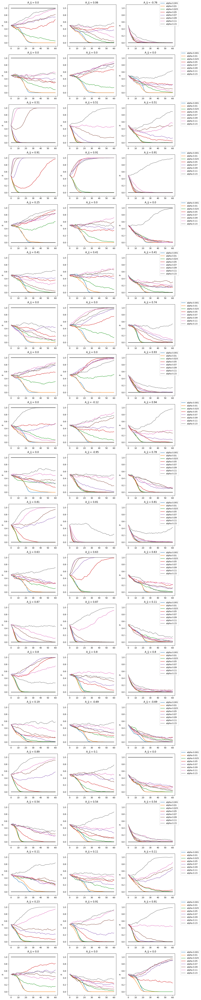

In [9]:
plot_prob_per_it(gst_cai_08,0)


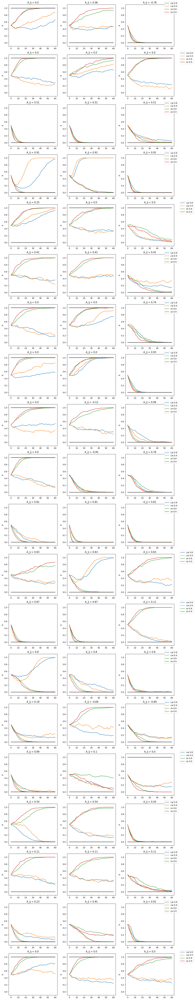

In [10]:
plot_prob_per_it_multiple_models([gst_cai_08, gst_cai_09, gst_zo_08, gst_zo_09], ['cai 0.8', 'cai 0.9', 'zo 0.8', 'zo 0.9'], 3, 0)

NameError: name 'P' is not defined

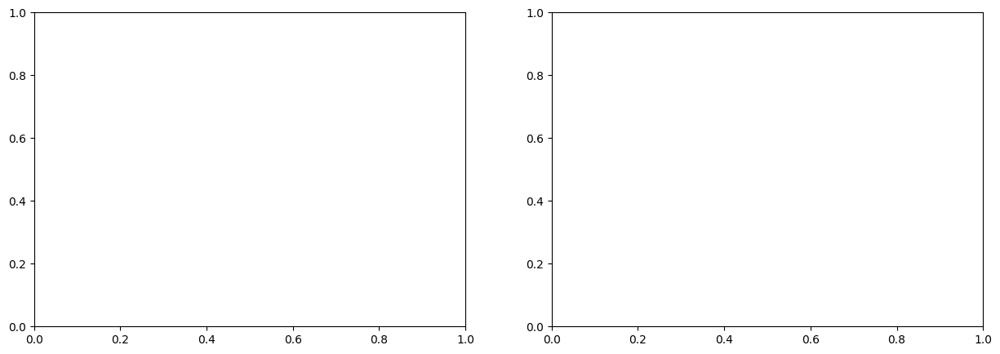

In [12]:
fig, ax = plt.subplots(1,2, figsize = (15,5))
sns.heatmap(1-P[0,4,0], ax = ax[0])
sns.heatmap(np.abs(As[0])/np.max(np.abs(As[0])), ax = ax[1])

histogram p

In [ ]:
graph_sampling_testing['p_distribution'][0,4,h,-1]

In [11]:
sns.kdeplot(graph_sampling_testing['p_distribution'][0,4,h,-1])

NameError: name 'graph_sampling_testing' is not defined

AUC

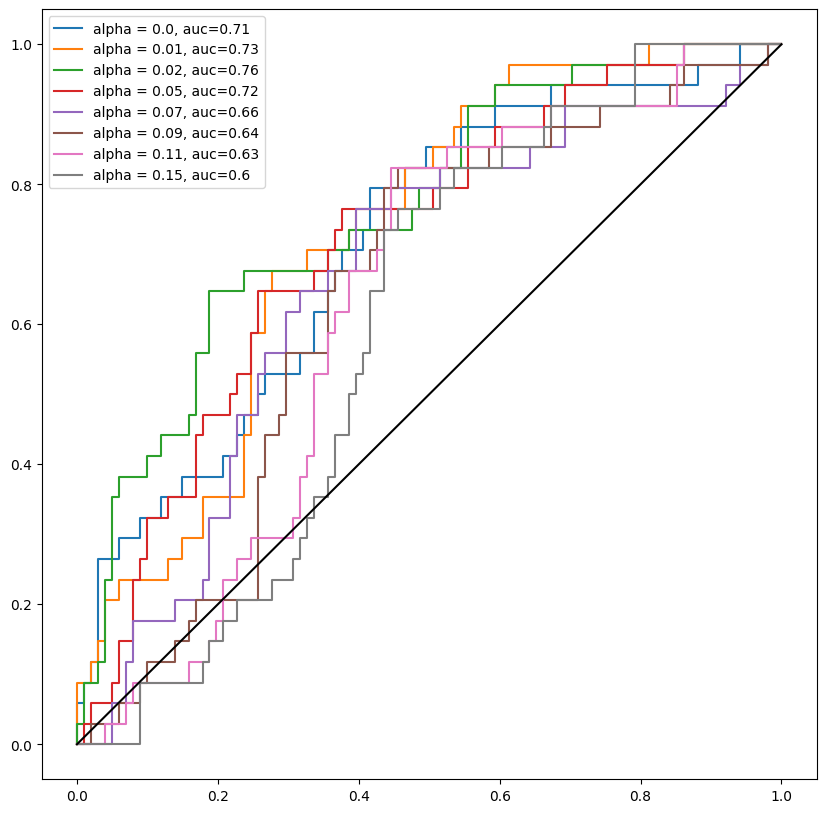

In [13]:
plot_auc(gst_zo_08)

P vs absolute edge

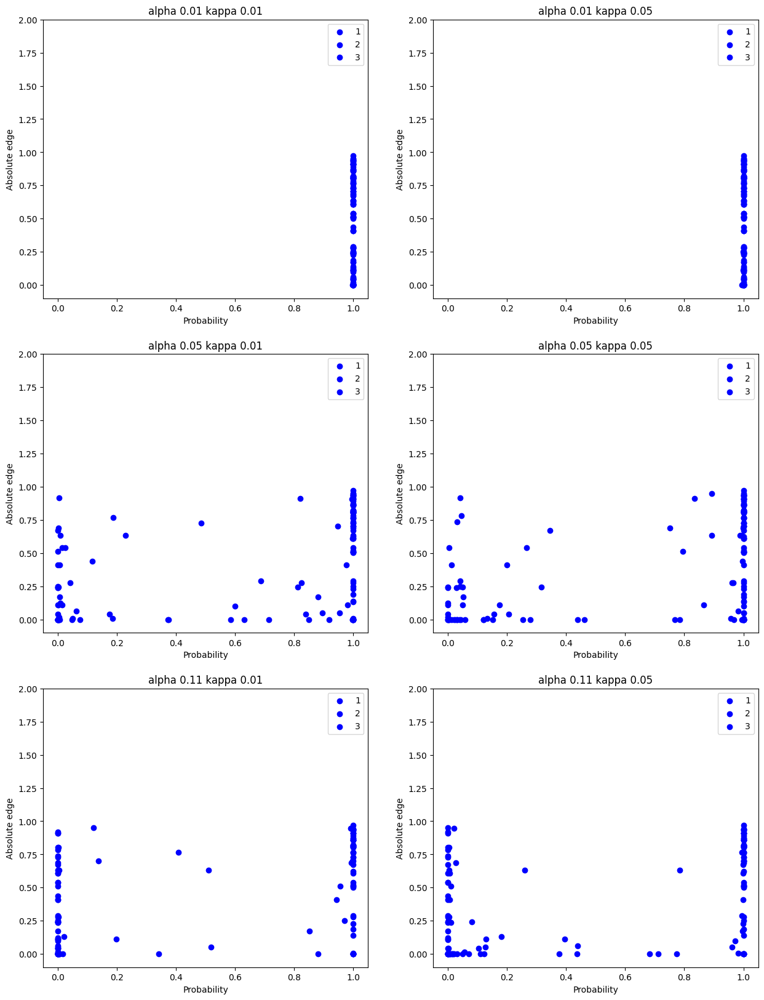

In [14]:
p_vs_abs_edge(gst_zo_08)

Plot P with time

In [ ]:
p_vs_abs_edge_kde(gst_zo_08)

Thetas simulated - One edge

In [16]:
i = 0
j = 2

xlim = (-1.5, 1.5)

As = graph_sampling_testing['As']
fig, ax = plt.subplots(1,3, figsize = (20, 5))
k = 0
for h in range(3):
    for a in range(len(graph_sampling_testing['alphas'])):
        theta_est = graph_sampling_testing['thetas'][k,a,h].copy()
        sns.kdeplot(graph_sampling_testing['thetas_sim'][k,a,:,h,i,j], ax = ax[h], label =f'alpha {graph_sampling_testing["alphas"][a]}, p {np.round(P[k,a,h,i,j],2)}')
    #ax[h].axvline(x = theta_est[i,j], label = 'Dygl', color = 'black')
    ax[h].axvline(x = As[h][i,j], label = 'True', color = 'black', linestyle = 'dashed')
    ax[h].set_ylim((0,20))
    ax[h].legend()
    ax[h].set_xlim(xlim)
ax[1].set_title(f'kappa {graph_sampling_testing["kappas"][k]}, p ')

As = graph_sampling_testing['As']
fig, ax = plt.subplots(1,3, figsize = (20, 5))
k = 1
for h in range(3):
    for a in range(len(graph_sampling_testing['alphas'])):
        theta_est = graph_sampling_testing['thetas'][k,a,h].copy()
        sns.kdeplot(graph_sampling_testing['thetas_sim'][k,a,:,h,i,j], ax = ax[h], label =f'alpha {graph_sampling_testing["alphas"][a]}, p {np.round(P[k,a,h,i,j],2)}')
    #ax[h].axvline(x = theta_est[i,j], label = 'Dygl', color = 'black')
    ax[h].axvline(x = As[h][i,j], label = 'True', color = 'black', linestyle = 'dashed')
    ax[h].set_ylim((0,20))
    ax[h].legend()
    ax[h].set_xlim(xlim)
ax[1].set_title(f'kappa {graph_sampling_testing["kappas"][k]}')

# As = graph_sampling_testing['As']
# fig, ax = plt.subplots(1,3, figsize = (20, 5))
# k = 2
# for h in range(2):
#     for a in range(len(graph_sampling_testing['alphas'])):
#         theta_est = graph_sampling_testing['thetas'][k,a,h].copy()
#         sns.kdeplot(graph_sampling_testing['thetas_sim'][k,a,:,h,i,j], ax = ax[h], label =f'alpha {graph_sampling_testing["alphas"][a]}, p {np.round(P[k,a,h,i,j],2)}')
#     #ax[h].axvline(x = theta_est[i,j], label = 'Dygl', color = 'black')
#     ax[h].axvline(x = As[h][i,j], label = 'True', color = 'black', linestyle = 'dashed')
#     ax[h].set_ylim((0,20))
#     ax[h].legend()
#     ax[h].set_xlim(xlim)
# ax[1].set_title(f'kappa {graph_sampling_testing["kappas"][k]}')

NameError: name 'graph_sampling_testing' is not defined

Simulated thetes - CI

In [ ]:
graph_sampling_testing['thetas_sim'].shape

In [ ]:
np.mean(graph_sampling_testing['thetas_sim'][k,a,:,h], axis = 0 )

In [ ]:

fig, ax = plt.subplots(3,1, figsize = (20,15))
d = 10
colors = ['blue', 'red', 'green', 'pink', 'yellow']

#for a in range(len(alphas)):
a = 3
k = 0
for h in range(3):
    #theta_est = graph_sampling_testing['thetas'][k,a,h].copy()
    #theta_est[np.abs(theta_est)<1e-3] = 0
    #theta_u = theta_est[np.triu_indices(d,1)]
    mean_u = np.mean(graph_sampling_testing['thetas_sim'][k,a,:,h], axis = 0 )[np.triu_indices(d,1)]
    std_u = np.std(graph_sampling_testing['thetas_sim'][k,a,:,h], axis = 0 )[np.triu_indices(d,1)]
    A_true_u = graph_sampling_testing['As'][h].copy()[np.triu_indices(d,1)]


    ax[h].scatter(0, mean_u[0], label =f'ABC: alpha {np.round(graph_sampling_testing["alphas"][a],2)}', color = 'blue')
    #ax[h].scatter(0, theta_u[0], label =f'Dygl: alpha {np.round(graph_sampling_testing["alphas"][a],2)}', color = 'black')
    ax[h].scatter(0, A_true_u[0], marker = 'x', label ='True', color = 'orange')
    ax[h].errorbar(0, mean_u[0], 2*std_u[0], color = 'blue')

    ax[h].legend(bbox_to_anchor = (1,1))

    for i in range(1, 45):
        ax[h].scatter(i, mean_u[i], label =f'alpha {np.round(graph_sampling_testing["alphas"][a],2)} ABC', color = 'blue')
        #ax[h].scatter(i, theta_u[i], label =f'alpha {np.round(graph_sampling_testing["alphas"][a],2)}  Dygl', color = 'black')
        ax[h].scatter(i, A_true_u[i], marker = 'x', label ='True', color = 'orange')
        ax[h].errorbar(i, mean_u[i], 2*std_u[i], color = 'blue')

simulated thetas - kde edge paths

In [ ]:
graph_sampling_testing['thetas_sim'].shape

In [ ]:




k = 0
a = 1

theta_est = graph_sampling_testing['thetas'][k,a].copy()
As = np.array(graph_sampling_testing['As'])
theta_est[np.abs(theta_est)<1e-3] = 0
#std_u = np.std(thetas_sim[k,a,:], axis = 1 )

fig, ax = plt.subplots(20,3, figsize = (12,70))
n_i = 1
for n_j in range(0,10):
    for h in range(3):
        #ax[n_j,h].scatter([h], theta_est[h,n_i,n_j], label ='Estimate', color = 'black')
        ax[n_j,h].scatter([h], As[h,n_i,n_j], label ='True', color = 'orange', marker = 'x' )
        sns.kdeplot(y = graph_sampling_testing['thetas_sim'][k,a,-1,:,h,n_i,n_j], ax = ax[n_j,h])
        ax[n_j,h].set_ylim((-1,1))
    #ax.legend()

Test graph estimation

In [ ]:
graph_sampling_testing['X'].shape

In [ ]:
dg_opt1 = dg.dygl_inner_em(graph_sampling_testing['X'], obs_per_graph = 30, max_iter = 10000, lamda = 0.01, kappa =0.01, tol = 1e-4)
dg_opt1.fit(nr_workers=1, temporal_penalty="element-wise", lik_type="gaussian",verbose=False)

In [ ]:
i = 0
j = 6

fig, ax = plt.subplots(1,1, figsize = (10,5))

ax.plot(dg_opt1.theta[:,i,j], label = 'estimate')
ax.plot(graph_sampling_testing['As'][:,i,j],label =  'True')
ax.legend()

# Single unknown

single script runs where the change is unknown

## alpha and kappa 

Plot probability convergence with specific tail probability, sparsity, metric

In [20]:
tp = 0.8
metric = 'zero-one'
s = 0.6
spar = 0.6
with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_{metric}_xs_xs_ew_s{0.6}_spar{spar}_tp{tp}_a0.05_k0.01_ni50_kFalse.pkl', 'rb') as handle:
    gst0 = pickle.load(handle)
    gst0['p_distribution'] = gst0['p']
    gst0['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_{metric}_xs_xs_ew_s{0.6}_spar{spar}_tp{tp}_a0.025_k0.01_ni50_kFalse.pkl', 'rb') as handle:
    gst1 = pickle.load(handle)
    gst1['p_distribution'] = gst1['p']
    gst1['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_{metric}_xs_xs_ew_s{0.6}_spar{spar}_tp{tp}_a0.05_k0.05_ni50_kFalse.pkl', 'rb') as handle:
    gst2 = pickle.load(handle)
    gst2['p_distribution'] = gst2['p']
    gst2['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_{metric}_xs_xs_ew_s{0.6}_spar{spar}_tp{tp}_a0.025_k0.05_ni50_kFalse.pkl', 'rb') as handle:
    gst3 = pickle.load(handle)
    gst3['p_distribution'] = gst3['p']
    gst3['As'] = gen_local_change(10,spar)
    


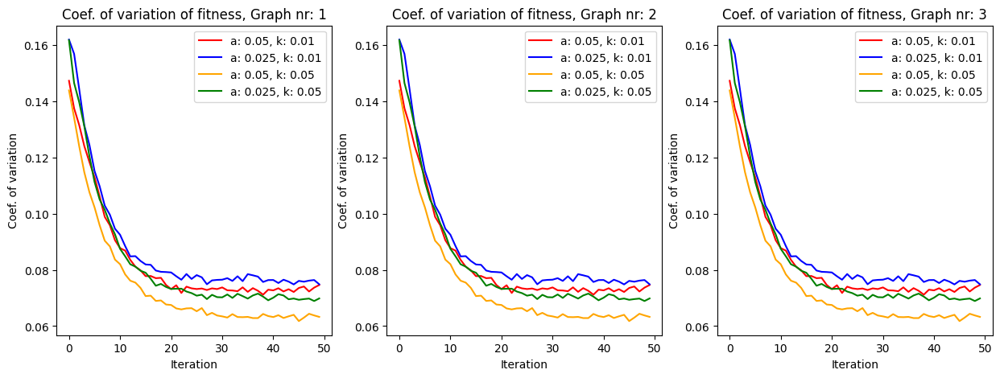

In [19]:
plot_coefvar_singles([gst0, gst1, gst2, gst3], [f'a: {obj["alpha"]}, k: {obj["kappa"]}'for obj in [gst0, gst1, gst2, gst3]], 10)

In [19]:

plot_singles([gst0, gst1, gst2, gst3], [f'a: {obj["alpha"]}, k: {obj["kappa"]}'for obj in [gst0, gst1, gst2, gst3]], 10,  
             boot_samples = [boot_500_05_05, boot_500_025_01, boot_500_05_05, boot_500_025_05], boot_labels = [None, None, None, None])

NameError: name 'gst0' is not defined

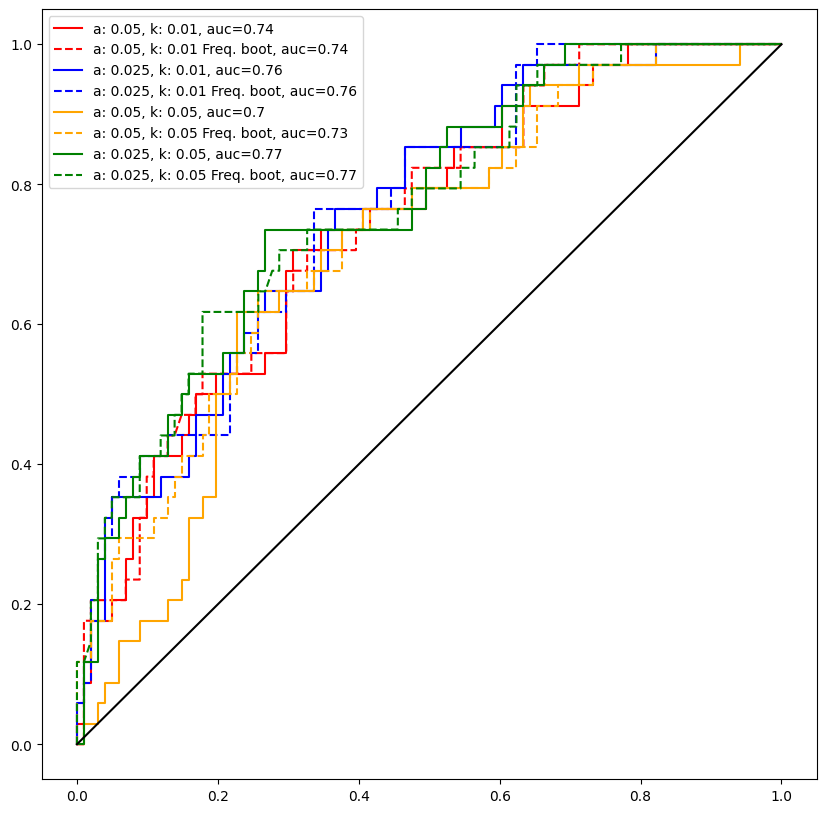

In [21]:

plot_auc_singles([gst0, gst1, gst2, gst3], [f'a: {obj["alpha"]}, k: {obj["kappa"]}'for obj in [gst0, gst1, gst2, gst3]], it = 15, d = 10)

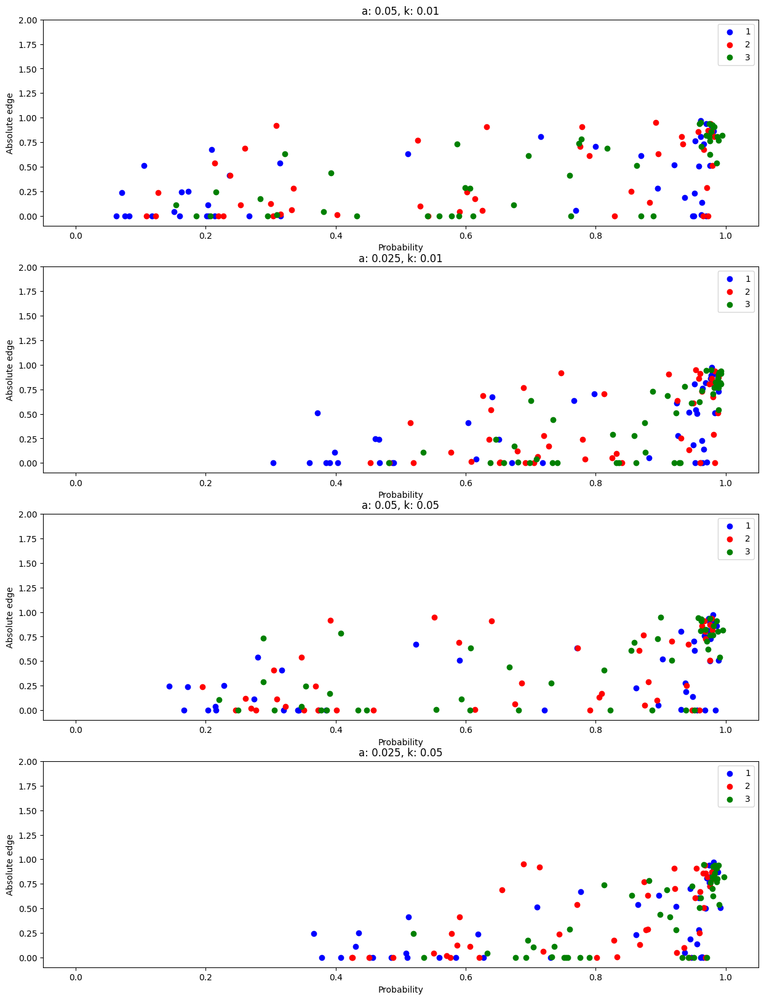

In [22]:
p_vs_abs_edge_singles([gst0, gst1, gst2, gst3], [f'a: {obj["alpha"]}, k: {obj["kappa"]}'for obj in [gst0, gst1, gst2, gst3]], it = 15)

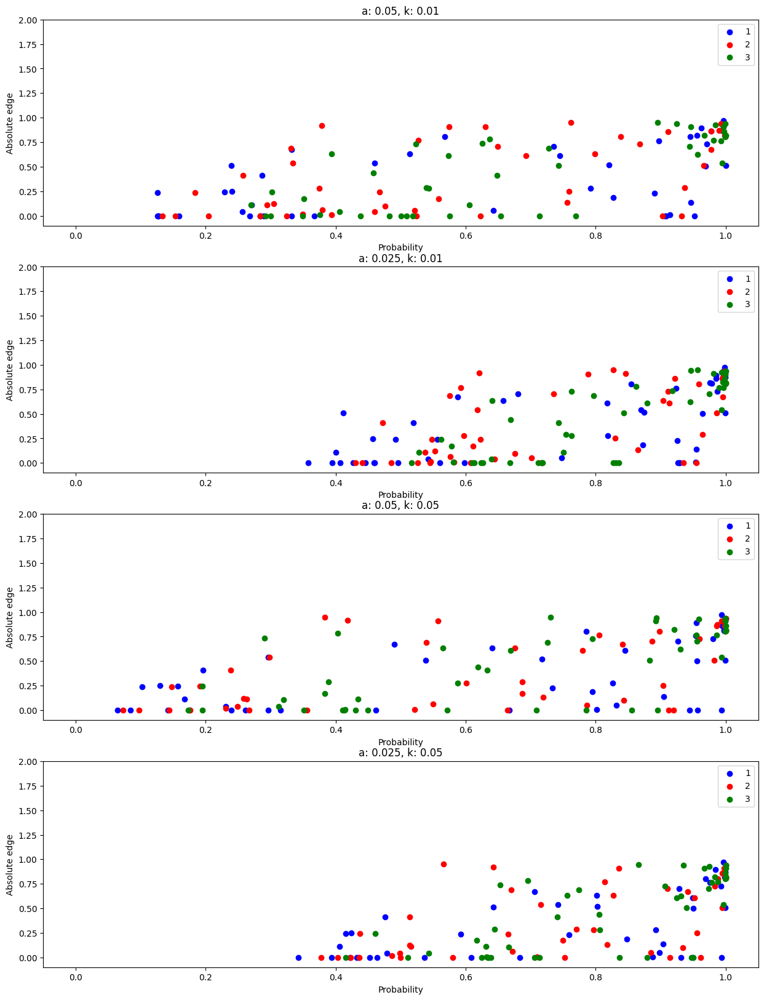

In [23]:

p_vs_abs_edge_singles_boot([gst0, gst1, gst2, gst3], [f'a: {obj["alpha"]}, k: {obj["kappa"]}'for obj in [gst0, gst1, gst2, gst3]], 10)

Cai tp0.8 sp0.6: More regulization, the higher the probability of absence. The higher the absolute value of the edge, the higher the probability of presence. AUC highest for a = 0.025, k = 0.05, lower sparsity regularization, higher temporal regularization. When we know 3 changes, but not when the change occured. Frequentist boostrap gives higher AUC


Cai tp0.8 sp0.3: More regulization, the higher the probability of absence. The higher the absolute value of the edge, the higher the probability of presence. Frequentist boostrap gives higher AUC


Zo tp0.8  sp0.6: More regulization, the higher the probability of absence. More degenerazy then the cai metric. Frequentist boostrap gives higher AUC but much closer than then for the Cai metric

Zo tp0.8  sp0.3: More regulization, the higher the probability of absence. More degenerazy then the cai metric. AUC almosth the same between the frequentist and CE.



## Compare Cai and Zero-One

In [31]:
tp = 0.6
metric = 'zero-one'
s = 0.6
spar = 0.6
k = 0.05
a = 0.025

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_zero-one_xs_xs_ew_s{0.6}_spar{spar}_tp{tp}_a{a}_k{k}_ni50_kFalse.pkl', 'rb') as handle:
    zo = pickle.load(handle)
    zo['p_distribution'] = zo['p']
    zo['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_cai_xs_xs_ew_s{0.6}_spar{spar}_tp{tp}_a{a}_k{k}_ni50_kFalse.pkl', 'rb') as handle:
    cai = pickle.load(handle)
    cai['p_distribution'] = cai['p']
    cai['As'] = gen_local_change(10,spar)


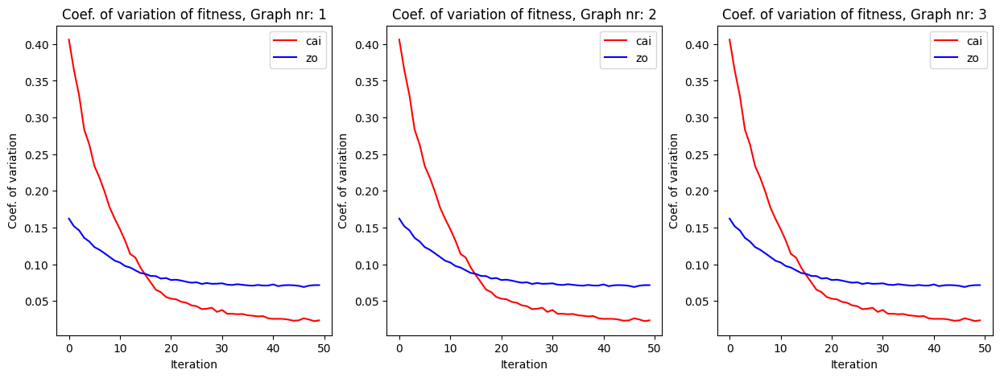

In [43]:
plot_coefvar_singles([cai, zo], ['cai', 'zo'], 10)

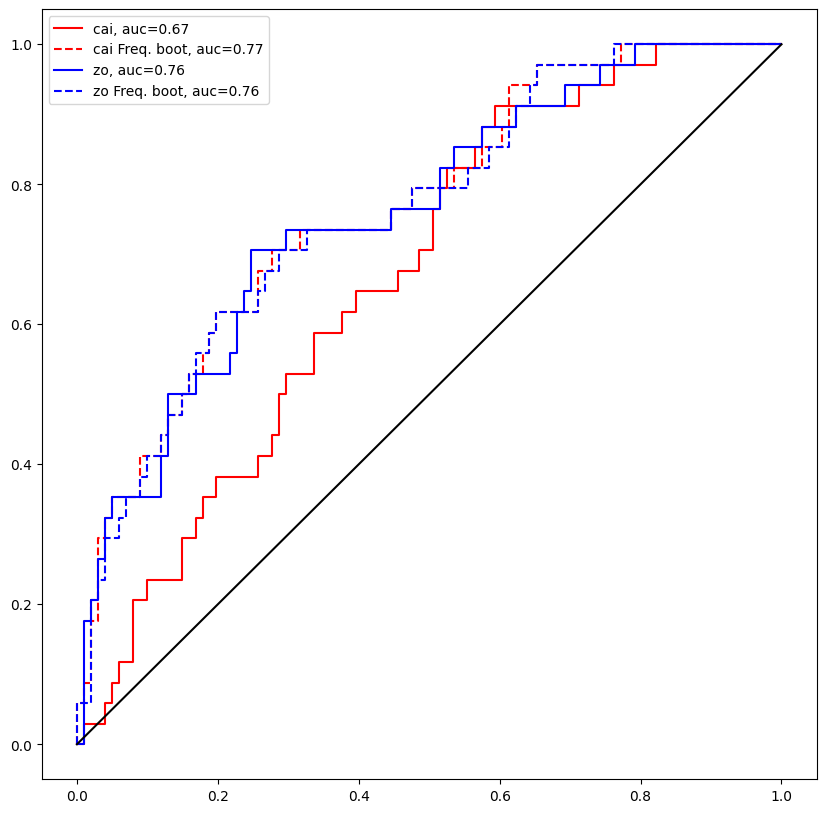

In [52]:

plot_auc_singles([cai, zo], ['cai', 'zo'], it = 15, d = 10)

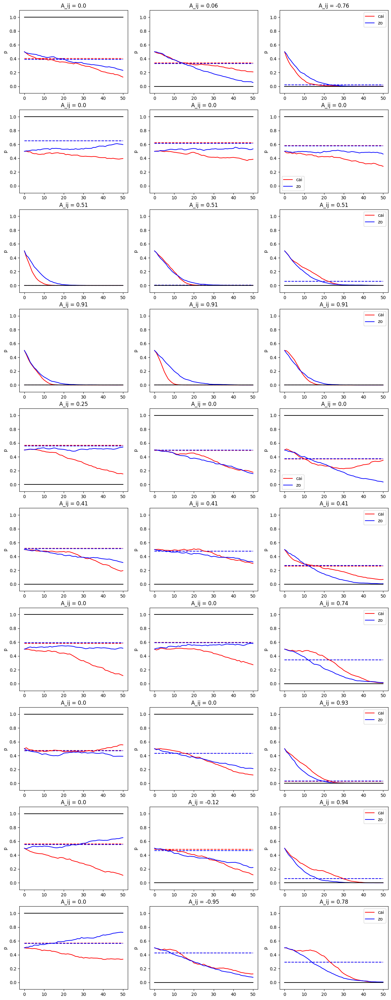

In [32]:
plot_singles([cai, zo], ['cai', 'zo'], d = 10, nr_plot = 10)

Not too dissimilr

## Compare Tail probability

In [42]:
tp = 0.6
s = 0.6
spar = 0.6
k = 0.05
a = 0.025
metric = 'cai'

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_{metric}_xs_xs_ew_s{s}_spar{spar}_tp0.5_a{a}_k{k}_ni50_kFalse.pkl', 'rb') as handle:
    tp05 = pickle.load(handle)
    tp05['p_distribution'] = tp05['p']
    tp05['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_{metric}_xs_xs_ew_s{s}_spar{spar}_tp0.6_a{a}_k{k}_ni50_kFalse.pkl', 'rb') as handle:
    tp06 = pickle.load(handle)
    tp06['p_distribution'] = tp06['p']
    tp06['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_{metric}_xs_xs_ew_s{s}_spar{spar}_tp0.8_a{a}_k{k}_ni50_kFalse.pkl', 'rb') as handle:
    tp08 = pickle.load(handle)
    tp08['p_distribution'] = tp08['p']
    tp08['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_{metric}_xs_xs_ew_s{s}_spar{spar}_tp0.9_a{a}_k{k}_ni50_kFalse.pkl', 'rb') as handle:
    tp09 = pickle.load(handle)
    tp09['p_distribution'] = tp09['p']
    tp09['As'] = gen_local_change(10,spar)

    

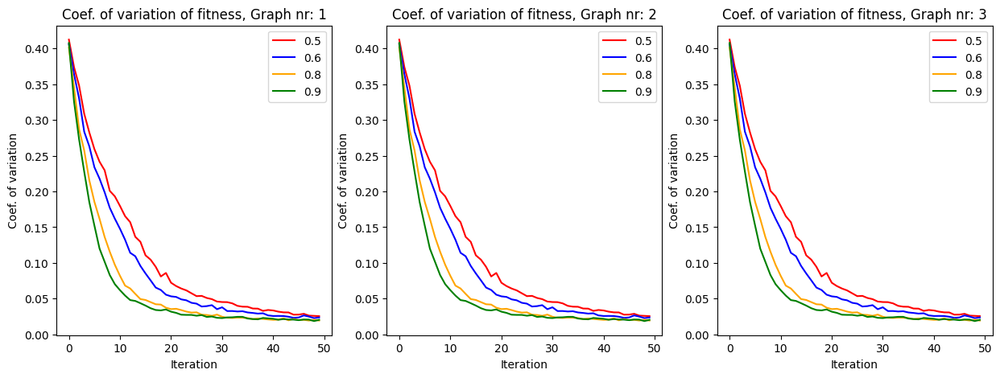

In [44]:
plot_coefvar_singles([tp05, tp06, tp08, tp09], ['0.5', '0.6', '0.8', '0.9'], 10)

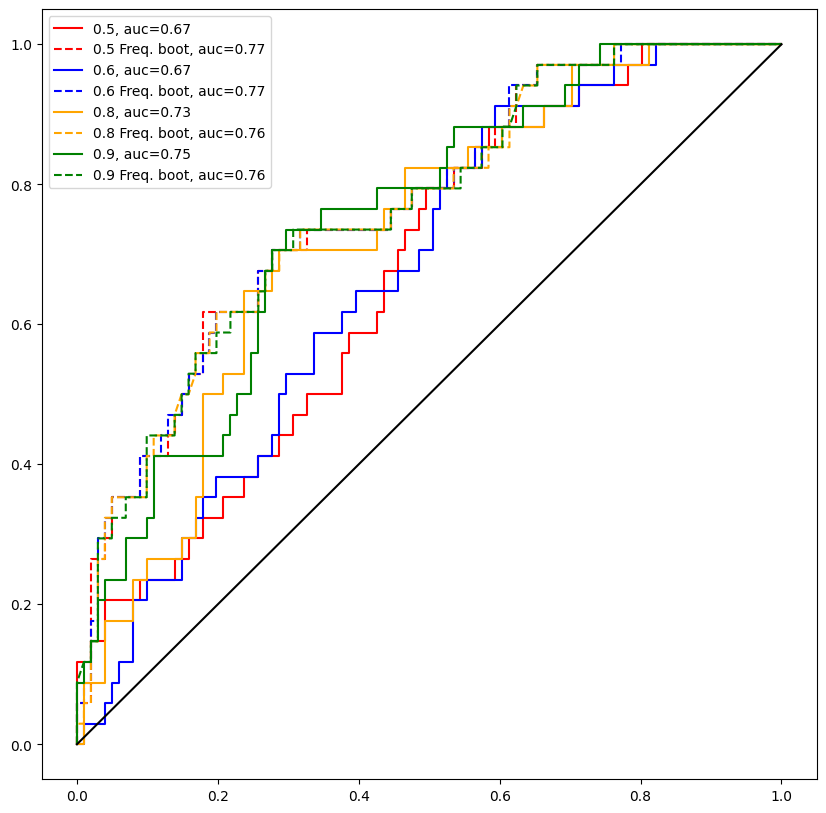

In [53]:

plot_auc_singles([tp05, tp06, tp08, tp09], ['0.5', '0.6', '0.8', '0.9'], it = 15, d = 10)

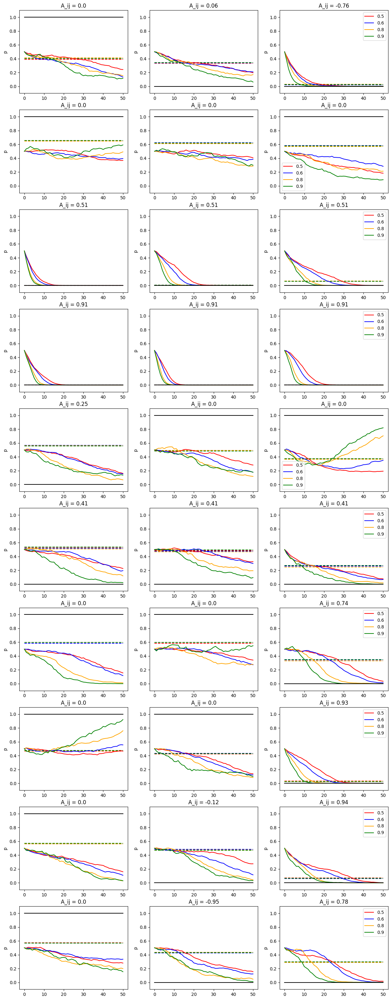

In [37]:
plot_singles([tp05, tp06, tp08, tp09], ['0.5', '0.6', '0.8', '0.9'], d = 10, nr_plot = 10)

In our case we might be want lower tail probability

## Number of iterations

In [44]:
tp = 0.6
s = 0.6
spar = 0.6
k = 0.05
a = 0.025
metric = 'zero-one'

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_{metric}_xs_xs_ew_s{s}_spar{spar}_tp{tp}_a{a}_k{k}_ni50_kFalse.pkl', 'rb') as handle:
    CE5000 = pickle.load(handle)
    CE5000['p_distribution'] = CE5000['p']
    CE5000['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_20000_gaussian_False_{metric}_xs_xs_ew_s{s}_spar{spar}_tp{tp}_a{a}_k{k}_ni50_kFalse.pkl', 'rb') as handle:
    CE20000 = pickle.load(handle)
    CE20000['p_distribution'] = CE20000['p']
    CE20000['As'] = gen_local_change(10,spar)

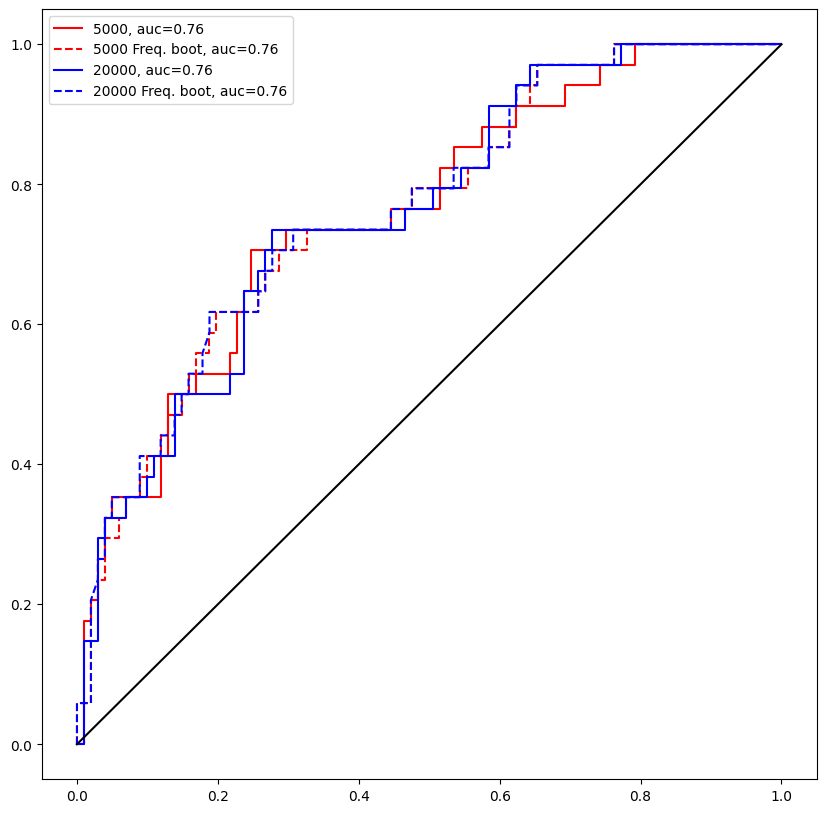

In [54]:

plot_auc_singles([CE5000, CE20000], ['5000', '20000'], it = 15, d = 10)

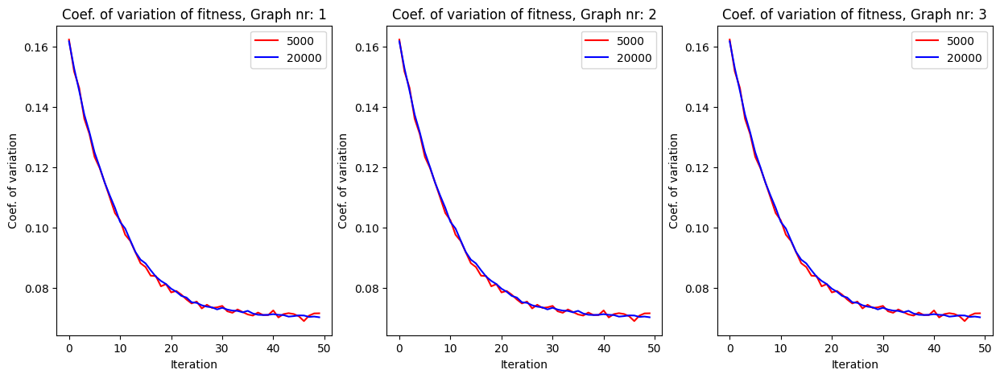

In [45]:
plot_coefvar_singles([CE5000, CE20000], ['5000', '20000'], 10)

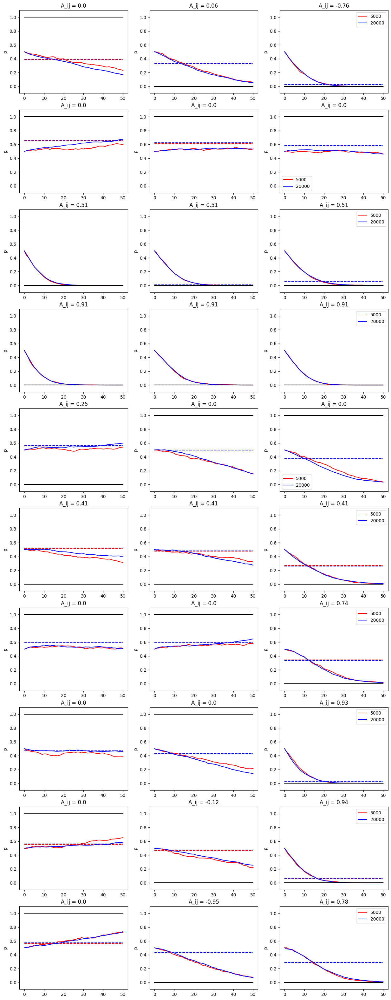

In [42]:
plot_singles([CE5000, CE20000], ['5000', '20000'], d = 10, nr_plot = 10)

No difference really

# Single known shift

Single scripts run where the change point is known, read boot matrices:

In [6]:
kappas = [0.01, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.4]
boots_g = {i:[] for i in range(len(kappas))}


for alpha in [0.005, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06]:
    print(alpha)
    for i, kappa in enumerate(kappas):

        with open(f'C:/Users/User/OneDrive/GraphHypTest/boot_w500_gaussian_xs_xs_ew_s_spar0.6_a{alpha}_k{kappa}_B50000.pkl', 'rb') as handle:
            boot_tmp = pickle.load(handle)

        boot_tmp['thetas_sim'][np.abs(boot_tmp['thetas_sim'])<1e-3] = 0
        boot_tmp = np.mean(np.sign(np.abs(boot_tmp['thetas_sim'])), 0)

        boots_g[i].append(boot_tmp)
        







0.005
0.01
0.02
0.03
0.04
0.05
0.06


In [7]:
kappas = [0.01, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.4]
boots_t = {i:[] for i in range(len(kappas))}


for alpha in [0.005, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06]:
    print(alpha)
    for i, kappa in enumerate(kappas):

        with open(f'C:/Users/User/OneDrive/GraphHypTest/boot_w500_t_xs_xs_ew_s_spar0.6_a{alpha}_k{kappa}_B50000.pkl', 'rb') as handle:
            boot_tmp = pickle.load(handle)

        boot_tmp['thetas_sim'][np.abs(boot_tmp['thetas_sim'])<1e-3] = 0
        boot_tmp = np.mean(np.sign(np.abs(boot_tmp['thetas_sim'])), 0)

        boots_t[i].append(boot_tmp)

0.005
0.01
0.02
0.03
0.04
0.05
0.06


In [10]:
# with open(f'../data/GraphHypTest/boots_500.pkl', 'wb') as handle:
#     pickle.dump(boots, handle, protocol=pickle.HIGHEST_PROTOCOL)


In [ ]:
# with open(f'../data/GraphHypTest/boots_500.pkl', 'rb') as handle:
#     boots = pickle.load(handle)

## alpha and kappa

In [26]:
tp = 0.8
metric = 'zero-one'
s = 0.6
spar = 0.6
with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_5000_gaussian_False_{metric}_xs_xs_ew_s{0.6}_spar{spar}_tp{tp}_a0.05_k0.01_ni50_kTrue.pkl', 'rb') as handle:
    gst0 = pickle.load(handle)
    gst0['p_distribution'] = gst0['p']
    gst0['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_5000_gaussian_False_{metric}_xs_xs_ew_s{0.6}_spar{spar}_tp{tp}_a0.025_k0.01_ni50_kTrue.pkl', 'rb') as handle:
    gst1 = pickle.load(handle)
    gst1['p_distribution'] = gst1['p']
    gst1['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_5000_gaussian_False_{metric}_xs_xs_ew_s{0.6}_spar{spar}_tp{tp}_a0.05_k0.05_ni50_kTrue.pkl', 'rb') as handle:
    gst2 = pickle.load(handle)
    gst2['p_distribution'] = gst2['p']
    gst2['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_5000_gaussian_False_{metric}_xs_xs_ew_s{0.6}_spar{spar}_tp{tp}_a0.025_k0.05_ni50_kTrue.pkl', 'rb') as handle:
    gst3 = pickle.load(handle)
    gst3['p_distribution'] = gst3['p']
    gst3['As'] = gen_local_change(10,spar)
    


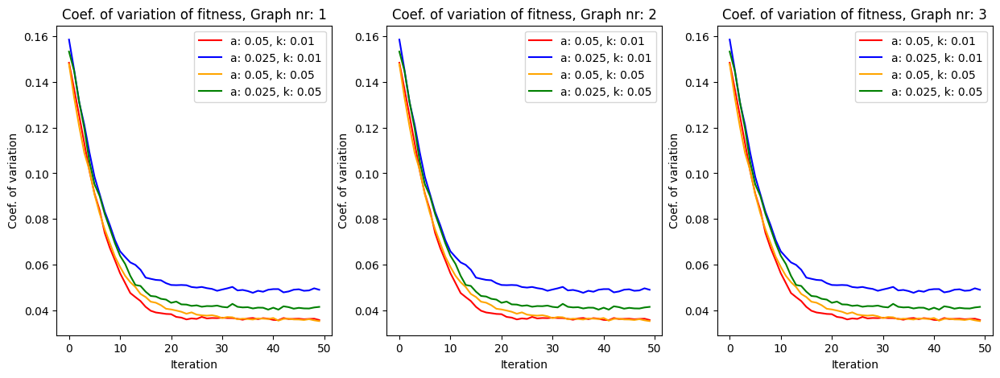

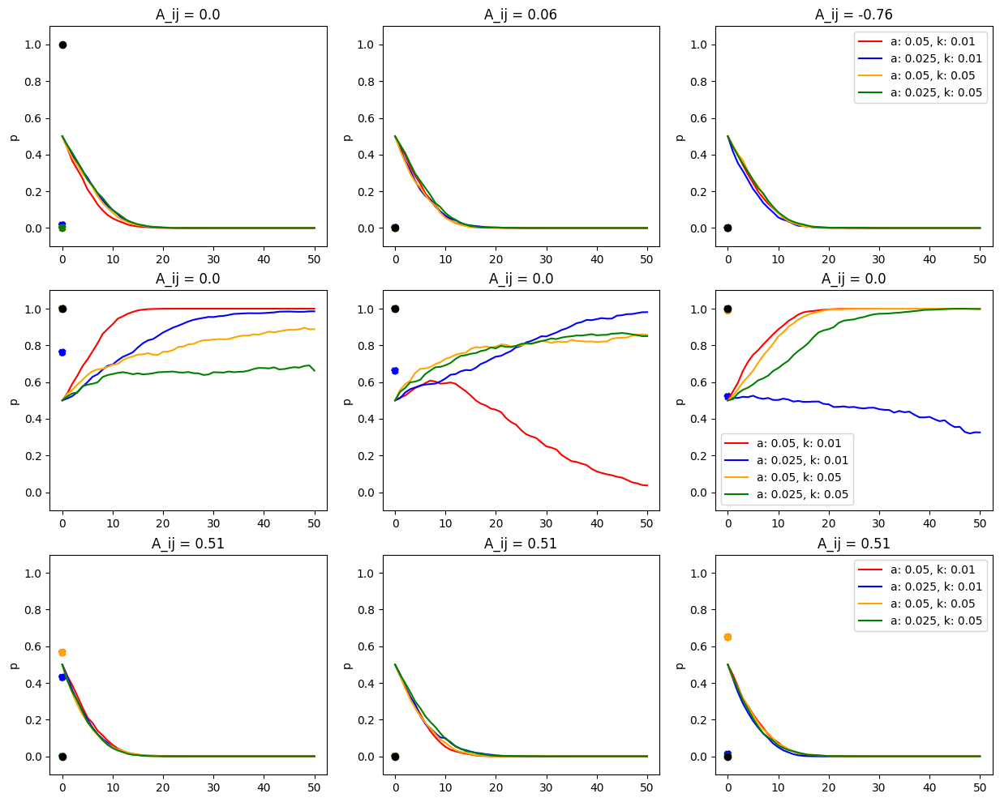

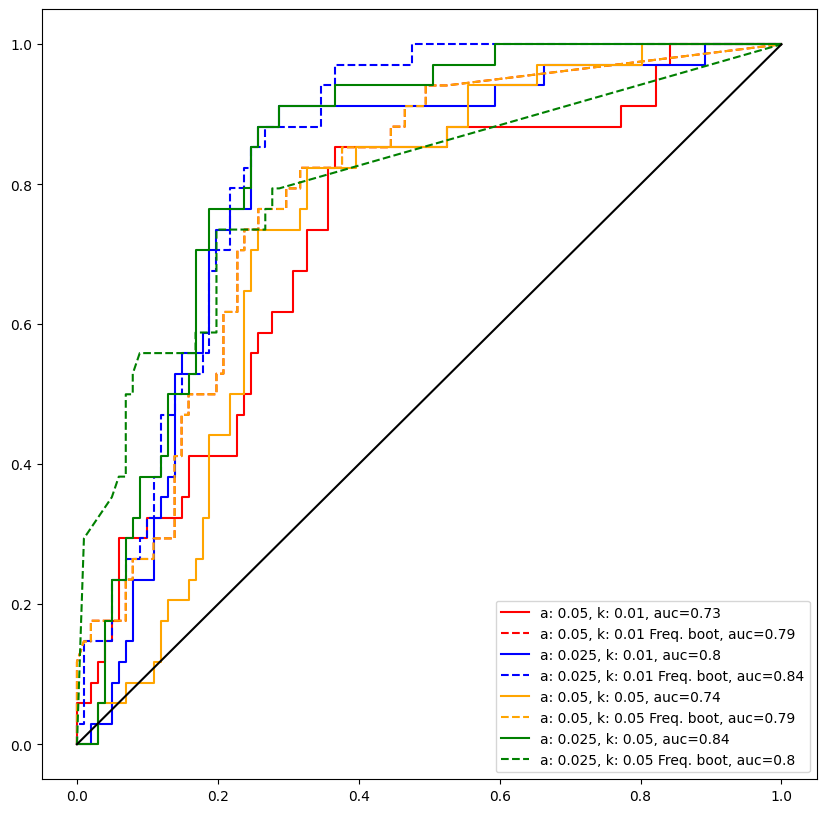

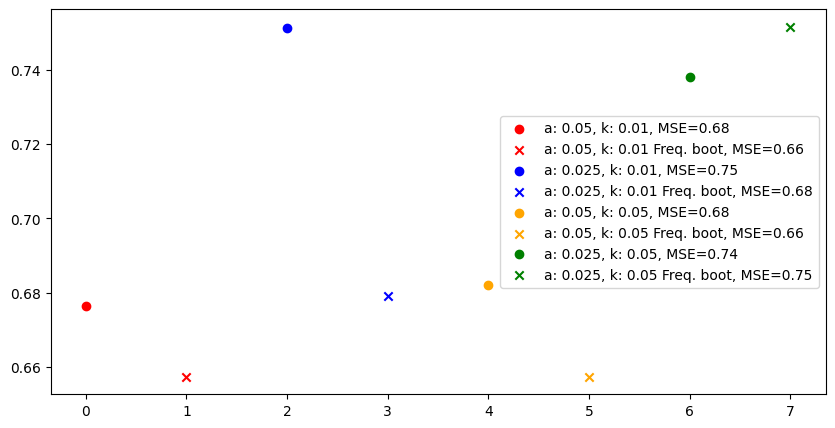

In [27]:
plot_coefvar_singles([gst0, gst1, gst2, gst3], [f'a: {obj["alpha"]}, k: {obj["kappa"]}'for obj in [gst0, gst1, gst2, gst3]], 10)
plot_singles([gst0, gst1, gst2, gst3], [f'a: {obj["alpha"]}, k: {obj["kappa"]}'for obj in [gst0, gst1, gst2, gst3]], 3,  nr_plot = 3,
             boot_samples = [boot_500_05_05, boot_500_025_01, boot_500_05_05, boot_500_025_05], boot_labels = None)
plot_auc_singles([gst0, gst1, gst2, gst3], [f'a: {obj["alpha"]}, k: {obj["kappa"]}'for obj in [gst0, gst1, gst2, gst3]], 
                 boots = [boot_500_05_05, boot_500_025_01, boot_500_05_05, boot_500_025_05],
                 it = -1, d = 10)
plot_mse_singles([gst0, gst1, gst2, gst3], [f'a: {obj["alpha"]}, k: {obj["kappa"]}'for obj in [gst0, gst1, gst2, gst3]], 
                 boots = [boot_500_05_05, boot_500_025_01, boot_500_05_05, boot_500_025_05], it = -1, d = 10)
#p_vs_abs_edge_singles([gst1,gst2], [f'a: {obj["alpha"]}, k: {obj["kappa"]}'for obj in [gst1, gst2]],it = -1)
#p_vs_abs_edge_singles_boot([gst1,gst2], [f'a: {obj["alpha"]}, k: {obj["kappa"]}'for obj in [gst1,gst2]], 10)

## Compare number per graph


In [28]:
tp = 0.6
metric = 'zero-one'
s = 0.6
spar = 0.6
a = 0.025
k = 0.01
with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_5000_gaussian_False_{metric}_xs_xs_ew_s{s}_spar{spar}_tp{tp}_a{a}_k{k}_ni50_kTrue.pkl', 'rb') as handle:
    gst500 = pickle.load(handle)
    gst500['p_distribution'] = gst500['p']
    gst500['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w5000_5000_gaussian_False_{metric}_xs_xs_ew_s{s}_spar{spar}_tp{tp}_a{a}_k{k}_ni50_kTrue.pkl', 'rb') as handle:
    gst5000 = pickle.load(handle)
    gst5000['p_distribution'] = gst5000['p']
    gst5000['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_{metric}_xs_xs_ew_s{s}_spar{spar}_tp{tp}_a{a}_k{k}_ni50_kTrue.pkl', 'rb') as handle:
    gst50 = pickle.load(handle)
    gst50['p_distribution'] = gst50['p']
    gst50['As'] = gen_local_change(10,spar)


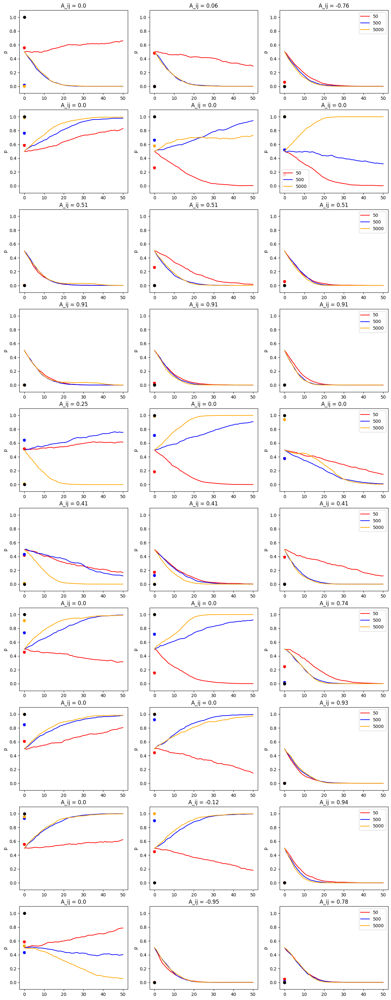

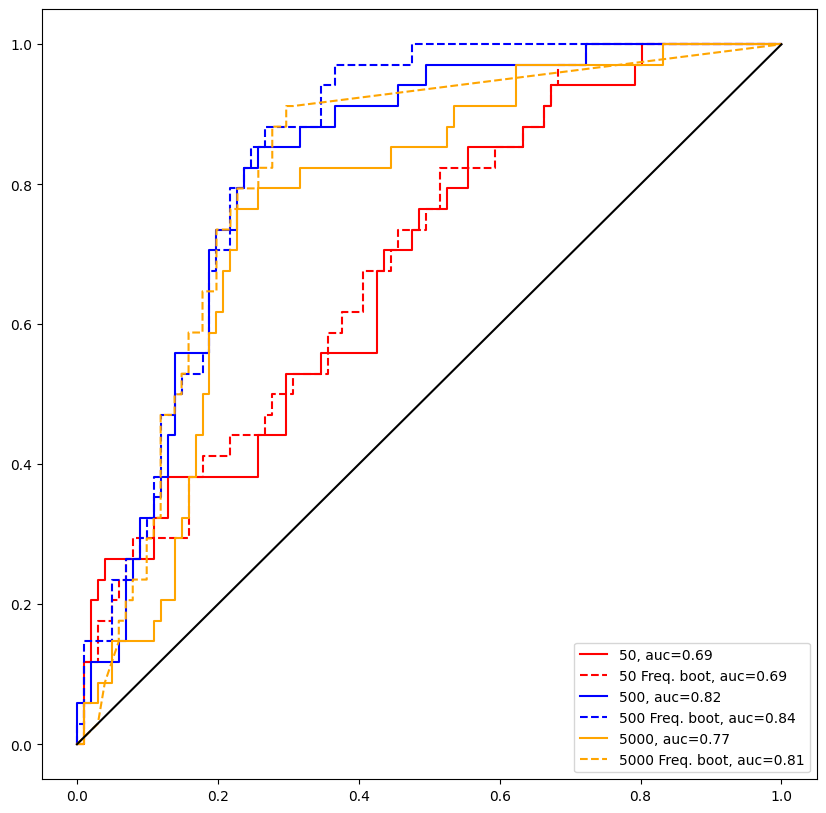

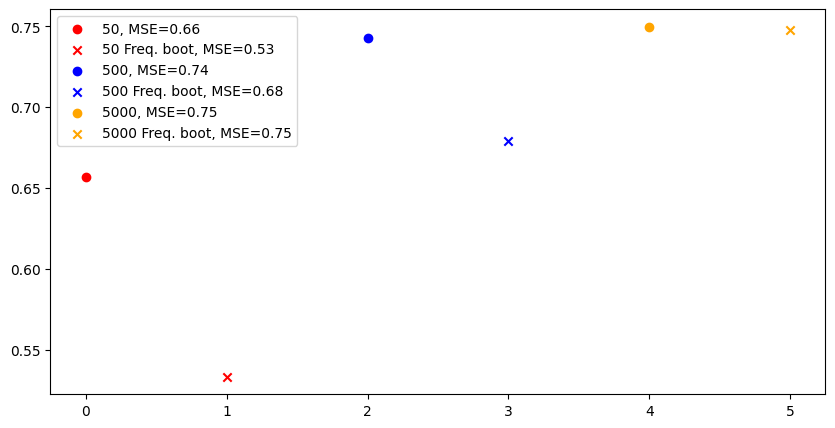

In [32]:
#plot_coefvar_singles([gst0, gst1, gst2, gst3], [f'a: {obj["alpha"]}, k: {obj["kappa"]}'for obj in [gst0, gst1, gst2, gst3]], 10)
plot_singles([gst50, gst500, gst5000], ['50', '500', '5000'],
             boot_samples = [boot_50_025_01, boot_500_025_01, boot_5000_025_01], boot_labels = None,  nr_plot = 10, d = 10)
plot_auc_singles([gst50, gst500, gst5000], ['50', '500', '5000'], it = -1, d = 10,
boots  = [boot_50_025_01, boot_500_025_01, boot_5000_025_01])
plot_mse_singles([gst50, gst500, gst5000], ['50', '500', '5000'], it = -1, d = 10,
boots  = [boot_50_025_01, boot_500_025_01, boot_5000_025_01])
#p_vs_abs_edge_singles([gst1,gst2], [f'a: {obj["alpha"]}, k: {obj["kappa"]}'for obj in [gst1, gst2]],it = -1)
#p_vs_abs_edge_singles_boot([gst1,gst2], [f'a: {obj["alpha"]}, k: {obj["kappa"]}'for obj in [gst1,gst2]], 10)

## Compare number of iterations - what is up with 5000 in some cases?

In [10]:
tp = 0.6
metric = 'zero-one'
s = 0.6
spar = 0.6
k = 0.01
a = 0.025

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_100_gaussian_False_{metric}_xs_xs_ew_s{0.6}_spar{spar}_tp{tp}_a{a}_k{k}_ni50_kTrue.pkl', 'rb') as handle:
    nr_100 = pickle.load(handle)
    nr_100['p_distribution'] = nr_100['p']
    nr_100['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_500_gaussian_False_{metric}_xs_xs_ew_s{0.6}_spar{spar}_tp{tp}_a{a}_k{k}_ni50_kTrue.pkl', 'rb') as handle:
    nr_500 = pickle.load(handle)
    nr_500['p_distribution'] = nr_100['p']
    nr_500['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_500_gaussian_False_{metric}_xs_xs_ew_s{0.6}_spar{spar}_tp{tp}_a{a}_k{k}_ni50_kTrue.pkl', 'rb') as handle:
    nr_500 = pickle.load(handle)
    nr_500['p_distribution'] = nr_500['p']
    nr_500['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_1000_gaussian_False_{metric}_xs_xs_ew_s{0.6}_spar{spar}_tp{tp}_a{a}_k{k}_ni50_kTrue.pkl', 'rb') as handle:
    nr_1000 = pickle.load(handle)
    nr_1000['p_distribution'] = nr_1000['p']
    nr_1000['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_3000_gaussian_False_{metric}_xs_xs_ew_s{0.6}_spar{spar}_tp{tp}_a{a}_k{k}_ni50_kTrue.pkl', 'rb') as handle:
    nr_3000 = pickle.load(handle)
    nr_3000['p_distribution'] = nr_3000['p']
    nr_3000['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_5000_gaussian_False_{metric}_xs_xs_ew_s{0.6}_spar{spar}_tp{tp}_a{a}_k{k}_ni50_kTrue.pkl', 'rb') as handle:
    nr_5000 = pickle.load(handle)
    nr_5000['p_distribution'] = nr_5000['p']
    nr_5000['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_4000_gaussian_False_{metric}_xs_xs_ew_s{0.6}_spar{spar}_tp{tp}_a{a}_k{k}_ni50_kTrue.pkl', 'rb') as handle:
    nr_4000 = pickle.load(handle)
    nr_4000['p_distribution'] = nr_4000['p']
    nr_4000['As'] = gen_local_change(10,spar)


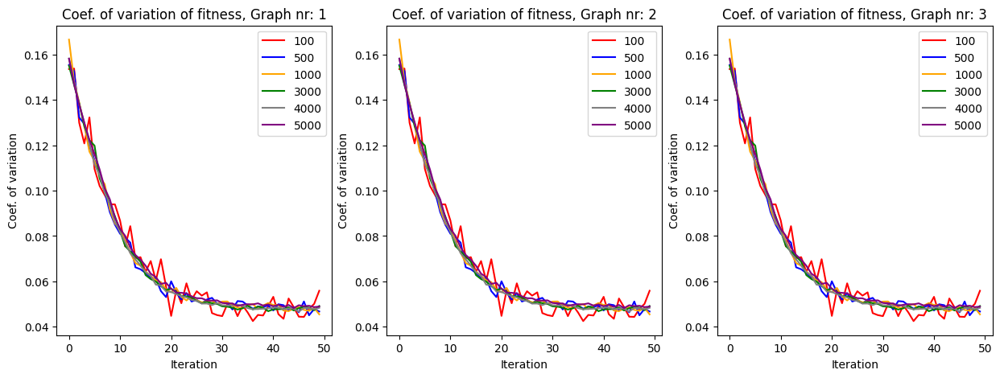

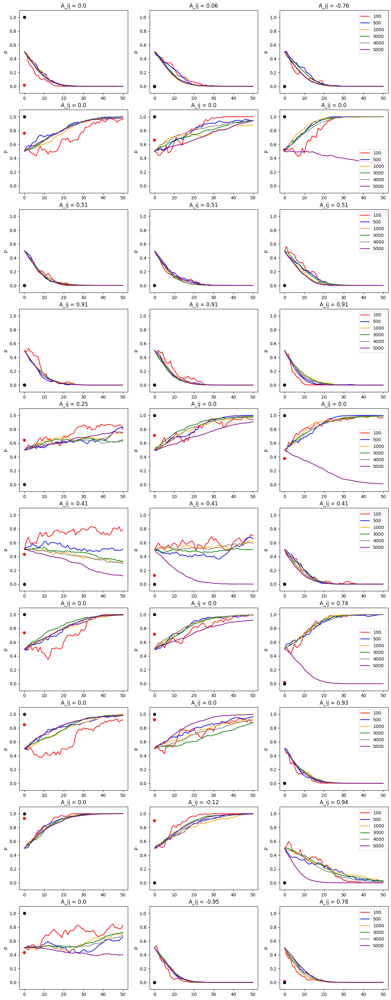

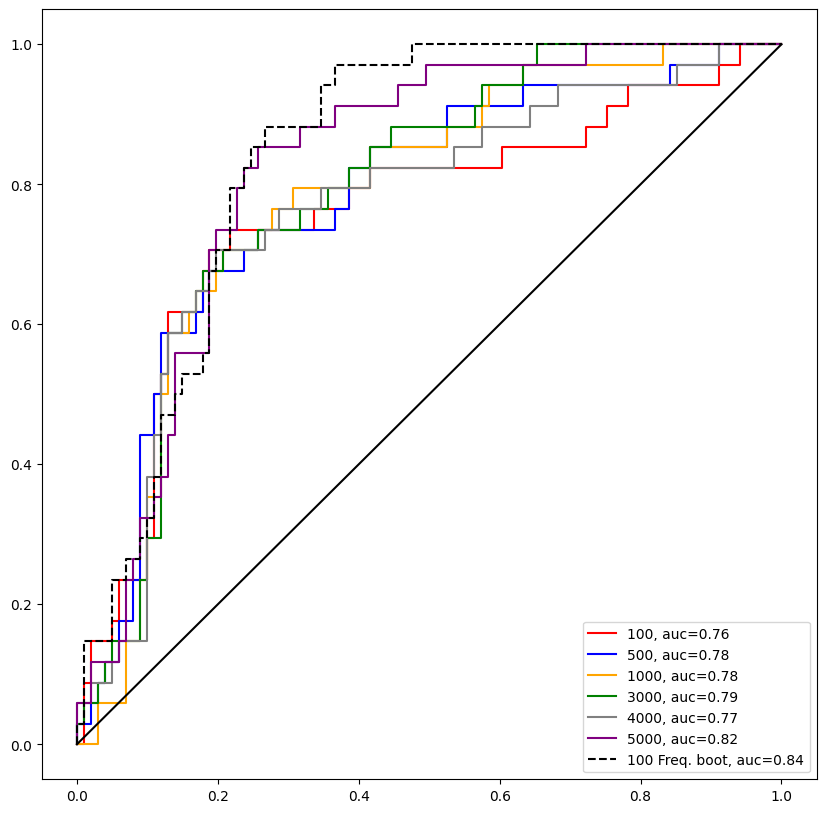

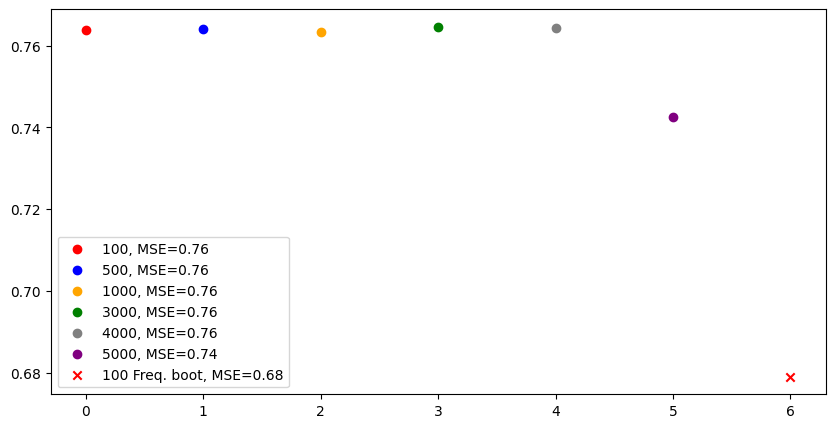

In [11]:
plot_coefvar_singles([nr_100, nr_500, nr_1000,  nr_3000, nr_4000, nr_5000], ['100', '500', '1000', '3000', '4000', '5000'], 10)
plot_singles([nr_100, nr_500, nr_1000,  nr_3000, nr_4000, nr_5000], ['100', '500', '1000', '3000', '4000', '5000'], 10,  nr_plot = 10, boot_samples = [boot_500_025_01])
plot_auc_singles([nr_100, nr_500, nr_1000,  nr_3000, nr_4000, nr_5000], ['100', '500', '1000', '3000', '4000', '5000'], it = -1, d = 10, boots = [boot_500_025_01])
plot_mse_singles([nr_100, nr_500, nr_1000,  nr_3000, nr_4000, nr_5000], ['100', '500', '1000', '3000', '4000', '5000'], it = -1, d = 10, boots = [boot_500_025_01])

## Compare s and tp
Very low tp


In [8]:
tp = 0.3
metric = 'zero-one'
spar = 0.6
k = 0.01
a = 0.025

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_1000_gaussian_False_{metric}_xs_xs_ew_s{0.1}_spar{spar}_tp{tp}_a{a}_k{k}_ni200_kTrue.pkl', 'rb') as handle:
    s01 = pickle.load(handle)
    s01['p_distribution'] = s01['p']
    s01['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_1000_gaussian_False_{metric}_xs_xs_ew_s{0.2}_spar{spar}_tp{tp}_a{a}_k{k}_ni200_kTrue.pkl', 'rb') as handle:
    s02 = pickle.load(handle)
    s02['p_distribution'] = s02['p']
    s02['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_1000_gaussian_False_{metric}_xs_xs_ew_s{0.3}_spar{spar}_tp{tp}_a{a}_k{k}_ni200_kTrue.pkl', 'rb') as handle:
    s03 = pickle.load(handle)
    s03['p_distribution'] = s03['p']
    s03['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_1000_gaussian_False_{metric}_xs_xs_ew_s{0.4}_spar{spar}_tp{tp}_a{a}_k{k}_ni200_kTrue.pkl', 'rb') as handle:
    s04 = pickle.load(handle)
    s04['p_distribution'] = s04['p']
    s04['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_1000_gaussian_False_{metric}_xs_xs_ew_s{0.6}_spar{spar}_tp{tp}_a{a}_k{k}_ni200_kTrue.pkl', 'rb') as handle:
    s06 = pickle.load(handle)
    s06['p_distribution'] = s06['p']
    s06['As'] = gen_local_change(10,spar)

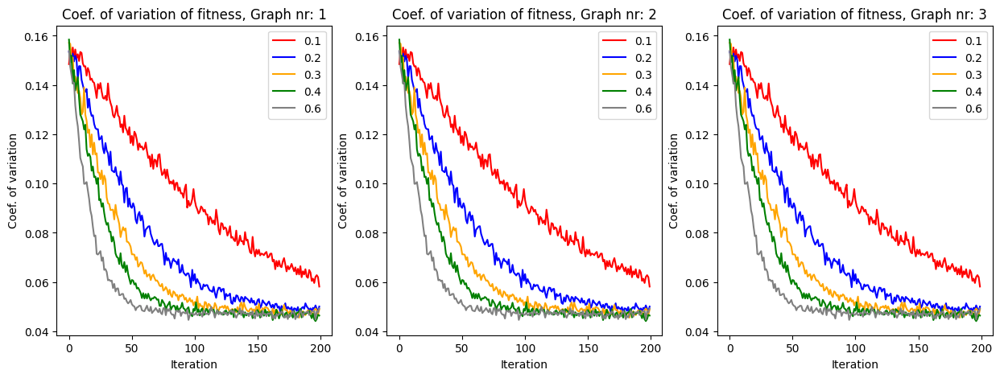

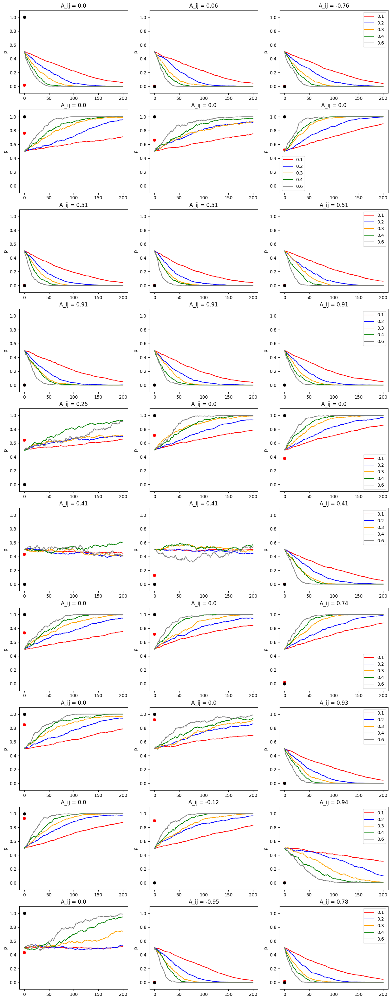

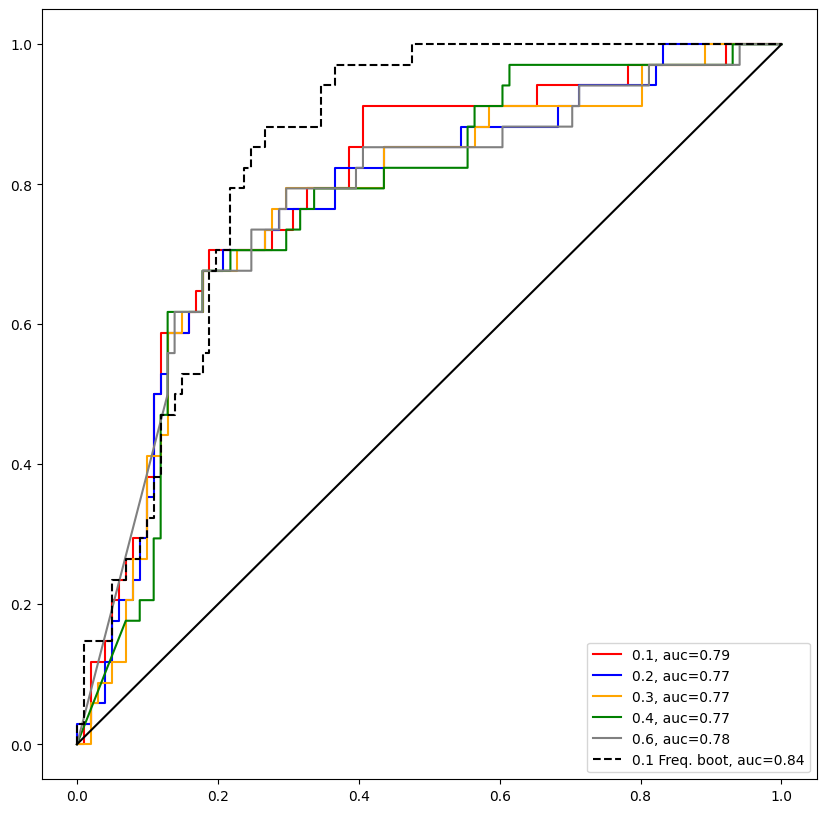

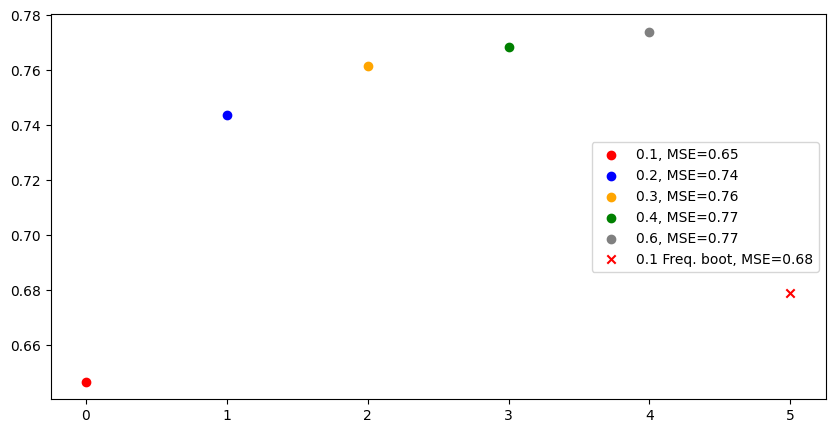

In [9]:
plot_coefvar_singles([s01, s02, s03, s04, s06], ['0.1', '0.2', '0.3', '0.4', '0.6'], 10)
plot_singles([s01, s02, s03, s04, s06], ['0.1', '0.2', '0.3', '0.4', '0.6'], 10,  nr_plot = 10, boot_samples=[boot_500_025_01])
plot_auc_singles([s01, s02, s03, s04, s06], ['0.1', '0.2', '0.3', '0.4', '0.6'], boots = [boot_500_025_01], it = -1, d = 10)
plot_mse_singles([s01, s02, s03, s04, s06], ['0.1', '0.2', '0.3', '0.4', '0.6'], boots = [boot_500_025_01], it = -1, d = 10)

In [11]:
theta_sim = simulate(s03['p_distribution'], s03['X'], 1000, 500, 10, 0.01)

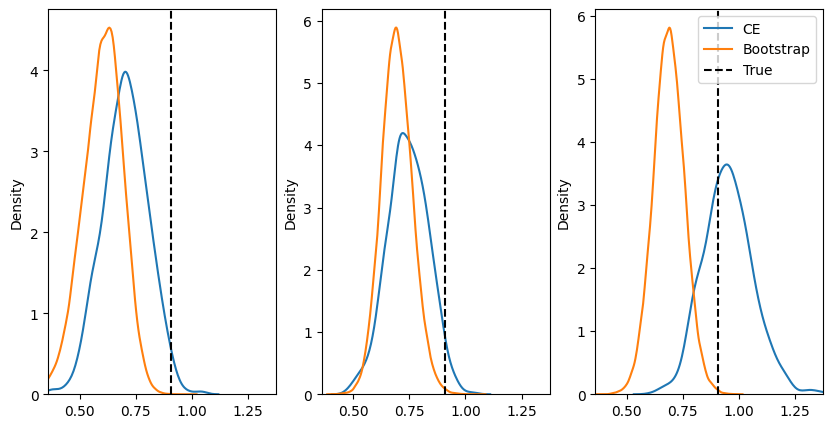

In [38]:
As = s03['As']
H = 3

fig, ax = plt.subplots(1,3, figsize = (10,5))
cnt = 0
h = 0
i = 0
j = 4
cnt_col = cnt % 3
cnt_row = int(cnt / 3)
for h in range(H):
    sns.kdeplot(theta_sim[:,h,i,j], ax = ax[h], label ='CE')
    sns.kdeplot(boot_500_025_01s['thetas_sim'][:,h,i,j], ax = ax[h], label ='Bootstrap')
    ax[h].axvline(x = As[h][i,j], label = 'True', color = 'black', linestyle = 'dashed')
    ax[h].set_xlim((np.min((np.min(np.array(theta_sim)[:,:,i,j]), As[h,i,j]-0.05)),np.max((np.max(np.array(theta_sim)[:,:,i,j]), As[h,i,j]+0.05))))
    if h == 2:
        ax[h].legend()
cnt+=1


## Effect of perturbation no schedule 

In [17]:
tp = 0.8 #8 6 4 2 1
metric = 'zero-one'
spar = 0.6
k = 0.01
a = 0.025
s = 0.6

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_1000_gaussian_False_zero-one_xs_xs_ew_s{0.1}_scsFalse_sctpFalse_spar0.6_tp{tp}_a0.025_k0.01_ni100_kTrue_perTrue_dbFalse_sper0.5.pkl', 'rb') as handle:
    p01 = pickle.load(handle)
    p01['p_distribution'] = p01['p']
    p01['As'] = gen_local_change(10,spar)


with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_1000_gaussian_False_zero-one_xs_xs_ew_s{0.2}_scsFalse_sctpFalse_spar0.6_tp{tp}_a0.025_k0.01_ni100_kTrue_perTrue_dbFalse_sper0.5.pkl', 'rb') as handle:
    p02 = pickle.load(handle)
    p02['p_distribution'] = p02['p']
    p02['As'] = gen_local_change(10,spar)


with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_1000_gaussian_False_zero-one_xs_xs_ew_s{0.3}_scsFalse_sctpFalse_spar0.6_tp{tp}_a0.025_k0.01_ni100_kTrue_perTrue_dbFalse_sper0.5.pkl', 'rb') as handle:
    p03 = pickle.load(handle)
    p03['p_distribution'] = p03['p']
    p03['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_1000_gaussian_False_zero-one_xs_xs_ew_s{0.4}_scsFalse_sctpFalse_spar0.6_tp{tp}_a0.025_k0.01_ni100_kTrue_perTrue_dbFalse_sper0.5.pkl', 'rb') as handle:
    p04 = pickle.load(handle)
    p04['p_distribution'] = p04['p']
    p04['As'] = gen_local_change(10,spar)







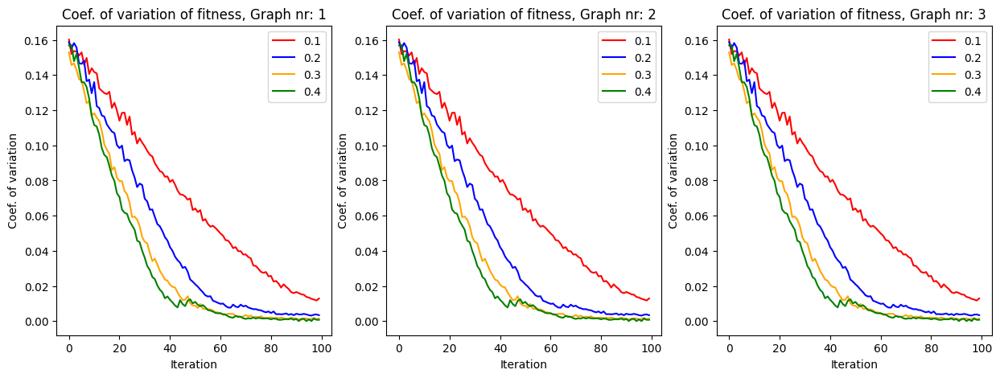

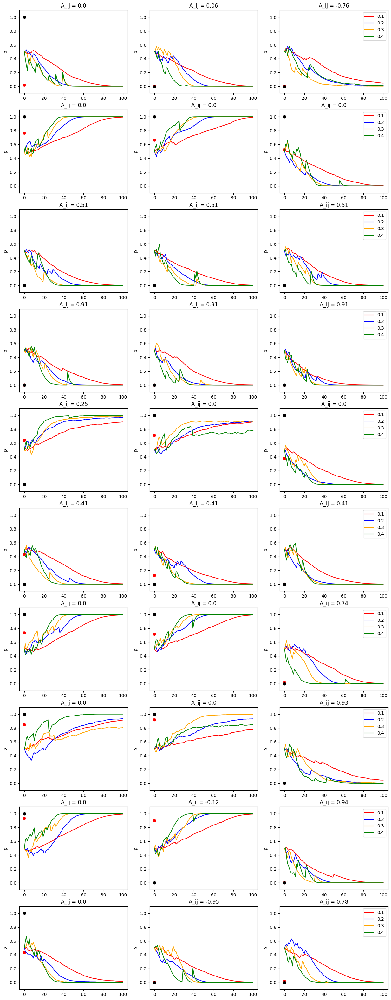

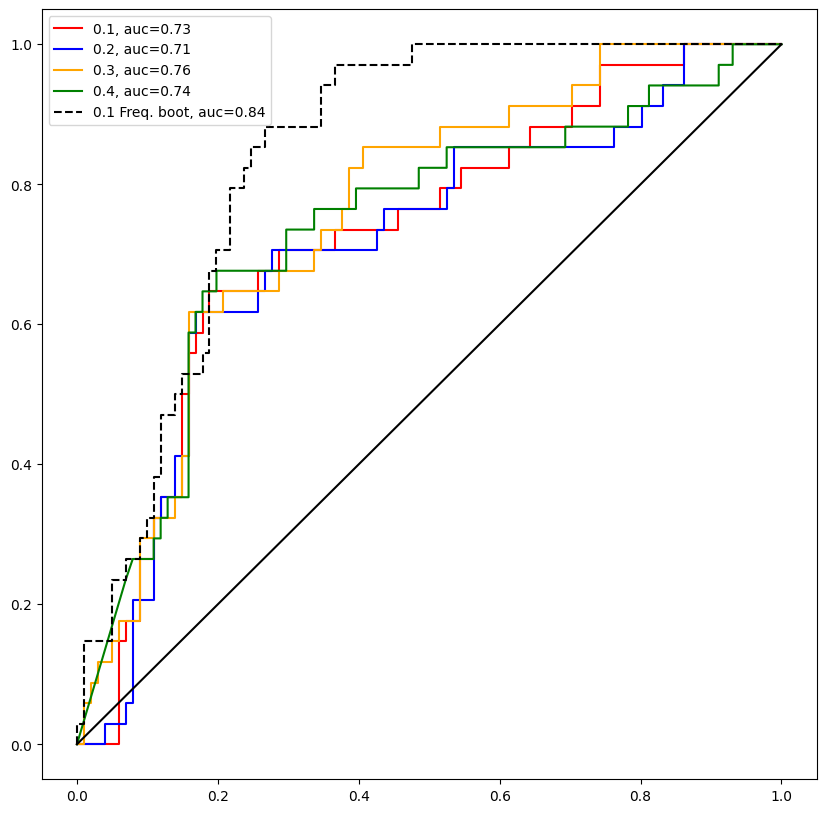

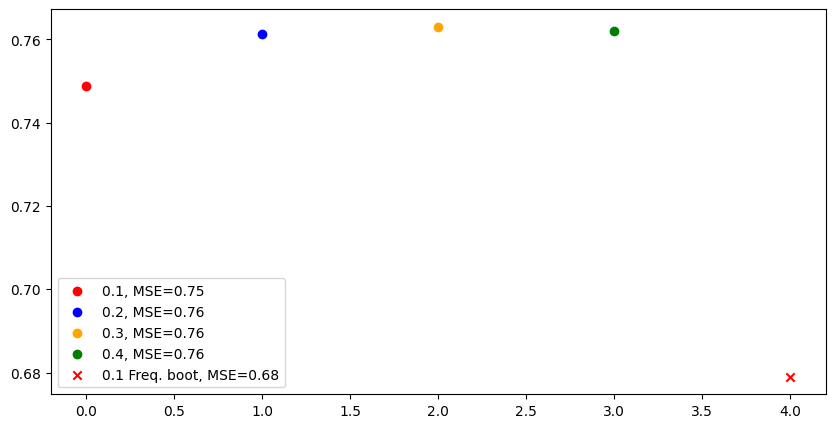

In [18]:
plot_coefvar_singles([p01, p02, p03, p04], ['0.1', '0.2', '0.3','0.4'], 10)
plot_singles([p01, p02, p03, p04], ['0.1', '0.2', '0.3', '0.4'], 10,  nr_plot = 10, boot_samples=[boot_500_025_01])
plot_auc_singles([p01, p02, p03, p04], ['0.1', '0.2', '0.3', '0.4'], boots = [boot_500_025_01], it = -1, d = 10)
plot_mse_singles([p01, p02, p03, p04], ['0.1', '0.2', '0.3', '0.4'], boots = [boot_500_025_01], it = -1, d = 10)

## Effect of perturbation outer boot

In [10]:
tp = 0.8 #8 6 4 2 1
metric = 'zero-one'
spar = 0.6
k = 0.01
a = 0.025
s = 0.6

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_1000_gaussian_False_zero-one_xs_xs_ew_s{0.1}_scsFalse_sctpFalse_spar0.6_tp{tp}_a0.025_k0.01_ni100_kTrue_perTrue_dbbo_sper0.5.pkl', 'rb') as handle:
    p01 = pickle.load(handle)
    p01['p_distribution'] = p01['p']
    p01['As'] = gen_local_change(10,spar)


with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_1000_gaussian_False_zero-one_xs_xs_ew_s{0.2}_scsFalse_sctpFalse_spar0.6_tp{tp}_a0.025_k0.01_ni100_kTrue_perTrue_dbbo_sper0.5.pkl', 'rb') as handle:
    p02 = pickle.load(handle)
    p02['p_distribution'] = p02['p']
    p02['As'] = gen_local_change(10,spar)


with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_1000_gaussian_False_zero-one_xs_xs_ew_s{0.3}_scsFalse_sctpFalse_spar0.6_tp{tp}_a0.025_k0.01_ni100_kTrue_perTrue_dbbo_sper0.5.pkl', 'rb') as handle:
    p03 = pickle.load(handle)
    p03['p_distribution'] = p03['p']
    p03['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_1000_gaussian_False_zero-one_xs_xs_ew_s{0.4}_scsFalse_sctpFalse_spar0.6_tp{tp}_a0.025_k0.01_ni100_kTrue_perTrue_dbbo_sper0.5.pkl', 'rb') as handle:
    p04 = pickle.load(handle)
    p04['p_distribution'] = p04['p']
    p04['As'] = gen_local_change(10,spar)







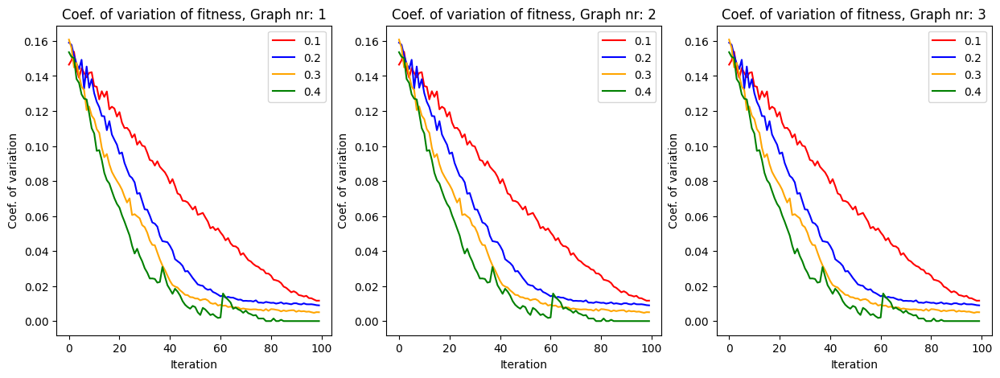

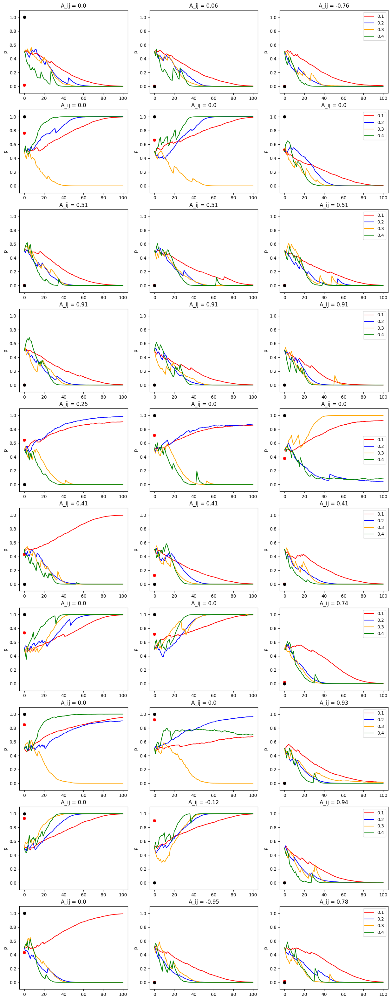

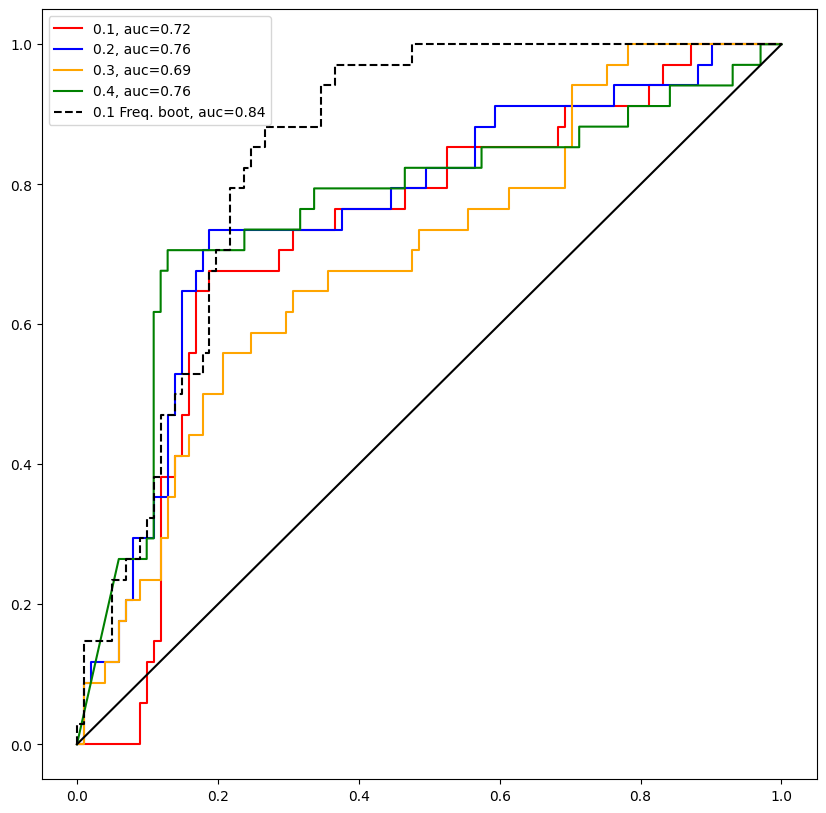

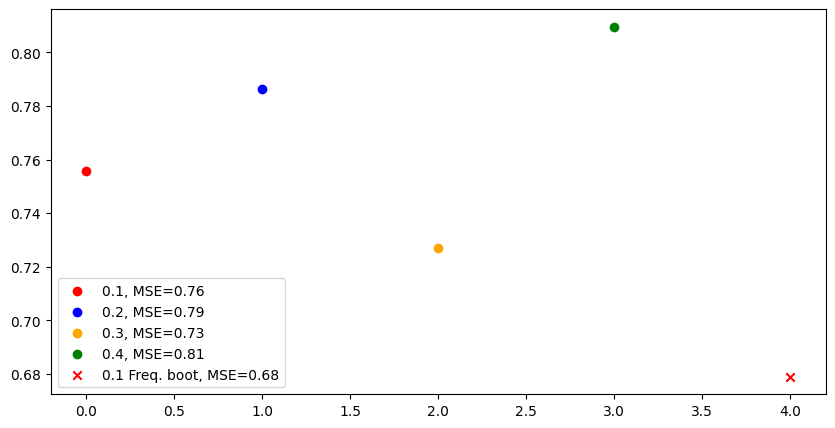

In [11]:
plot_coefvar_singles([p01, p02, p03, p04], ['0.1', '0.2', '0.3','0.4'], 10)
plot_singles([p01, p02, p03, p04], ['0.1', '0.2', '0.3', '0.4'], 10,  nr_plot = 10, boot_samples=[boot_500_025_01])
plot_auc_singles([p01, p02, p03, p04], ['0.1', '0.2', '0.3', '0.4'], boots = [boot_500_025_01], it = -1, d = 10)
plot_mse_singles([p01, p02, p03, p04], ['0.1', '0.2', '0.3', '0.4'], boots = [boot_500_025_01], it = -1, d = 10)

## Effect perturbation alpha kappa

In [12]:
tp = 0.8 # 8 6 
metric = 'zero-one'
spar = 0.6
s = 0.4 # 0.4, 0.6
k = 0.01
sper = 0.5
N = 1000
ni = 130





with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_{N}_gaussian_False_zero-one_xs_xs_ew_s{s}_scsFalse_sctpFalse_spar0.6_tp{tp}_a{0.005}_k{k}_ni{ni}_kTrue_perTrue_dbnb_sper{sper}.pkl', 'rb') as handle:
    p01 = pickle.load(handle)
    p01['p_distribution'] = p01['p']
    p01['As'] = gen_local_change(10,spar)


with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_{N}_gaussian_False_zero-one_xs_xs_ew_s{s}_scsFalse_sctpFalse_spar0.6_tp{tp}_a{0.01}_k{k}_ni{ni}_kTrue_perTrue_dbnb_sper{sper}.pkl', 'rb') as handle:
    p02 = pickle.load(handle)
    p02['p_distribution'] = p02['p']
    p02['As'] = gen_local_change(10,spar)


with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_{N}_gaussian_False_zero-one_xs_xs_ew_s{s}_scsFalse_sctpFalse_spar0.6_tp{tp}_a{0.02}_k{k}_ni{ni}_kTrue_perTrue_dbnb_sper{sper}.pkl', 'rb') as handle:
    p03 = pickle.load(handle)
    p03['p_distribution'] = p03['p']
    p03['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_{N}_gaussian_False_zero-one_xs_xs_ew_s{s}_scsFalse_sctpFalse_spar0.6_tp{tp}_a{0.03}_k{k}_ni{ni}_kTrue_perTrue_dbnb_sper{sper}.pkl', 'rb') as handle:
    p04 = pickle.load(handle)
    p04['p_distribution'] = p04['p']
    p04['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_{N}_gaussian_False_zero-one_xs_xs_ew_s{s}_scsFalse_sctpFalse_spar0.6_tp{tp}_a{0.04}_k{k}_ni{ni}_kTrue_perTrue_dbnb_sper{sper}.pkl', 'rb') as handle:
    p05 = pickle.load(handle)
    p05['p_distribution'] = p05['p']
    p05['As'] = gen_local_change(10,spar)


with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_{N}_gaussian_False_zero-one_xs_xs_ew_s{s}_scsFalse_sctpFalse_spar0.6_tp{tp}_a{0.05}_k{k}_ni{ni}_kTrue_perTrue_dbnb_sper{sper}.pkl', 'rb') as handle:
    p06 = pickle.load(handle)
    p06['p_distribution'] = p06['p']
    p06['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_{N}_gaussian_False_zero-one_xs_xs_ew_s{s}_scsFalse_sctpFalse_spar0.6_tp{tp}_a{0.06}_k{k}_ni{ni}_kTrue_perTrue_dbnb_sper{sper}.pkl', 'rb') as handle:
    p07 = pickle.load(handle)
    p07['p_distribution'] = p07['p']
    p07['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_{N}_gaussian_False_zero-one_xs_xs_ew_s{s}_scsFalse_sctpFalse_spar0.6_tp{tp}_a{0.07}_k{k}_ni{ni}_kTrue_perTrue_dbnb_sper{sper}.pkl', 'rb') as handle:
    p08 = pickle.load(handle)
    p08['p_distribution'] = p08['p']
    p08['As'] = gen_local_change(10,spar)



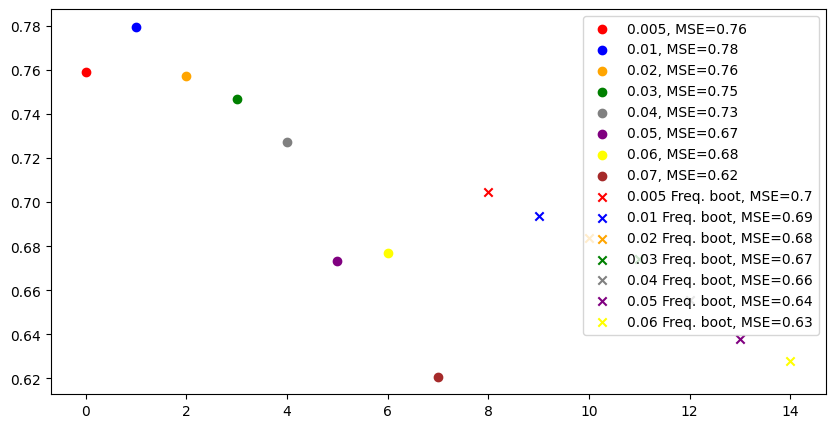

In [17]:
#plot_coefvar_singles([p01, p02, p03, p04, p05, p06, p07, p08], ['0.005', '0.01', '0.02','0.03', '0.04', '0.05', '0.06', '0.07'], 10)
#plot_singles([p01, p02, p03, p04, p05, p06, p07, p08], ['0.005', '0.01', '0.02','0.03', '0.04', '0.05', '0.06', '0.07'], 10,  nr_plot = 10, boot_samples=[boot_500_025_01])
#plot_auc_singles([p01, p02, p03, p04, p05, p06, p07, p08], ['0.005', '0.01', '0.02','0.03', '0.04', '0.05', '0.06', '0.07'], boots = [boot_500_025_01], it = -1, d = 10)
plot_mse_singles([p01, p02, p03, p04, p05, p06, p07, p08], ['0.005', '0.01', '0.02','0.03', '0.04', '0.05', '0.06', '0.07'], boots = [boots[0][i] for i in range(7)], it = -1, d = 10)
#plot_accuracy_singles([p01, p02, p03, p04, p05, p06, p07, p08], ['0.005', '0.01', '0.02','0.03', '0.04', '0.05', '0.06', '0.07'], boots = [boot_500_025_01], it = -1, d = 10)
#plot_f1_singles([p01, p02, p03, p04, p05, p06, p07, p08], ['0.005', '0.01', '0.02','0.03', '0.04', '0.05', '0.06', '0.07'], boots = [boot_500_025_01], it = -1, d = 10, average = 'weighted')
#plot_precision_singles([p01, p02, p03, p04, p05, p06, p07, p08], ['0.005', '0.01', '0.02','0.03', '0.04', '0.05', '0.06', '0.07'], boots = [boot_500_025_01], it = -1, d = 10)
#plot_recall_singles([p01, p02, p03, p04, p05, p06, p07, p08], ['0.005', '0.01', '0.02','0.03', '0.04', '0.05', '0.06', '0.07'], boots = [boot_500_025_01], it = -1, d = 10)

## Plot for paper t

In [94]:
    def gen_local_change(d, s):

        k = d
        sparsity = s
        rnd = np.random.RandomState(42)
        while True:

            # generate the symmetric sparsity mask
            mask = rnd.uniform(size=(k,k))
            mask = mask * (mask < sparsity)
            mask[np.tril_indices(k,0)] = 0
            mask = mask + mask.T + np.identity(k)
            mask[mask > 0] = 1

            # generate the symmetric precision matrix
            A = rnd.uniform( size = (k,k))
            A[np.tril_indices(k,0)] = 0
            A = A + A.T + np.identity(k)

            # apply the reqired sparsity
            A = A * mask

            # force it to be positive definite
            l,u = np.linalg.eigh(A)
            A = A - (np.min(l)-.5) * np.identity(k)

            A2 = A.copy()
            shut_index = rnd.uniform(low =0, high = 0.5, size = A.shape)
            shut_index = shut_index +shut_index.T
            np.fill_diagonal(shut_index,1)
            shut_index = shut_index <0.3
            A2[shut_index] = 0


            for i in range(k):
                for j in range(i+1, k):
                    if rnd.uniform()<0.3:
                        A2[i,j] = rnd.uniform(low = -1, high = 1)
                        A2[j,i] = A2[i,j]


            A3 = A2.copy()
            shut_index = rnd.uniform(low =0, high = 0.5, size = A.shape)
            shut_index = shut_index +shut_index.T
            np.fill_diagonal(shut_index,1)
            shut_index = shut_index <0.3
            A3[shut_index] = 0

            for i in range(k):
                for j in range(i+1, k):
                    if rnd.uniform()<0.3:
                        A3[i,j] = rnd.uniform(low = -1, high = 1)
                        A3[j,i] = A3[i,j]



            try:
                u = np.linalg.eigvals(A)
                assert np.all(u>=0)
                u = np.linalg.eigvals(A2)
                assert np.all(u>=0)
                u = np.linalg.eigvals(A3)
                assert np.all(u>=0)
            except: 
                continue

            break




        return np.array([A, A2, A3])

In [95]:
tp = 0.6 # 8 6 
metric = 'zero-one'
spar = 0.6
s = 0.4 # 0.4, 0.6
k = 0.01
sper = 0.5
N = 1000
ni = 130



kappas = [0.01, 0.05, 0.1, 0.15, 0.2, 0.25]
alphas = [0.005, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06]
cesim_t = {i:[] for i in range(len(kappas))}


for alpha in alphas:
    for i, kappa in enumerate(kappas):
        with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_{N}_t_False_zero-one_xs_xs_ew_s{s}_scsFalse_sctpFalse_spar0.6_tp{tp}_a{alpha}_k{kappa}_ni{ni}_kTrue_perTrue_dbnb_sper{sper}.pkl', 'rb') as handle:
            p01 = pickle.load(handle)
            p01['p_distribution'] = p01['p']
            p01['As'] = gen_local_change(10,spar)

        cesim_t[i].append(p01)


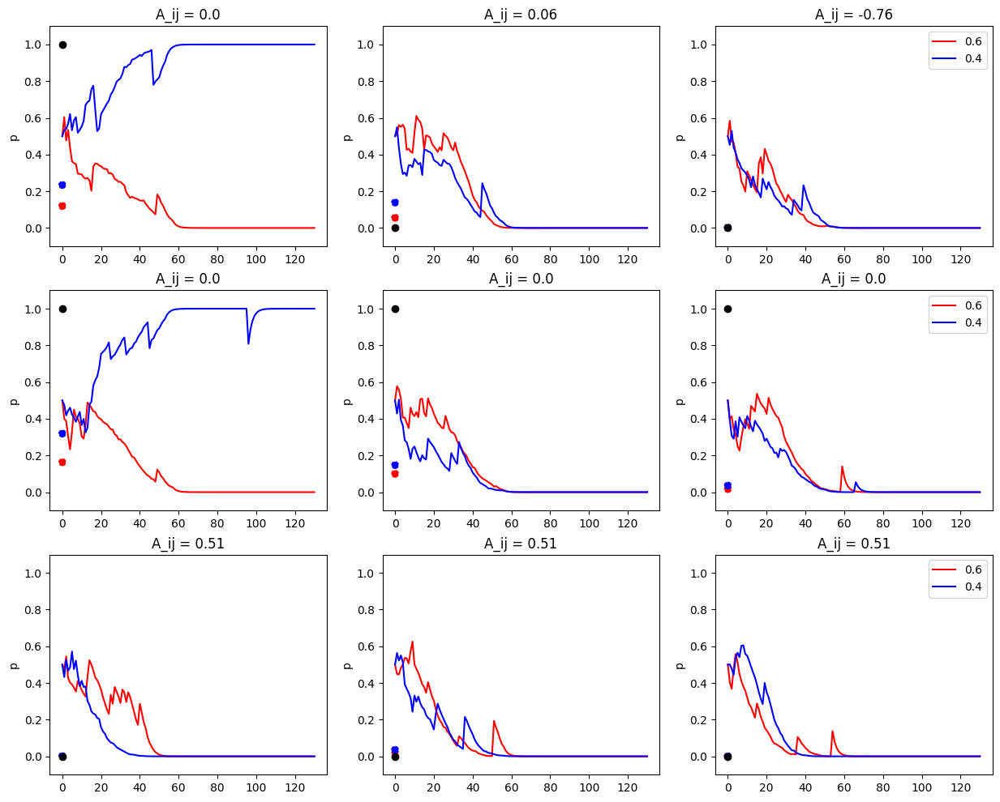

In [96]:
plot_singles([cesim_t[0][0], cesim_t[0][1]], ['0.6', '0.4', '0.25'], 10,  nr_plot = 3, boot_samples=[boots_t[0][0], boots_t[0][1]])

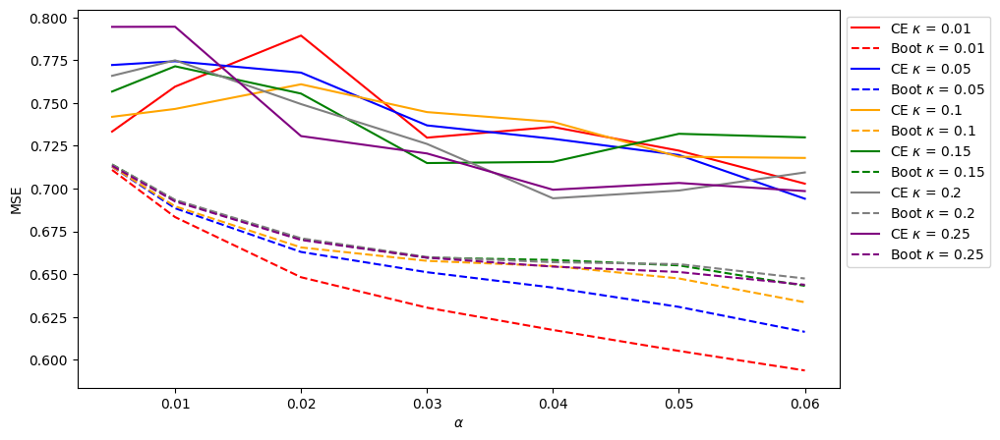

In [97]:
plot_score_singles(alphas,  cesim_t, {i:boots_t[i] for i in range(6)}, it = -1, d = 10, score = 'MSE')

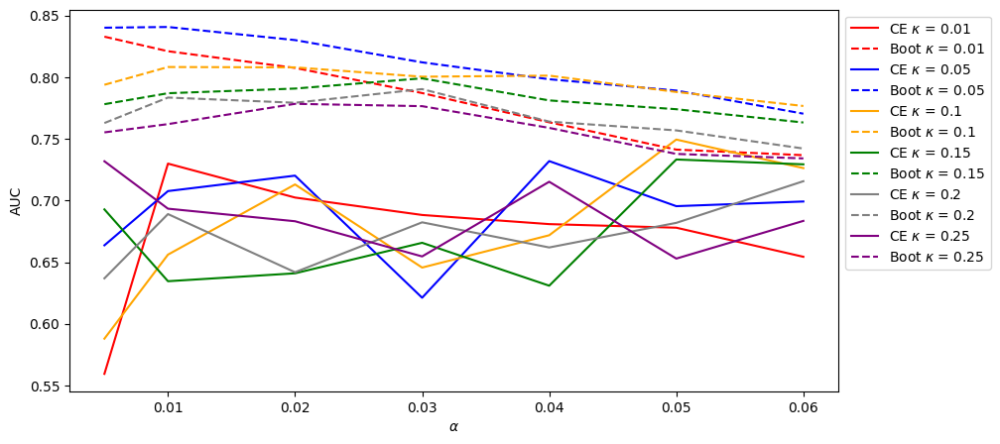

In [98]:
plot_score_singles(alphas,  cesim_t, {i:boots_t[i] for i in range(6)}, it = -1, d = 10, score = 'AUC')

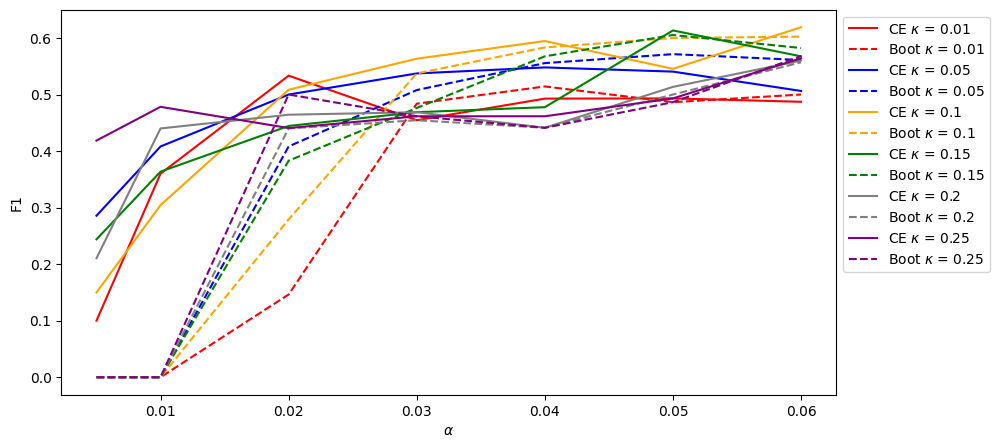

In [99]:
plot_score_singles(alphas,  cesim_t, {i:boots_t[i] for i in range(6)}, it = -1, d = 10, score = 'F1')

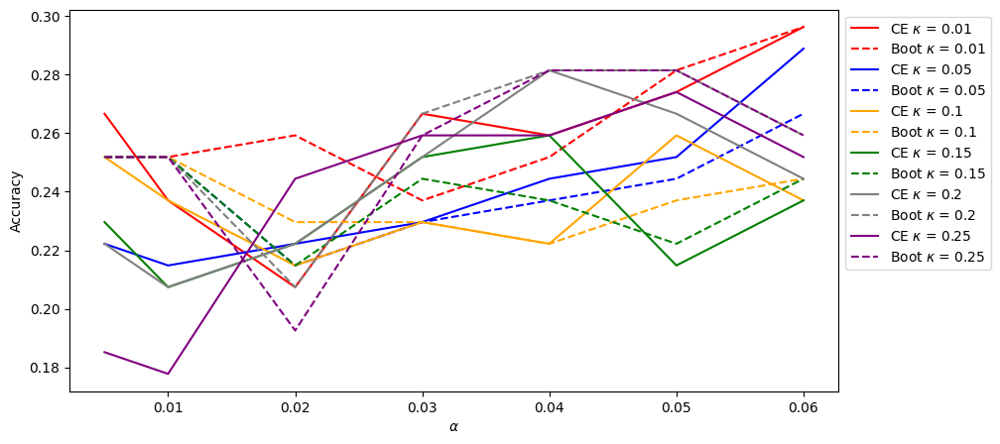

In [100]:
plot_score_singles(alphas,  cesim_t, {i:boots_t[i] for i in range(6)}, it = -1, d = 10, score = 'Accuracy')

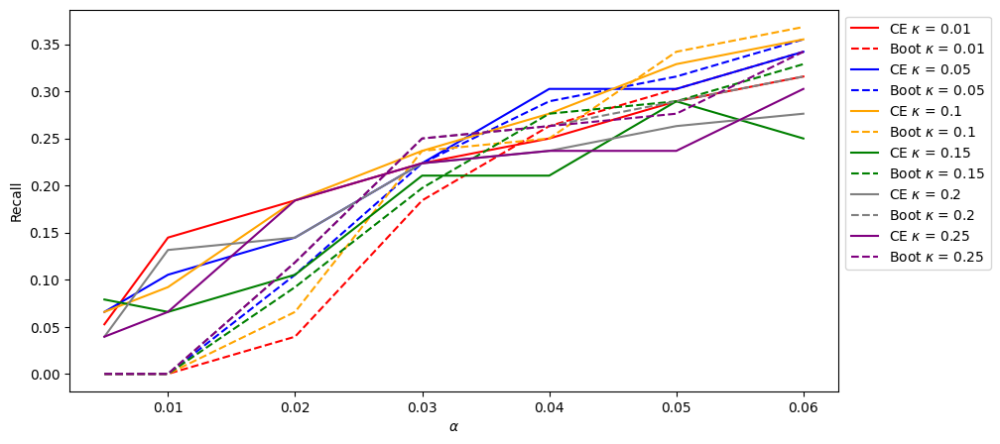

In [22]:
plot_score_singles(alphas,  cesim_t, {i:boots_t[i] for i in range(6)}, it = -1, d = 10, score = 'Recall')

c:\Users\ragna\anaconda3\envs\DyGraph\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ragna\anaconda3\envs\DyGraph\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ragna\anaconda3\envs\DyGraph\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ragna\anaconda3\envs\DyGraph\lib\site-packages\sklearn\metrics\_classi

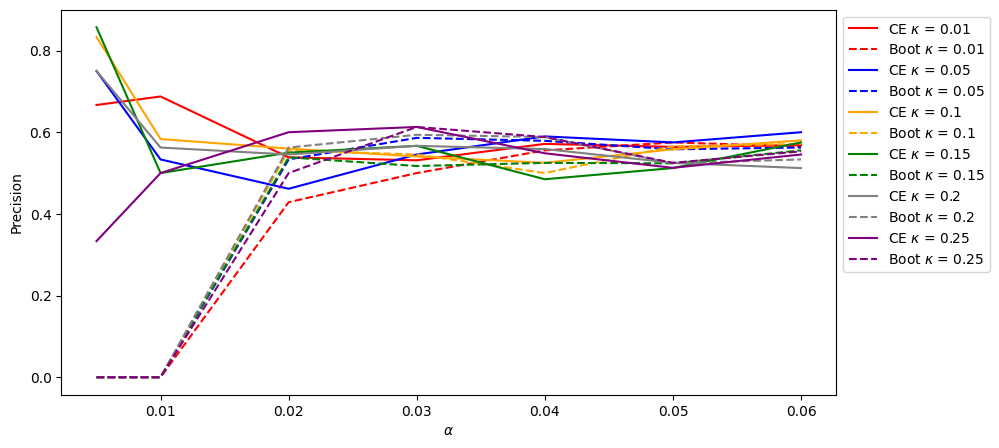

In [59]:
plot_score_singles(alphas,  cesim_t, {i:boots_t[i] for i in range(6)}, it = -1, d = 10, score = 'Precision')

## Plot for paper

In [9]:
tp = 0.6 # 8 6 
metric = 'zero-one'
spar = 0.6
s = 0.4 # 0.4, 0.6
sper = 0.5
N = 1000
ni = 130



kappas = [0.01, 0.05, 0.1, 0.15, 0.2, 0.25]
alphas = [0.005, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06]
cesim = {i:[] for i in range(len(kappas))}


for alpha in alphas:
    for i, kappa in enumerate(kappas):
        with open(f'C:/Users/User/OneDrive/GraphHypTest/single_sim_w500_{N}_gaussian_False_zero-one_xs_xs_ew_s{s}_scsFalse_sctpFalse_spar0.6_tp{tp}_a{alpha}_k{kappa}_ni{ni}_kTrue_perTrue_dbnb_sper{sper}.pkl', 'rb') as handle:
            p01 = pickle.load(handle)
            p01['p_distribution'] = p01['p']
            p01['As'] = gen_local_change(10,spar)

        cesim[i].append(p01)


In [9]:
np.sum(cesim[1][2]['p_distribution'][0,-1,:]>0.95)

4

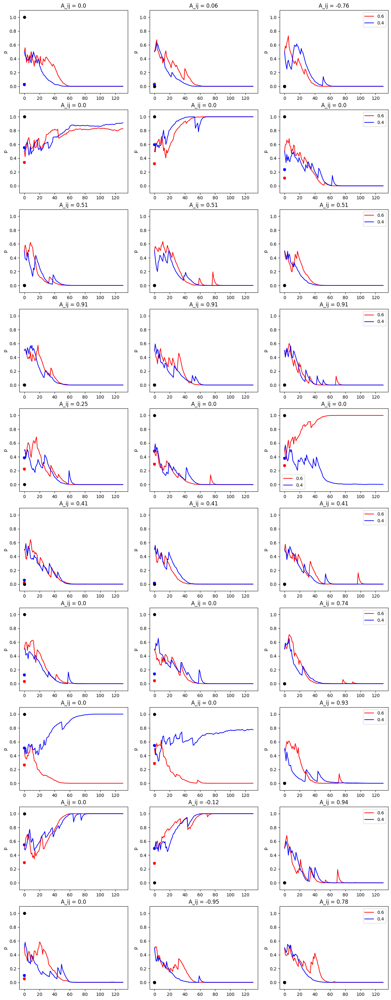

In [10]:
plot_singles([cesim[0][0], cesim[0][1]], ['0.6', '0.4', '0.25'], 10,  nr_plot = 10, boot_samples=[boots_g[0][0], boots_g[0][1]])

In [16]:
def plot_score_singles(alphas, args, boots,  it = -1, d = 10, score = 'MSE' ):
    fig, ax = plt.subplots(1,1, figsize = (10,5))
    colors = ['red', 'blue', 'orange', 'green', 'grey', 'purple', 'yellow', 'brown', 'darkblue']
    kappas = [0.01, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.4]
    from sklearn import metrics
    


    for k in range(len(args)):
        score_cesim = []
        score_boot = []
        for a in range(len(args[0])):

            y = np.abs(np.concatenate((np.sign(np.abs(args[k][a]['As'][0][np.triu_indices(10,1)])), np.sign(np.abs(args[k][a]['As'][1][np.triu_indices(d,1)])), np.sign(np.abs(args[k][a]['As'][2][np.triu_indices(d,1)])))))
            pred = np.concatenate((args[k][a]['p_distribution'][0,it],  args[k][a]['p_distribution'][1,it],  args[k][a]['p_distribution'][2,it]))

            if score == 'MSE':
                score_tmp = np.mean((y-pred)**2)
            elif score == 'Accuracy':
                pred = np.round(pred)
                score_tmp = metrics.accuracy_score(y, pred)
            elif score == 'AUC':
                score_tmp = metrics.roc_auc_score(1-y, pred)
            elif score == 'F1':
                pred = np.round(pred)
                score_tmp = metrics.f1_score(1-y, pred)
            elif score == 'Precision':
                pred = np.round(pred)
                score_tmp = metrics.precision_score(1-y, pred)
            elif score == 'Recall':
                pred = np.round(pred)
                score_tmp = metrics.recall_score(1-y, pred)


            score_cesim.append(score_tmp)

            pred = 1-np.concatenate((boots[k][a][0][np.triu_indices(d,1)], boots[k][a][1][np.triu_indices(d,1)], boots[k][a][2][np.triu_indices(d,1)]))


            if score == 'MSE':
                score_tmp = np.mean((y-pred)**2)
            elif score == 'Accuracy':
                pred = np.round(pred)
                score_tmp = metrics.accuracy_score(y, pred)
            elif score == 'AUC':
                score_tmp = metrics.roc_auc_score(1-y, pred)
            elif score == 'F1':
                pred = np.round(pred)
                score_tmp = metrics.f1_score(1-y, pred)
            elif score == 'Precision':
                pred = np.round(pred)
                score_tmp = metrics.precision_score(1-y, pred)
            elif score == 'Recall':
                pred = np.round(pred)
                score_tmp = metrics.recall_score(1-y, pred)



            score_boot.append(score_tmp)

        string = r'$\kappa$'
        ax.plot(alphas, score_cesim, label = f"CE {string} = {kappas[k]}", color = colors[k])
        ax.plot(alphas, score_boot, label = f"Boot {string} = {kappas[k]}", color = colors[k], linestyle = '--')

    ax.legend(bbox_to_anchor = (1,1))
    ax.set_xlabel(r'$\alpha$')
    ax.set_ylabel(score)

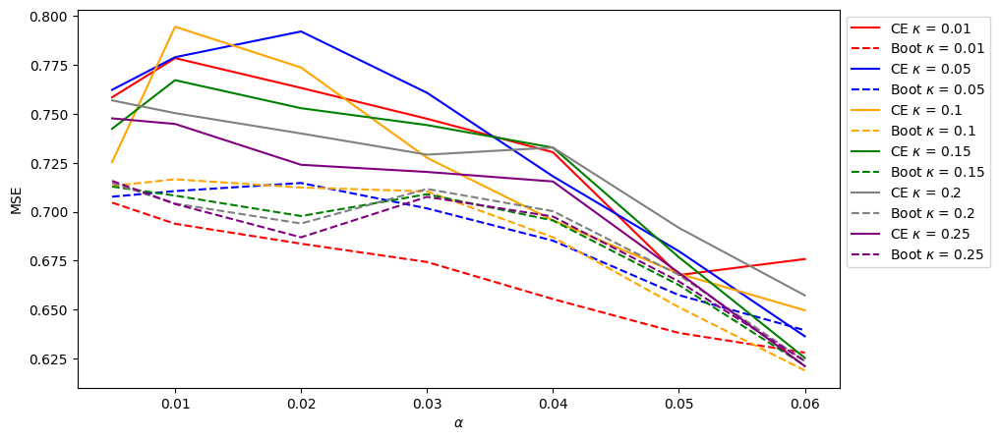

In [17]:

plot_score_singles(alphas,  cesim, {i:boots_g[i] for i in range(6)}, it = -1, d = 10, score = 'MSE')

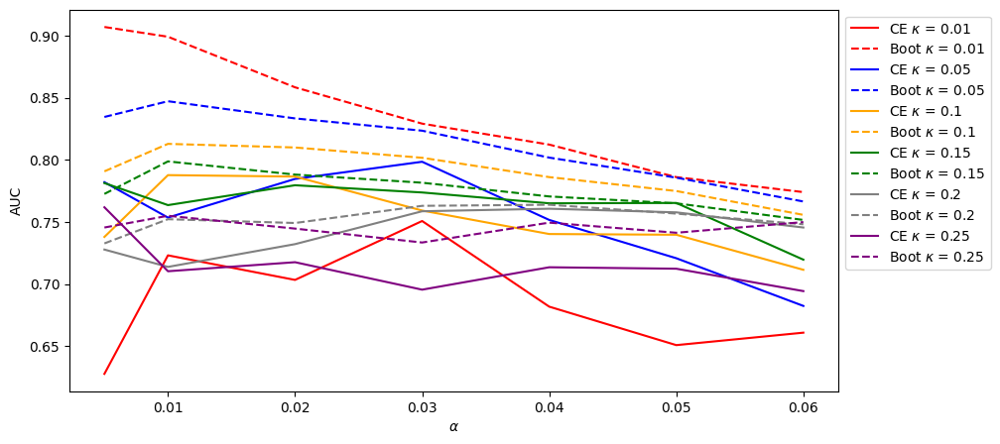

In [47]:
plot_score_singles(alphas,  cesim, {i:boots_g[i] for i in range(6)}, it = -1, d = 10, score = 'AUC')

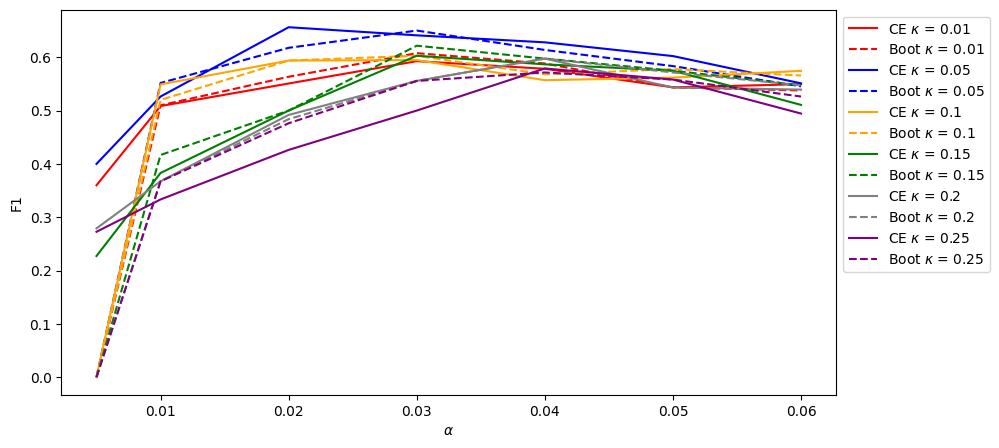

In [48]:
plot_score_singles(alphas,  cesim, {i:boots_g[i] for i in range(6)}, it = -1, d = 10, score = 'F1')

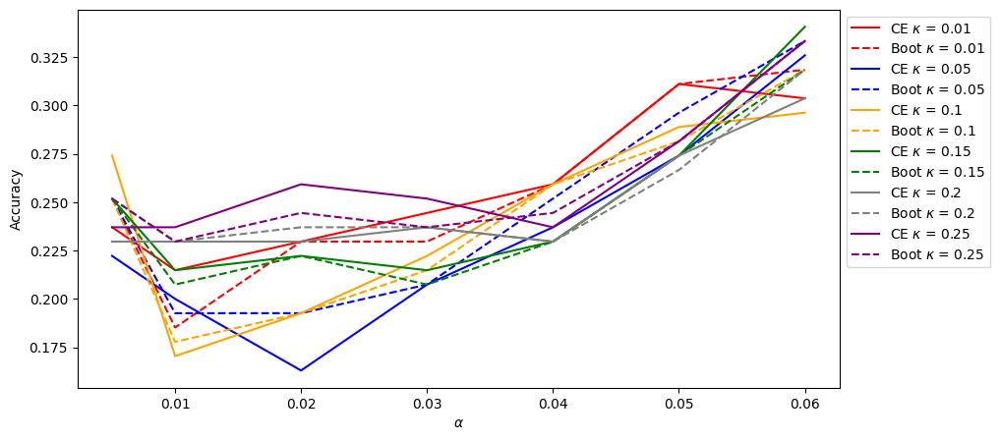

In [18]:
plot_score_singles(alphas,  cesim, {i:boots_g[i] for i in range(6)}, it = -1, d = 10, score = 'Accuracy')

c:\Users\ragna\anaconda3\envs\DyGraph\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ragna\anaconda3\envs\DyGraph\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ragna\anaconda3\envs\DyGraph\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ragna\anaconda3\envs\DyGraph\lib\site-packages\sklearn\metrics\_classi

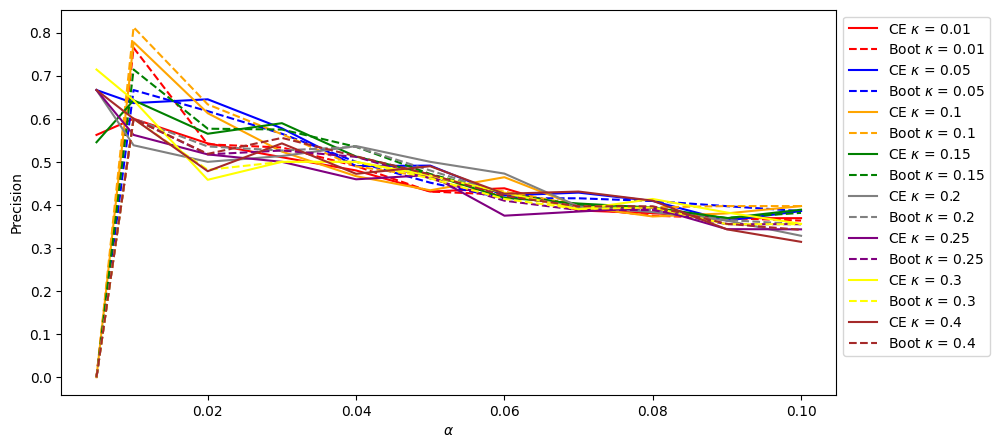

In [58]:
plot_score_singles(alphas,  cesim, boots, it = -1, d = 10, score = 'Precision')

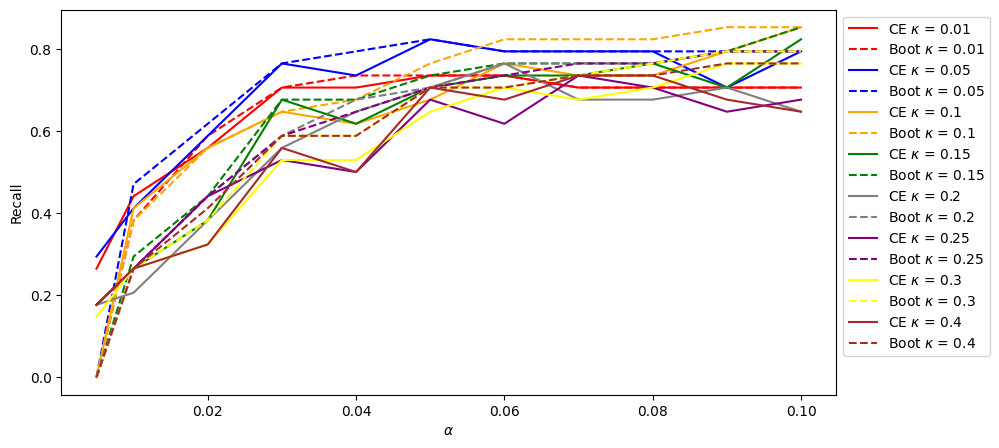

In [59]:
plot_score_singles(alphas,  cesim, boots, it = -1, d = 10, score = 'Recall')

Compare probability and edges

In [20]:
cesim[0][0].keys()

dict_keys(['obs_per_graph', 'lik_type', 'tol', 'X', 'tail_prob', 'N', 'nr_its', 'alpha', 'kappa', 'alpha_in_CE', 'metric', 'used', 'p', 'sigmas', 'thetas_sim', 'value_vals', 's', 'sparsity', 'schedule_s', 'schedule_tp', 'p_distribution', 'As'])

In [29]:
j

1.0

In [32]:
cesim[0][0]['p_distribution'].shape

(3, 131, 45)

In [47]:
cesim[0][0]['As'][:,0,2]

array([0., 0., 0.])

In [53]:
cesim[2][3]['p_distribution'][:,-1,1]

array([0.9694824 , 0.82795797, 0.68973611])

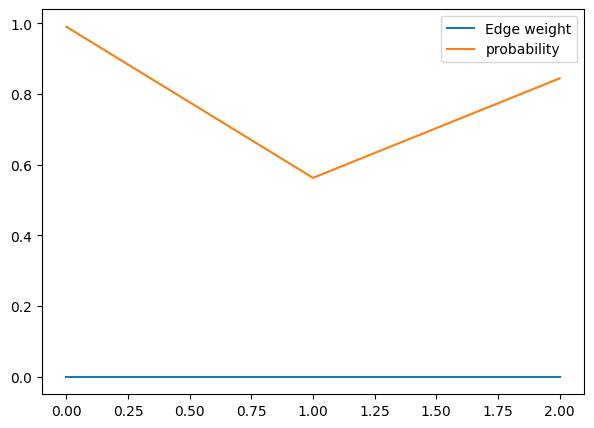

In [55]:
def plot_As_and_p(a_idx, k_idx, k):

    fig, ax = plt.subplots(1,1, figsize = (7,5))

    n = cesim[k_idx][a_idx]['As'].shape[1]
    i = int(n - 2 - np.floor(np.sqrt(-8*k + 4*n*(n-1)-7)/2.0 - 0.5))
    j = int(k + i + 1 - n*(n-1)/2 + (n-i)*((n-i)-1)/2)
    ax.plot(cesim[k_idx][a_idx]['As'][:,i,j], label = 'Edge weight')
    ax.plot(cesim[k_idx][a_idx]['p_distribution'][:,-1,k], label = 'probability')
    ax.legend()

plot_As_and_p(3, 3, 1)

## Effect of perturbation schedule tp and s (from low to increasing)

In [10]:
tp = 0.4 #8 6 4 2 1
metric = 'zero-one'
spar = 0.6
k = 0.01
a = 0.025
s = 0.6

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_2000_gaussian_False_zero-one_xs_xs_ew_s{0.6}_scsTrue_sctpTrue_spar0.6_tp{tp}_a0.025_k0.01_ni100_kTrue_perTrue.pkl', 'rb') as handle:
    p01 = pickle.load(handle)
    p01['p_distribution'] = p01['p']
    p01['As'] = gen_local_change(10,spar)


with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_2000_gaussian_False_zero-one_xs_xs_ew_s{0.4}_scsTrue_sctpTrue_spar0.6_tp{tp}_a0.025_k0.01_ni100_kTrue_perTrue.pkl', 'rb') as handle:
    p02 = pickle.load(handle)
    p02['p_distribution'] = p02['p']
    p02['As'] = gen_local_change(10,spar)


with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_2000_gaussian_False_zero-one_xs_xs_ew_s{0.25}_scsTrue_sctpTrue_spar0.6_tp{tp}_a0.025_k0.01_ni100_kTrue_perTrue.pkl', 'rb') as handle:
    p03 = pickle.load(handle)
    p03['p_distribution'] = p02['p']
    p03['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_2000_gaussian_False_zero-one_xs_xs_ew_s{0.1}_scsTrue_sctpTrue_spar0.6_tp{tp}_a0.025_k0.01_ni100_kTrue_perTrue.pkl', 'rb') as handle:
    p04 = pickle.load(handle)
    p04['p_distribution'] = p04['p']
    p04['As'] = gen_local_change(10,spar)



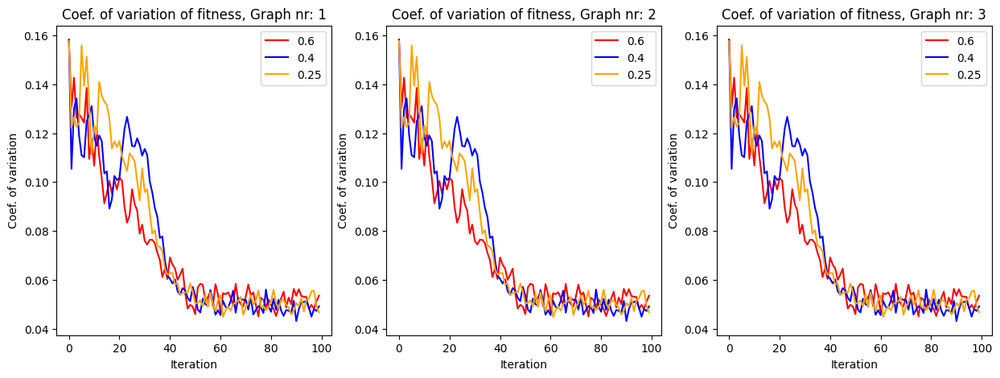

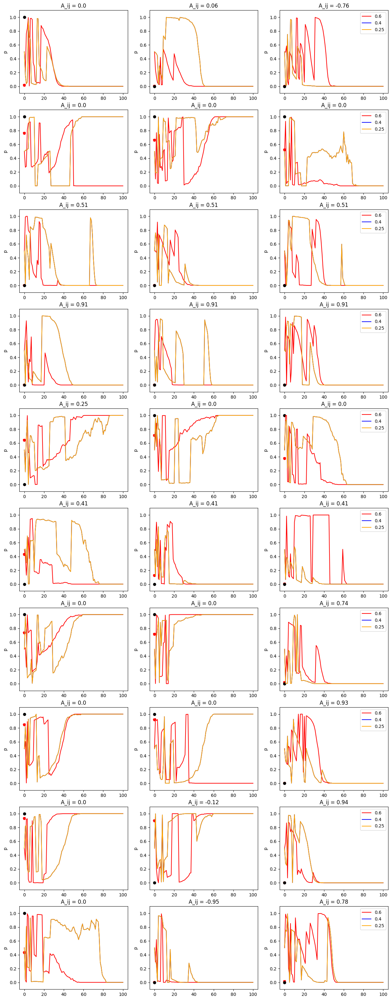

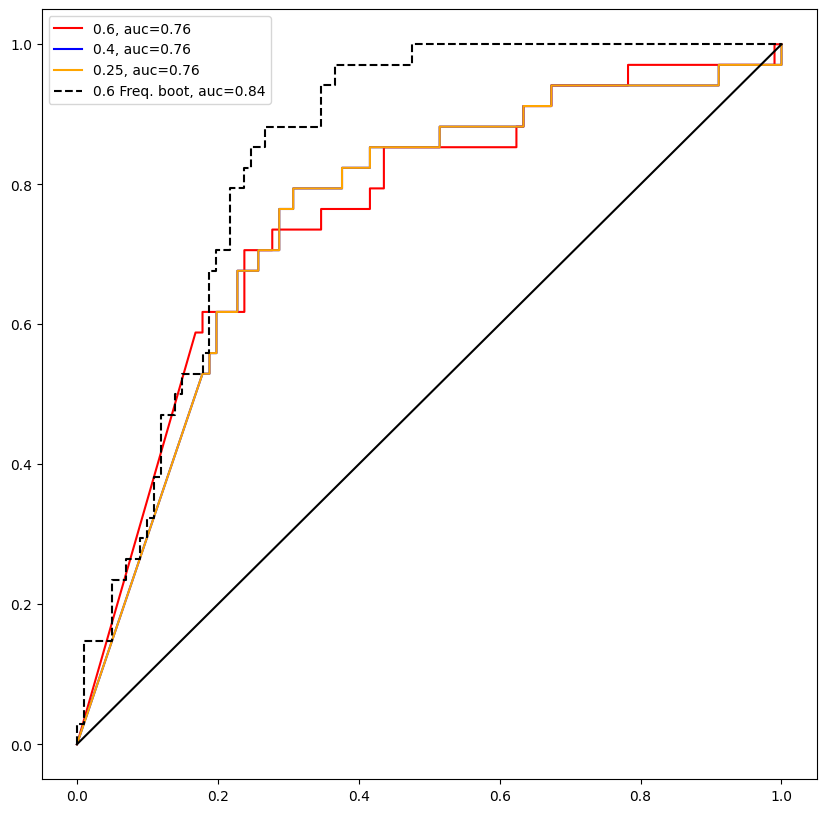

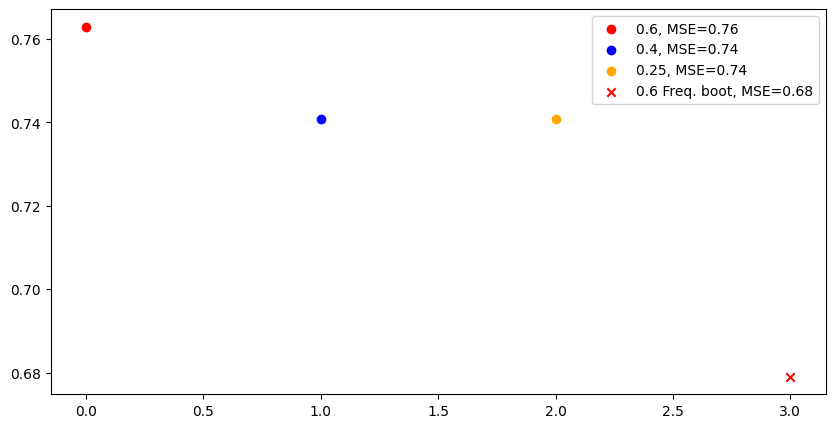

In [14]:
plot_coefvar_singles([p01, p02, p03], ['0.6', '0.4', '0.25'], 10)
plot_singles([p01, p02, p03], ['0.6', '0.4', '0.25'], 10,  nr_plot = 10, boot_samples=[boot_500_025_01])
plot_auc_singles([p01, p02, p03], ['0.6', '0.4', '0.25'], boots = [boot_500_025_01], it = -1, d = 10)
plot_mse_singles([p01, p02, p03], ['0.6', '0.4', '0.25'], boots = [boot_500_025_01], it = -1, d = 10)

## Effect of perturbation with schedule of tail probability (low to incresing)

In [68]:
tp = 0.6 #8 6 4 2 1
metric = 'zero-one'
spar = 0.6
k = 0.01
a = 0.025
s = 0.6

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_2000_gaussian_False_zero-one_xs_xs_ew_s{s}_scsFalse_sctpTrue_spar0.6_tp{0.8}_a0.025_k0.01_ni100_kTrue_perTrue.pkl', 'rb') as handle:
    p01 = pickle.load(handle)
    p01['p_distribution'] = p01['p']
    p01['As'] = gen_local_change(10,spar)


with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_2000_gaussian_False_zero-one_xs_xs_ew_s{s}_scsFalse_sctpTrue_spar0.6_tp{0.6}_a0.025_k0.01_ni100_kTrue_perTrue.pkl', 'rb') as handle:
    p02 = pickle.load(handle)
    p02['p_distribution'] = p02['p']
    p02['As'] = gen_local_change(10,spar)


# with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_2000_gaussian_False_zero-one_xs_xs_ew_s{s}_scsFalse_sctpTrue_spar0.6_tp{0.4}_a0.025_k0.01_ni100_kTrue_perTrue.pkl', 'rb') as handle:
#     p03 = pickle.load(handle)
#     p03['p_distribution'] = p02['p']
#     p03['As'] = gen_local_change(10,spar)

# with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_2000_gaussian_False_zero-one_xs_xs_ew_s{0.1}_scsTrue_sctpTrue_spar0.6_tp{tp}_a0.025_k0.01_ni100_kTrue_perTrue.pkl', 'rb') as handle:
#     p04 = pickle.load(handle)
#     p04['p_distribution'] = p04['p']
#     p04['As'] = gen_local_change(10,spar)



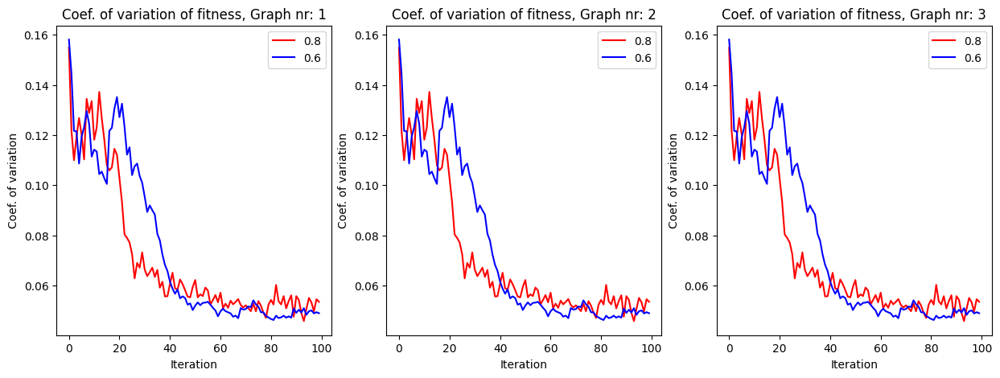

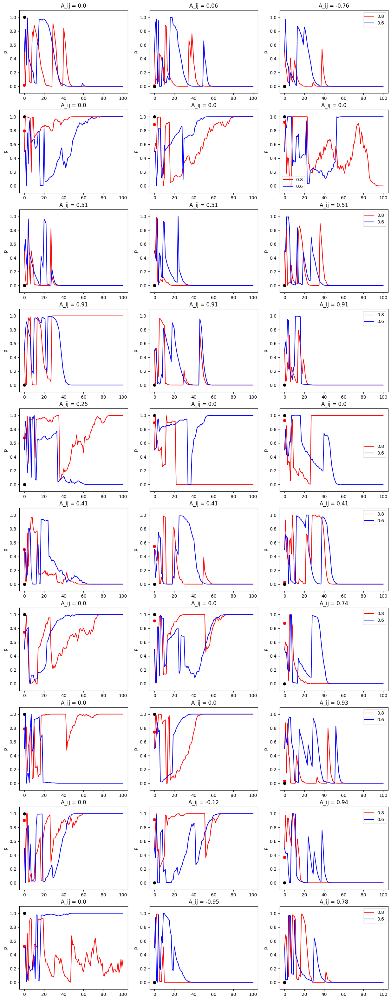

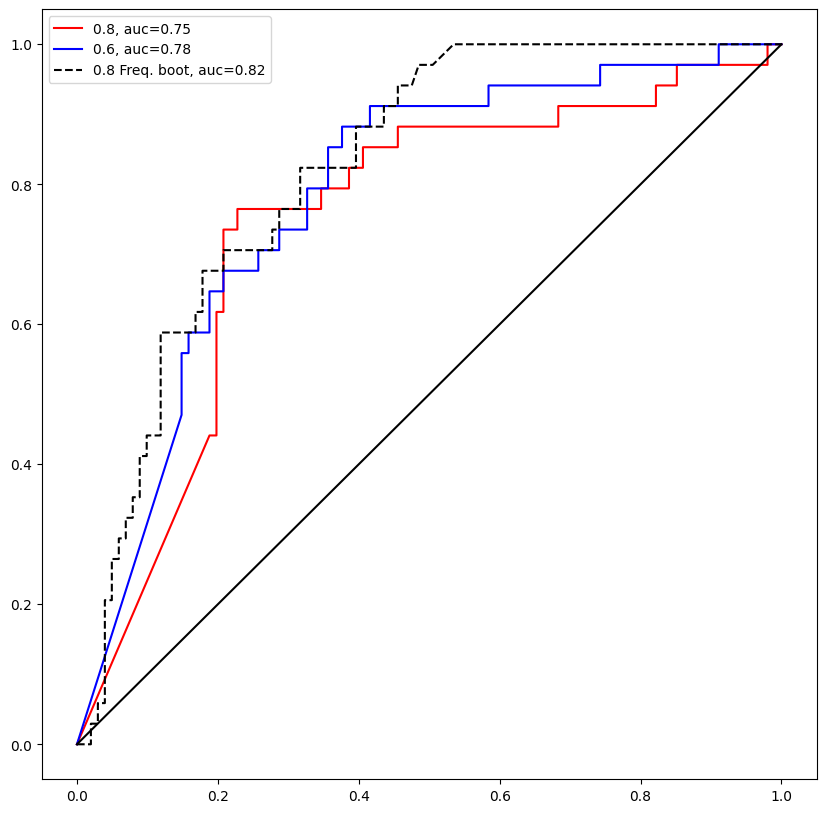

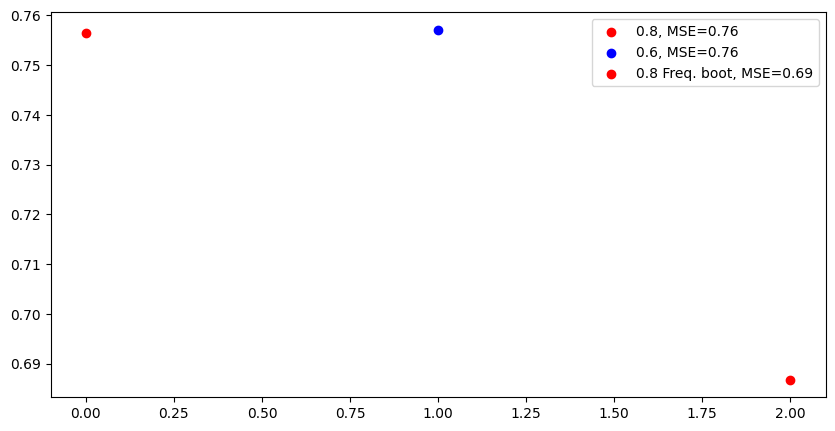

In [69]:
plot_coefvar_singles([p01, p02], ['0.8', '0.6'], 10)
plot_singles([p01, p02], ['0.8', '0.6'], 10,  nr_plot = 10, boot_samples=[boot_500_025_01])
plot_auc_singles([p01, p02], ['0.8', '0.6'], boots = [boot_500_025_01], it = -1, d = 10)
plot_mse_singles([p01, p02], ['0.8', '0.6'], boots = [boot_500_025_01], it = -1, d = 10)

## Effect of perturbation schedule of s

In [ ]:
tp = 0.6 #8 6 4 2 1
metric = 'zero-one'
spar = 0.6
k = 0.01
a = 0.025
s = 0.6

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_2000_gaussian_False_zero-one_xs_xs_ew_s{0.6}_scsTrue_sctpFalse_spar0.6_tp{tp}_a0.025_k0.01_ni100_kTrue_perTrue.pkl', 'rb') as handle:
    p01 = pickle.load(handle)
    p01['p_distribution'] = p01['p']
    p01['As'] = gen_local_change(10,spar)


with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_2000_gaussian_False_zero-one_xs_xs_ew_s{0.4}_scsTrue_sctpFalse_spar0.6_tp{tp}_a0.025_k0.01_ni100_kTrue_perTrue.pkl', 'rb') as handle:
    p02 = pickle.load(handle)
    p02['p_distribution'] = p02['p']
    p02['As'] = gen_local_change(10,spar)


with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_2000_gaussian_False_zero-one_xs_xs_ew_s{0.25}_scsTrue_sctpFalse_spar0.6_tp{tp}_a0.025_k0.01_ni100_kTrue_perTrue.pkl', 'rb') as handle:
    p03 = pickle.load(handle)
    p03['p_distribution'] = p02['p']
    p03['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_2000_gaussian_False_zero-one_xs_xs_ew_s{0.1}_scsTrue_sctpFalse_spar0.6_tp{tp}_a0.025_k0.01_ni100_kTrue_perTrue.pkl', 'rb') as handle:
    p04 = pickle.load(handle)
    p04['p_distribution'] = p04['p']
    p04['As'] = gen_local_change(10,spar)

In [ ]:
plot_coefvar_singles([p01, p02, p03, p04], ['0.6', '0.4', '0.25', '0.1'], 10)
plot_singles([p01, p02, p03, p04], ['0.6', '0.4', '0.25', '0.1'], 10,  nr_plot = 10, boot_samples=[boot_500_025_01])
plot_auc_singles([p01, p02, p03, p04], ['0.6', '0.4', '0.25', '0.1'], boots = [boot_500_025_01], it = -1, d = 10)
plot_mse_singles([p01, p02, p03, p04], ['0.6', '0.4', '0.25', '0.1'], boots = [boot_500_025_01], it = -1, d = 10)

## Compare Cai and zero-one

In [11]:
tp = 0.6
metric = 'zero-one'
s = 0.6
spar = 0.6
k = 0.05
a = 0.025

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_zero-one_xs_xs_ew_s{0.6}_spar{spar}_tp{tp}_a{a}_k{k}_ni50_kTrue.pkl', 'rb') as handle:
    zo = pickle.load(handle)
    zo['p_distribution'] = zo['p']
    zo['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_cai_xs_xs_ew_s{0.6}_spar{spar}_tp{tp}_a{a}_k{k}_ni50_kTrue.pkl', 'rb') as handle:
    cai = pickle.load(handle)
    cai['p_distribution'] = cai['p']
    cai['As'] = gen_local_change(10,spar)


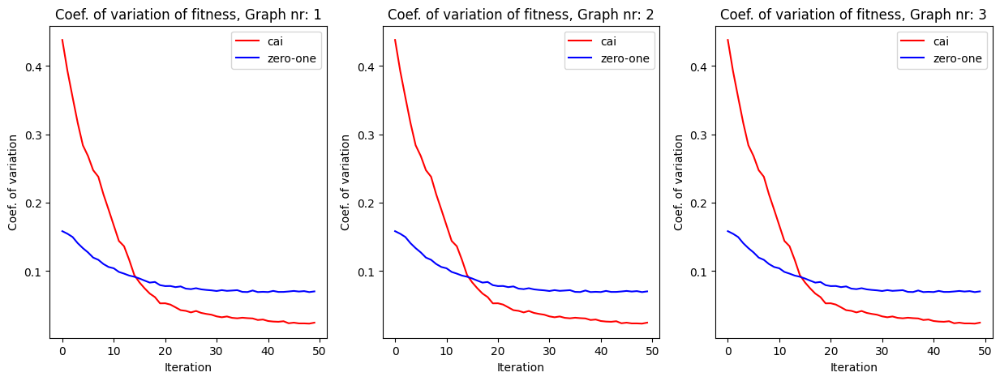

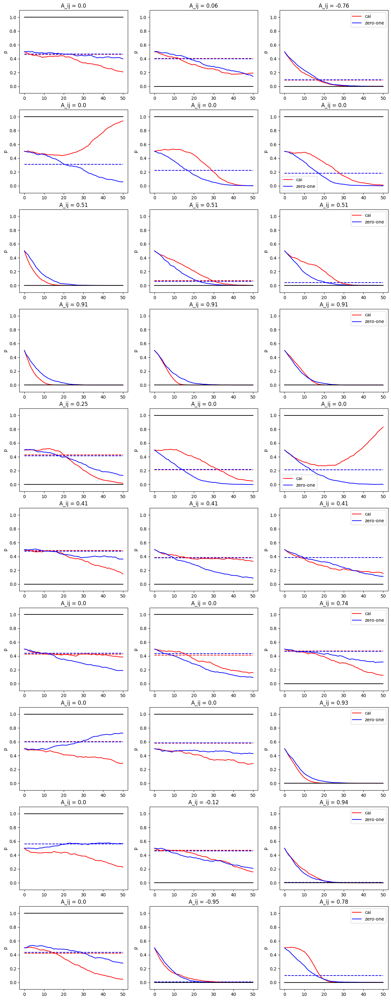

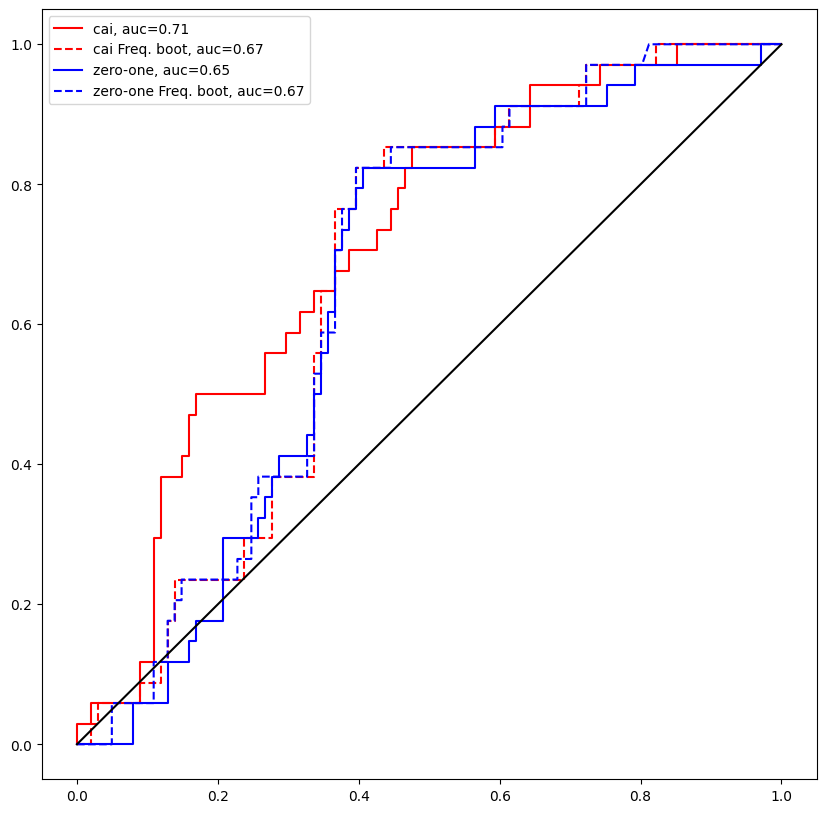

In [36]:
plot_coefvar_singles([cai, zo], ['cai', 'zero-one'], 10)
plot_singles([cai, zo], ['cai', 'zero-one'], 10,  nr_plot = 10)
plot_auc_singles([cai, zo], ['cai', 'zero-one'], it = 15, d = 10)

## Compare tail probabilities

In [37]:
tp = 0.6
s = 0.6
spar = 0.6
k = 0.05
a = 0.025
metric = 'cai'

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_{metric}_xs_xs_ew_s{s}_spar{spar}_tp0.5_a{a}_k{k}_ni50_kTrue.pkl', 'rb') as handle:
    tp05 = pickle.load(handle)
    tp05['p_distribution'] = tp05['p']
    tp05['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_{metric}_xs_xs_ew_s{s}_spar{spar}_tp0.6_a{a}_k{k}_ni50_kTrue.pkl', 'rb') as handle:
    tp06 = pickle.load(handle)
    tp06['p_distribution'] = tp06['p']
    tp06['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_{metric}_xs_xs_ew_s{s}_spar{spar}_tp0.8_a{a}_k{k}_ni50_kTrue.pkl', 'rb') as handle:
    tp08 = pickle.load(handle)
    tp08['p_distribution'] = tp08['p']
    tp08['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_{metric}_xs_xs_ew_s{s}_spar{spar}_tp0.9_a{a}_k{k}_ni50_kTrue.pkl', 'rb') as handle:
    tp09 = pickle.load(handle)
    tp09['p_distribution'] = tp09['p']
    tp09['As'] = gen_local_change(10,spar)



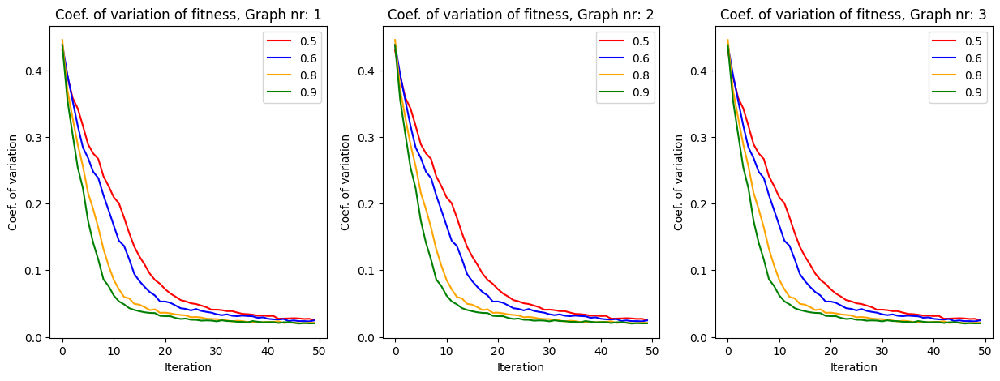

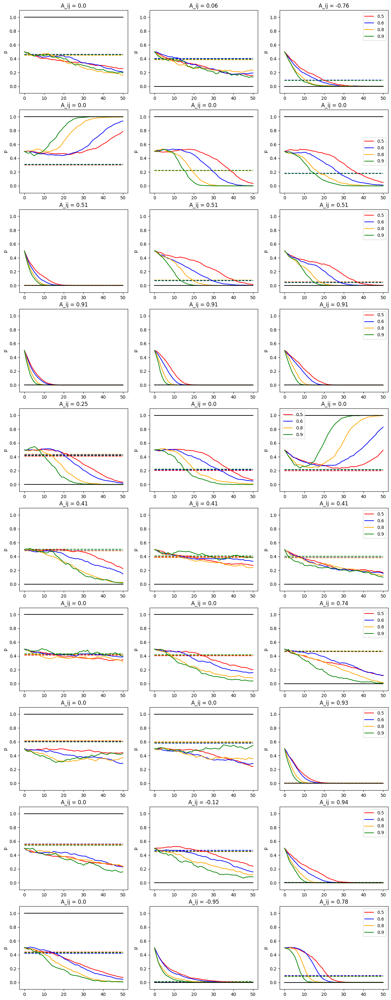

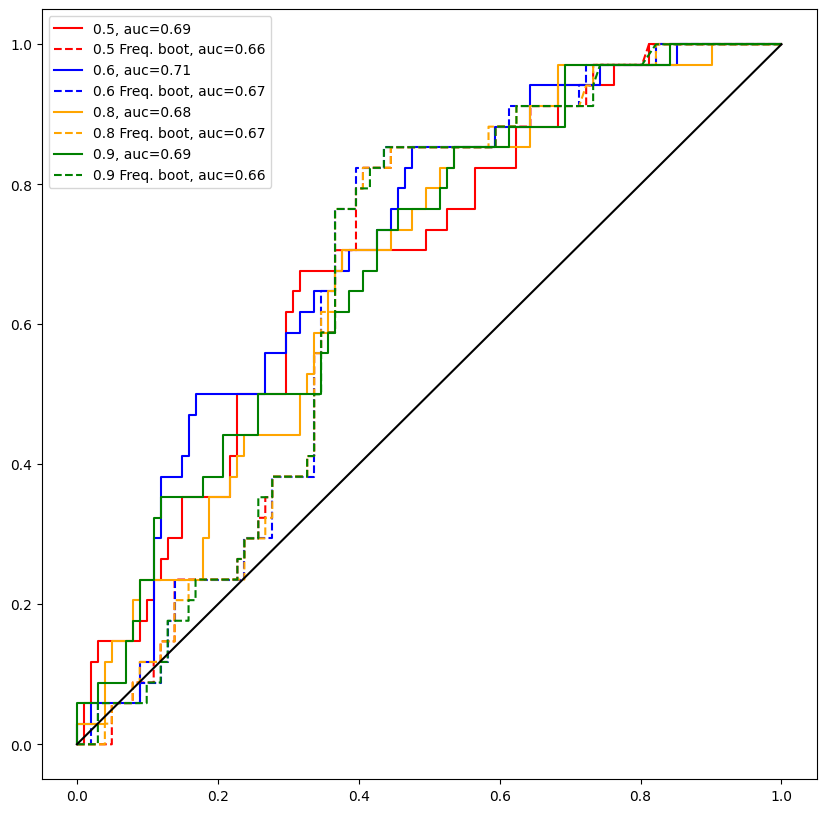

In [57]:
plot_coefvar_singles([tp05, tp06, tp08, tp09], ['0.5', '0.6', '0.8', '0.9'], 10)
plot_singles([tp05, tp06, tp08, tp09], ['0.5', '0.6', '0.8', '0.9'], 10,  nr_plot = 10)
plot_auc_singles([tp05, tp06, tp08, tp09], ['0.5', '0.6', '0.8', '0.9'], it = 15, d = 10)

## Compare number of iterations

In [38]:
tp = 0.6
s = 0.6
spar = 0.6
k = 0.05
a = 0.025
metric = 'zero-one'

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_{metric}_xs_xs_ew_s{s}_spar{spar}_tp{tp}_a{a}_k{k}_ni50_kTrue.pkl', 'rb') as handle:
    CE5000 = pickle.load(handle)
    CE5000['p_distribution'] = CE5000['p']
    CE5000['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_20000_gaussian_False_{metric}_xs_xs_ew_s{s}_spar{spar}_tp{tp}_a{a}_k{k}_ni50_kTrue.pkl', 'rb') as handle:
    CE20000 = pickle.load(handle)
    CE20000['p_distribution'] = CE20000['p']
    CE20000['As'] = gen_local_change(10,spar)

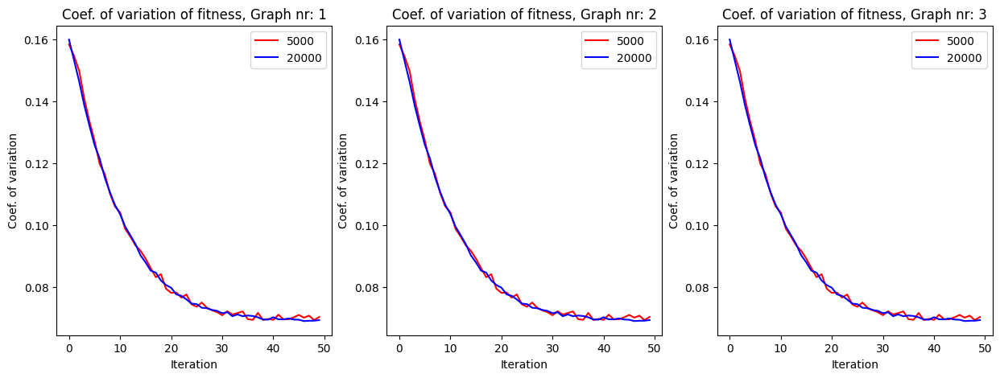

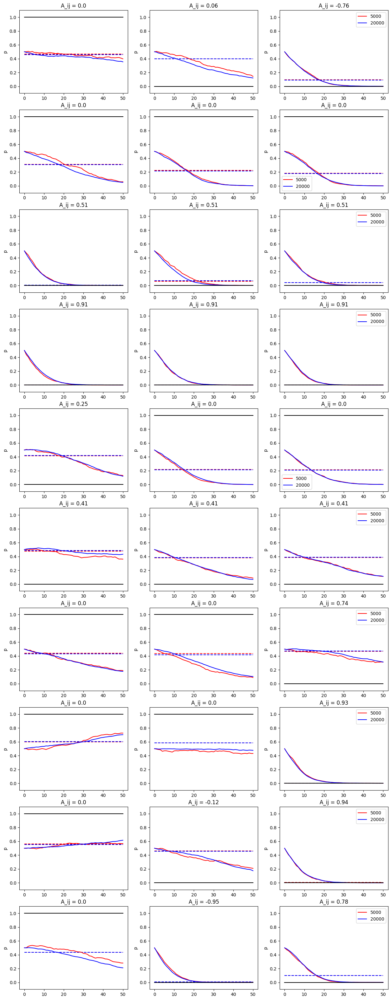

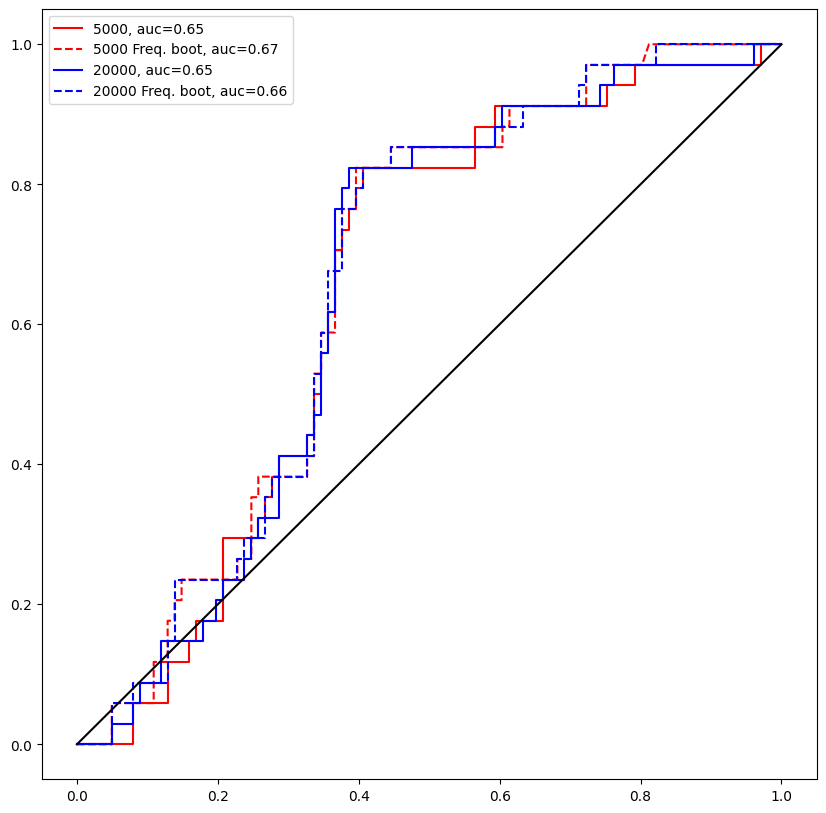

In [60]:
plot_coefvar_singles([CE5000, CE20000], ['5000', '20000'], 10)
plot_singles([CE5000, CE20000], ['5000', '20000'], 10,  nr_plot = 10)
plot_auc_singles([CE5000, CE20000], ['5000', '20000'], it = 15, d = 10)

## Bootstrap or not?

In [13]:
tp = 0.3 #8 6 4 2 1
metric = 'zero-one'
spar = 0.6
k = 0.01
a = 0.025
s = 0.6

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_1000_gaussian_False_zero-one_xs_xs_ew_s{s}_spar0.6_tp{tp}_a0.025_k0.01_ni200_kTrue_dbFalse.pkl', 'rb') as handle:
    dbF01 = pickle.load(handle)
    dbF01['p_distribution'] = dbF01['p']
    dbF01['As'] = gen_local_change(10,spar)


with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_1000_gaussian_False_zero-one_xs_xs_ew_s{s}_spar0.6_tp{tp}_a0.025_k0.01_ni200_kTrue_dbTrue.pkl', 'rb') as handle:
    dbT01 = pickle.load(handle)
    dbT01['p_distribution'] = dbT01['p']
    dbT01['As'] = gen_local_change(10,spar)







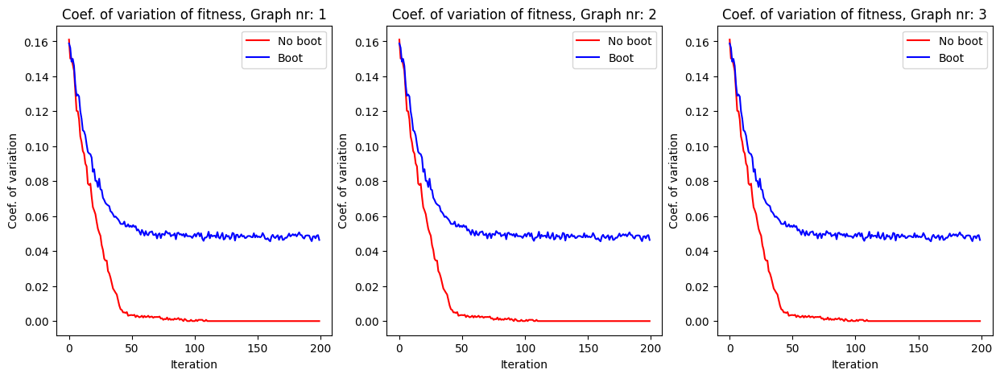

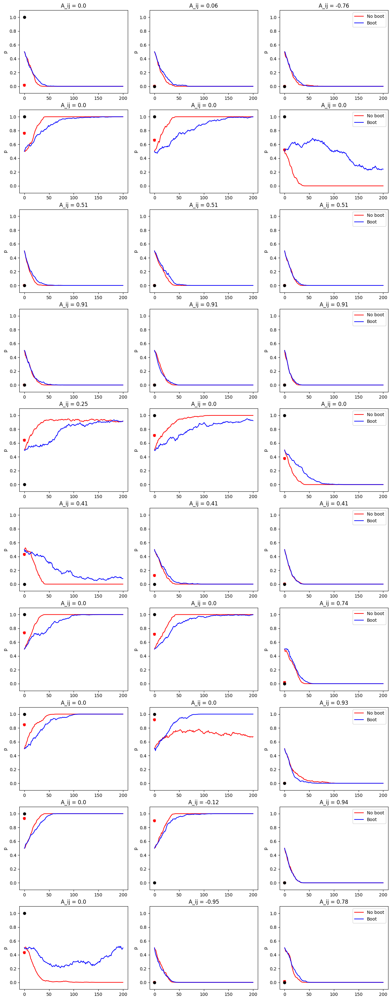

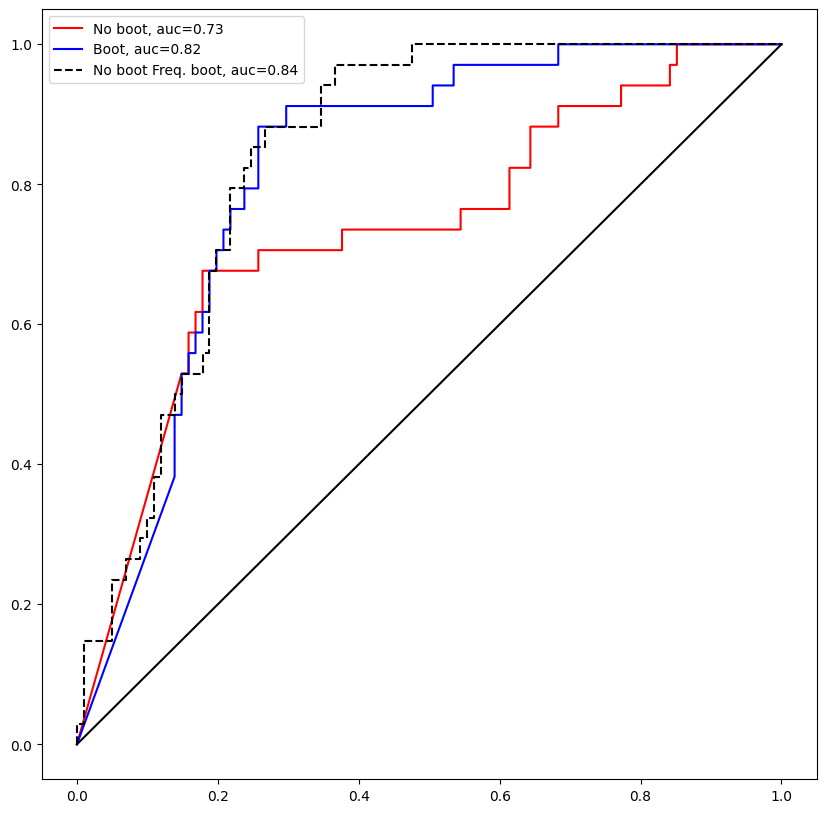

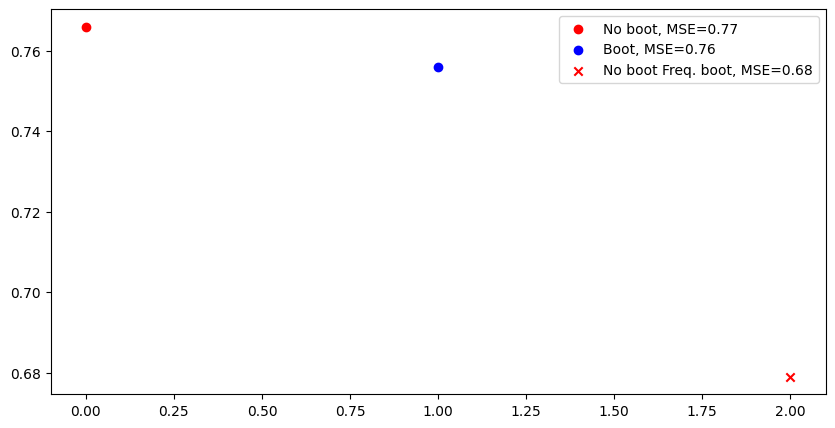

In [14]:
plot_coefvar_singles([dbF01, dbT01], ['No boot', 'Boot'], 10)
plot_singles([dbF01, dbT01], ['No boot', 'Boot'], 10,  nr_plot = 10, boot_samples=[boot_500_025_01])
plot_auc_singles([dbF01, dbT01], ['No boot', 'Boot'], boots = [boot_500_025_01], it = -1, d = 10)
plot_mse_singles([dbF01, dbT01], ['No boot', 'Boot'], boots = [boot_500_025_01], it = -1, d = 10)